# FIFA 18 Transfer GM Python Notebook

## Goal

The goal of the analysis is to predict the in-game market value of a FIFA 18 player, given their position and player ratings, with the idea that any transfer decisions regarding player value can be informed with this model.

## Key Assumptions & Limitations
1. We're assuming that all ratings are accurate and complete. This is probably not true for lesser known leagues where there is less scouting done.
2. We are assuming that all ratings are related to stats only, and not some behind the scenes additional calculations or factors.
3. This analysis is done in a vacuum at a specific point in time, with nothing else like National team performance or agent shenanigans affecting player value. 

## Data Cleaning and Preparation

### Admin - Load relevant packages and data file

In [1]:
#import relevant packages
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

### FIFA Stats Data Loading and Cleaning

In [2]:
#read in data - the file is huge
df = pd.read_csv("~/Desktop/complete_v3.csv", low_memory=False)
df.head()

,full_name,club,league,age,birth_date,height_cm,weight_kg,body_type,nationality,eur_value,...,composure,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,position
0,C. Ronaldo dos Santos Aveiro,Real Madrid CF,Spanish Primera Division,32,5/02/1985,185,80,C. Ronaldo,Portugal,95500000,...,95,22,31,23,7,11,15,14,11,Forward
1,Lionel Messi,FC Barcelona,Spanish Primera Division,30,24/06/1987,170,72,Messi,Argentina,105000000,...,96,13,28,26,6,11,15,14,8,Forward
2,Neymar da Silva Santos Jr.,Paris Saint-Germain,French Ligue 1,25,5/02/1992,175,68,Neymar,Brazil,123000000,...,92,21,24,33,9,9,15,15,11,Forward
3,Luis Suarez,FC Barcelona,Spanish Primera Division,30,24/01/1987,182,86,Normal,Uruguay,97000000,...,83,30,45,38,27,25,31,33,37,Forward
4,Manuel Neuer,FC Bayern Munich,German Bundesliga,31,27/03/1986,193,92,Normal,Germany,61000000,...,70,10,10,11,91,90,95,91,89,Goalkeeper


In [3]:
#selection of performance related variables (i.e. ignore animation related variables). Reset Indices
df_reduce = df[['eur_value'
                , 'eur_release_clause'
                , 'eur_wage'
                , 'overall'
                , 'height_cm'
                , 'weight_kg'
                , 'age'
                , 'pac'
                , 'sho'
                , 'pas'
                , 'dri'
                , 'def'
                , 'phy'
                , 'skill_moves'
                , 'preferred_foot'
                , 'weak_foot'
                , 'work_rate_att'
                , 'work_rate_def'
                , 'crossing'
                , 'finishing'
                , 'heading_accuracy'
                , 'short_passing'
                , 'volleys'
                , 'dribbling'
                , 'curve'
                , 'free_kick_accuracy'
                , 'long_passing'
                , 'ball_control'
                , 'acceleration'
                , 'sprint_speed'
                , 'agility'
                , 'reactions'
                , 'balance'
                , 'shot_power'
                , 'jumping'
                , 'stamina'
                , 'strength'
                , 'long_shots'
                , 'aggression'
                , 'interceptions'
                , 'positioning'
                , 'vision'
                , 'penalties'
                , 'composure'
                , 'marking'
                , 'standing_tackle'
                , 'sliding_tackle'
                , 'gk_diving'
                , 'gk_handling'
                , 'gk_kicking'
                , 'gk_positioning'
                , 'gk_reflexes'
                , 'position']].reset_index(drop=True)

In [4]:
#get dummies of Preferred Foot (1 = Right Foot)
df_reduce['prefer_foot'] = pd.get_dummies(df['preferred_foot'], drop_first = True)
df_reduce.head()

,eur_value,eur_release_clause,eur_wage,overall,height_cm,weight_kg,age,pac,sho,pas,...,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,position,prefer_foot
0,95500000,195800000.0,565000,94,185,80,32,90,93,82,...,22,31,23,7,11,15,14,11,Forward,1
1,105000000,215300000.0,565000,93,170,72,30,89,90,86,...,13,28,26,6,11,15,14,8,Forward,0
2,123000000,236800000.0,280000,92,175,68,25,92,84,79,...,21,24,33,9,9,15,15,11,Forward,1
3,97000000,198900000.0,510000,92,182,86,30,82,90,79,...,30,45,38,27,25,31,33,37,Forward,1
4,61000000,100700000.0,230000,92,193,92,31,91,90,95,...,10,10,11,91,90,95,91,89,Goalkeeper,1


In [5]:
#what are the positional flags in our dataset?
df_reduce.position.unique()

array(['Forward', 'Goalkeeper', 'Midfielder', 'Defender'], dtype=object)

In [6]:
#Split up Dataframes into 4 frames by position
#get rid of position flag - we don't need it
df_fwd = df_reduce.loc[df_reduce['position'] == 'Forward'].drop(columns = ['position', 'eur_release_clause', 'eur_wage', 'preferred_foot', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_positioning', 'gk_reflexes'])
df_mid = df_reduce.loc[df_reduce['position'] == 'Midfielder'].drop(columns = ['position','eur_release_clause', 'eur_wage','preferred_foot', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_positioning', 'gk_reflexes'])
df_def = df_reduce.loc[df_reduce['position'] == 'Defender'].drop(columns = ['position','eur_release_clause', 'eur_wage', 'preferred_foot', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_positioning', 'gk_reflexes'])
df_gk = df_reduce.loc[df_reduce['position'] == 'Goalkeeper'].drop(['position', 'eur_release_clause', 'eur_wage','preferred_foot'], axis=1)

In [7]:
#Final check if data is clean?
df_fwd.head()

,eur_value,overall,height_cm,weight_kg,age,pac,sho,pas,dri,def,...,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,prefer_foot
0,95500000,94,185,80,32,90,93,82,90,33,...,63,29,95,85,85,95,22,31,23,1
1,105000000,93,170,72,30,89,90,86,96,26,...,48,22,93,90,78,96,13,28,26,0
2,123000000,92,175,68,25,92,84,79,95,30,...,56,36,90,80,81,92,21,24,33,1
3,97000000,92,182,86,30,82,90,79,87,42,...,78,41,92,84,85,83,30,45,38,1
5,92000000,91,185,79,28,81,88,75,86,38,...,80,39,91,78,84,87,25,42,19,1


## EDA & Wrangling - Forwards

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


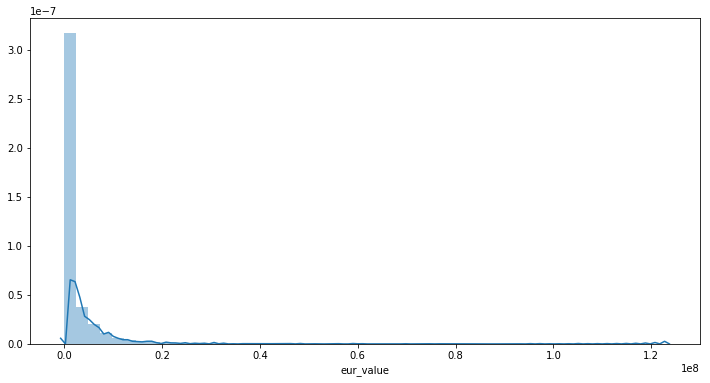

In [8]:
#Plot Distribution of Target Variable.
plt.figure(figsize=(12, 6))
sns.distplot(df_fwd['eur_value'])

There's a very strong right skew to this data. A natural log of this will need to be taken for modelling purposes.

In [9]:
#drop zero & null values
df_fwd = df_fwd[df_fwd['eur_value'].notnull() & (df_fwd['eur_value'] != 0)]

#Log transform Y output values
df_fwd['eur_value_log'] = np.log(df_fwd['eur_value'])
df_fwd.head()

,eur_value,overall,height_cm,weight_kg,age,pac,sho,pas,dri,def,...,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,prefer_foot,eur_value_log
0,95500000,94,185,80,32,90,93,82,90,33,...,29,95,85,85,95,22,31,23,1,18.374637
1,105000000,93,170,72,30,89,90,86,96,26,...,22,93,90,78,96,13,28,26,0,18.469471
2,123000000,92,175,68,25,92,84,79,95,30,...,36,90,80,81,92,21,24,33,1,18.627695
3,97000000,92,182,86,30,82,90,79,87,42,...,41,92,84,85,83,30,45,38,1,18.390222
5,92000000,91,185,79,28,81,88,75,86,38,...,39,91,78,84,87,25,42,19,1,18.337299


/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


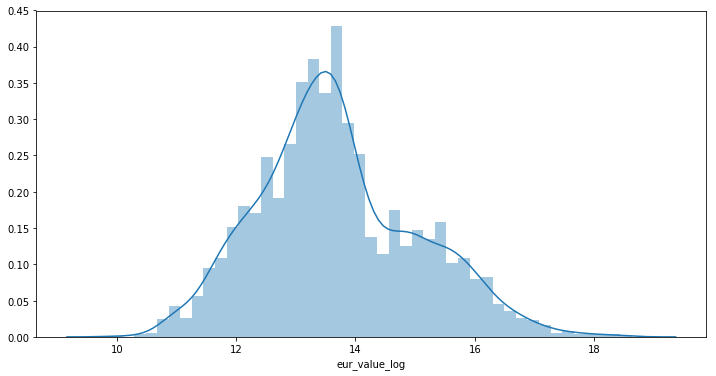

In [10]:
#Did log make a difference
plt.figure(figsize=(12, 6))
sns.distplot(df_fwd['eur_value_log'])

Distribution now looks much more normal than before, though there does appear to be some bimodal tendencies to the data.

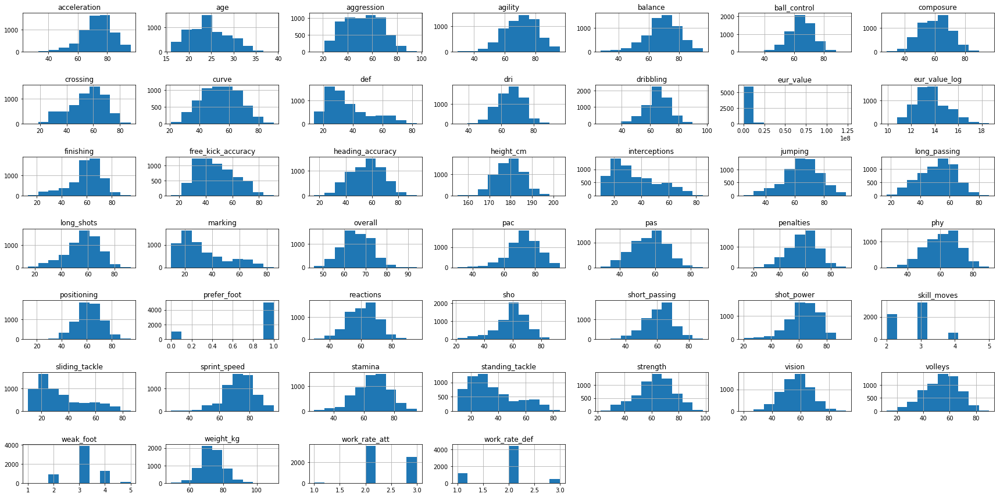

In [11]:
#Plot distributions of each predictor variable
hist = df_fwd.hist(figsize = (24,12))
plt.tight_layout()

The vast majority of predictor variables look like they're normally distributed. 
Free Kick Accuracy and some defensive stats don't appear to be normally distributed, but:
1. These are important to modern forwards. 
2. Aren't strictly required to be normally distributed for modelling purposes.

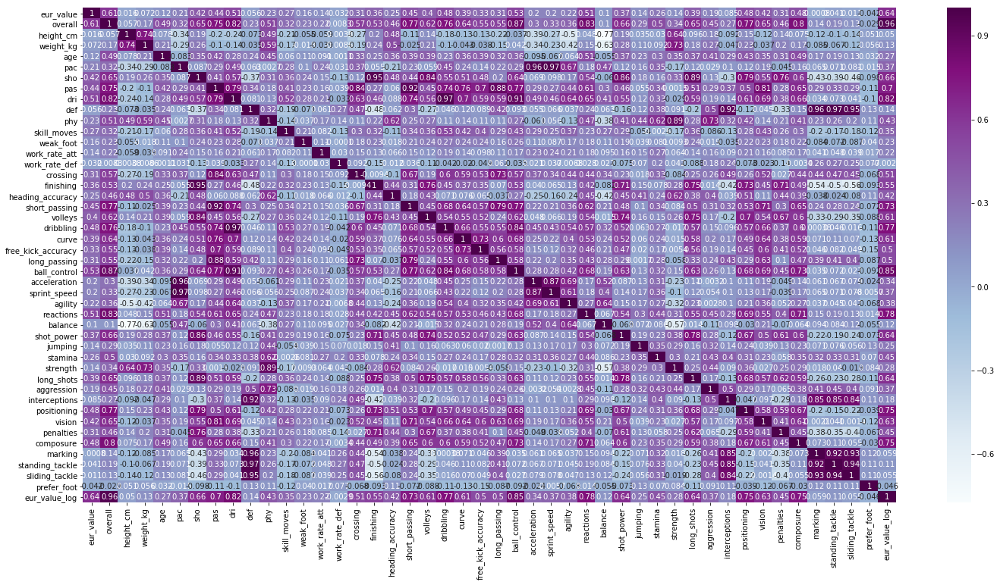

In [12]:
#Look at correlations to identify potential multicollinearity
df_fwd_heat = df_fwd.corr()
plt.figure(figsize=(24, 12))
sns.heatmap(df_fwd_heat, annot = True, cmap = 'BuPu')

The majority of variables don't appear to be too highly correlated with each other, but many of the 'parent' variables correlate quite strongly with the relevant sub-statistics (e.g. sho with long_shots, def with tackling, etc.) These will need to be dropped. Weight & sliding tackle will also be dropped, as these correlate highly with height and standing tackle respectively. 

There's also a very high correlation with 'overall' - this needs to be dropped as this encompasses all of the underlying stats in one number. 

Acceleration will be dropped instead of sprint speed, as accelerating quickly to a low top speed is pretty useless, while accelerating slowly to a high top speed is still somewhat useful.

In [13]:
#drop above columns
df_fwd1 = df_fwd.drop(columns = ['eur_value','weight_kg', 'pac', 'overall', 'acceleration','sho', 'pas', 'dri', 'def', 'phy', 'marking', 'sliding_tackle'])

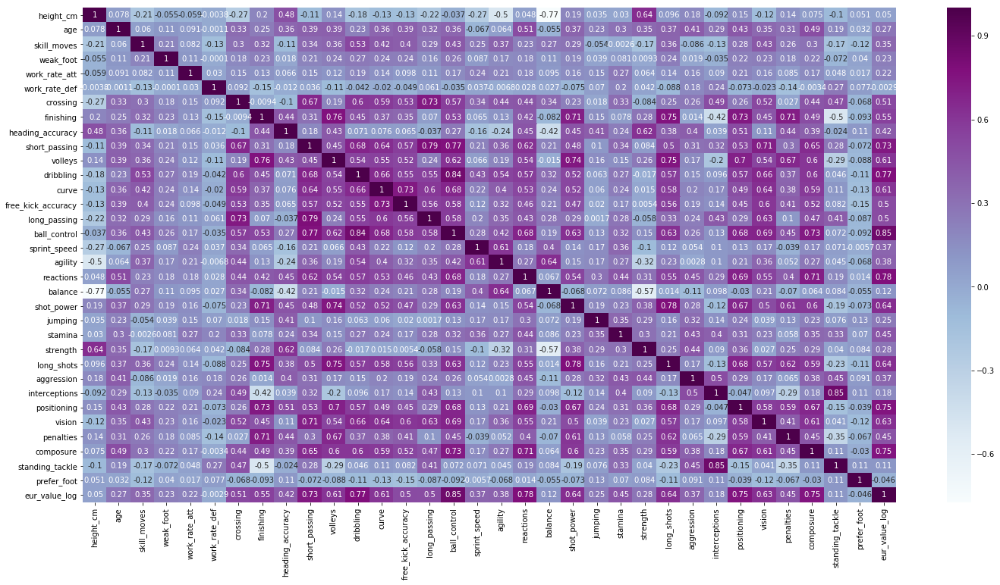

In [14]:
#Plot correlations again
df_fwd_heat = df_fwd1.corr()
plt.figure(figsize=(24, 12))
sns.heatmap(df_fwd_heat, annot=True, cmap = 'BuPu')

Correlations are now much cleaner. No perfect multicollinearity here.

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<Figure size 864x432 with 0 Axes>

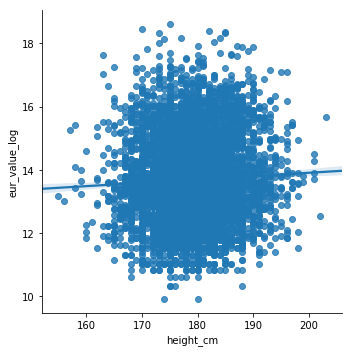

<Figure size 864x432 with 0 Axes>

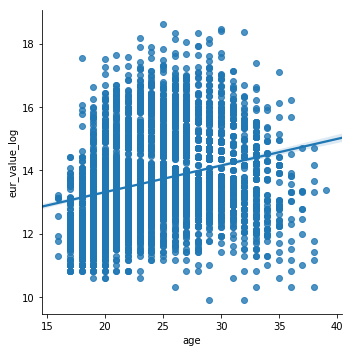

<Figure size 864x432 with 0 Axes>

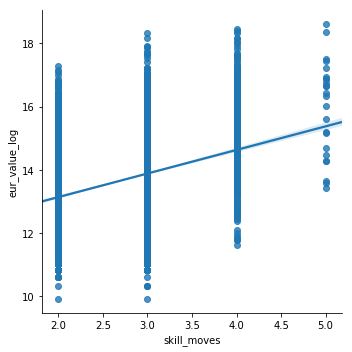

<Figure size 864x432 with 0 Axes>

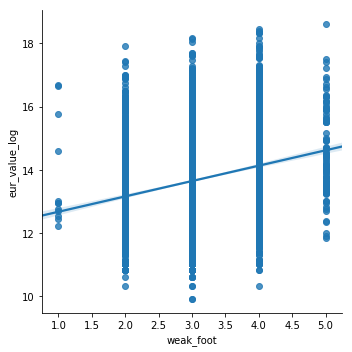

<Figure size 864x432 with 0 Axes>

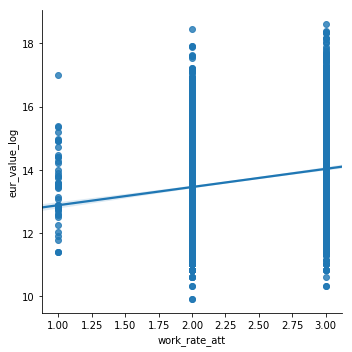

<Figure size 864x432 with 0 Axes>

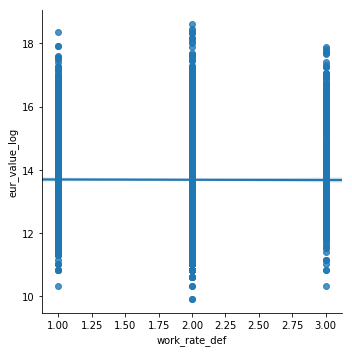

<Figure size 864x432 with 0 Axes>

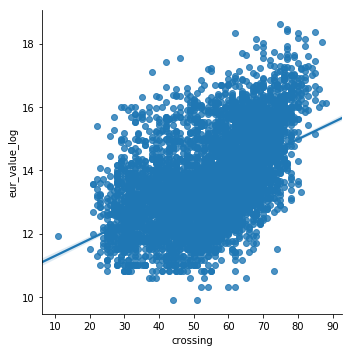

<Figure size 864x432 with 0 Axes>

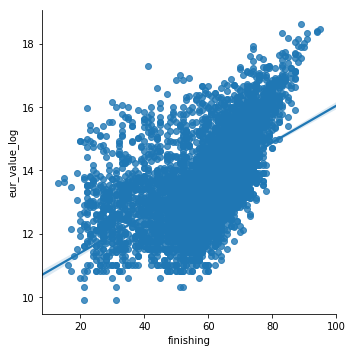

<Figure size 864x432 with 0 Axes>

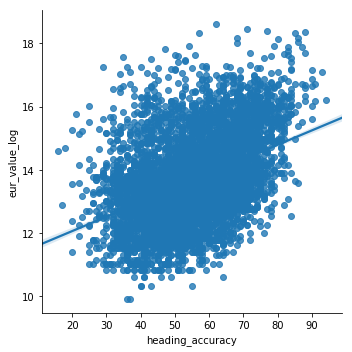

<Figure size 864x432 with 0 Axes>

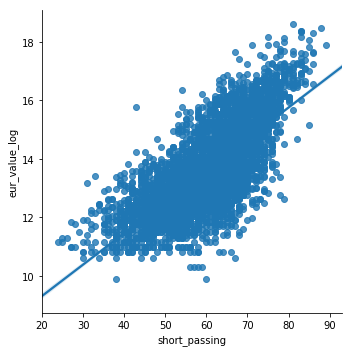

<Figure size 864x432 with 0 Axes>

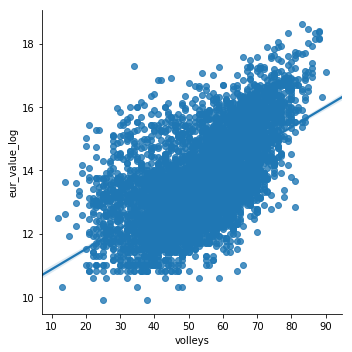

<Figure size 864x432 with 0 Axes>

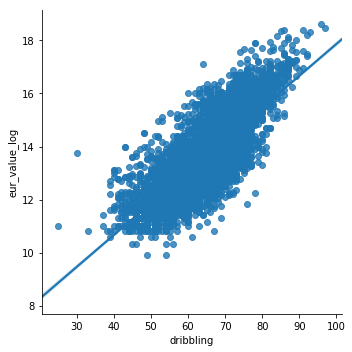

<Figure size 864x432 with 0 Axes>

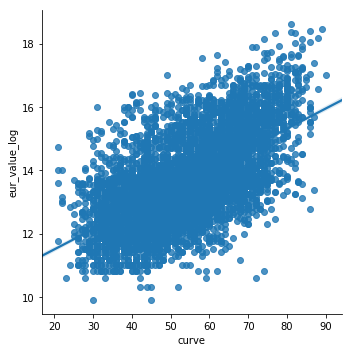

<Figure size 864x432 with 0 Axes>

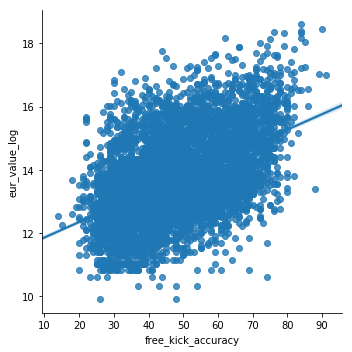

<Figure size 864x432 with 0 Axes>

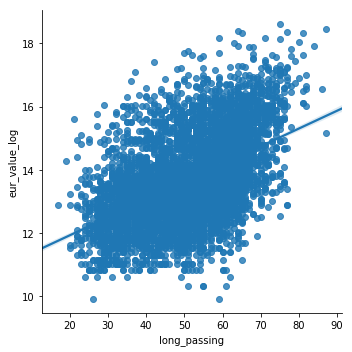

<Figure size 864x432 with 0 Axes>

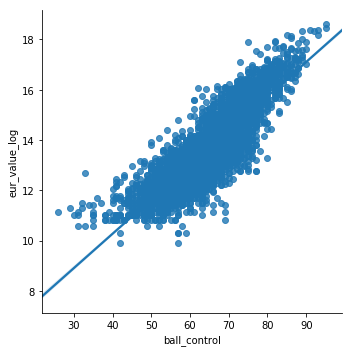

<Figure size 864x432 with 0 Axes>

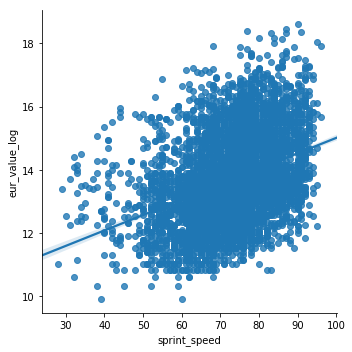

<Figure size 864x432 with 0 Axes>

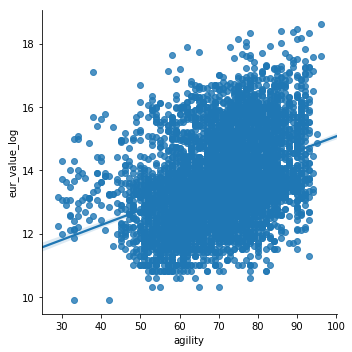

<Figure size 864x432 with 0 Axes>

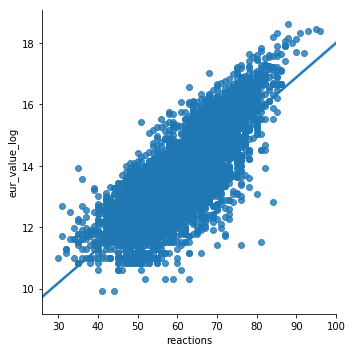

<Figure size 864x432 with 0 Axes>

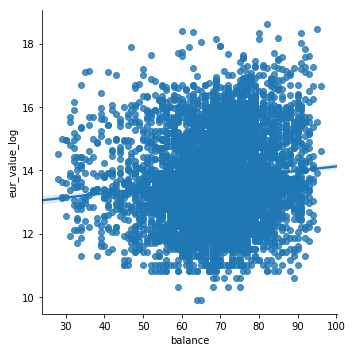

<Figure size 864x432 with 0 Axes>

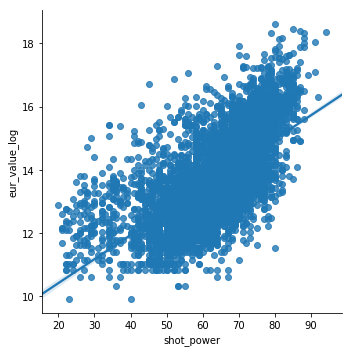

<Figure size 864x432 with 0 Axes>

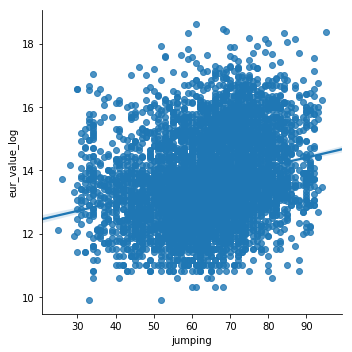

<Figure size 864x432 with 0 Axes>

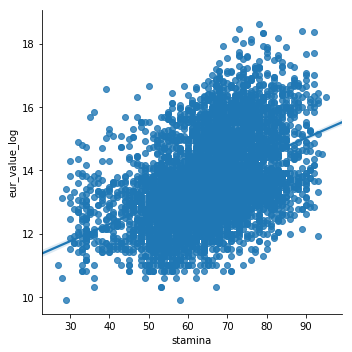

<Figure size 864x432 with 0 Axes>

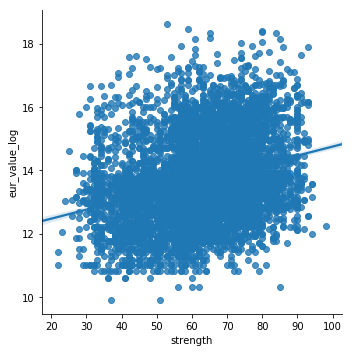

<Figure size 864x432 with 0 Axes>

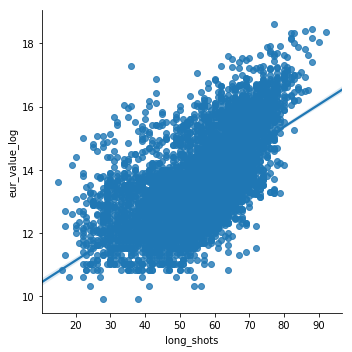

<Figure size 864x432 with 0 Axes>

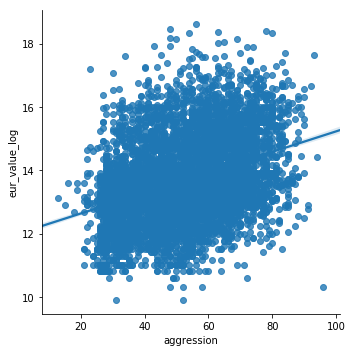

<Figure size 864x432 with 0 Axes>

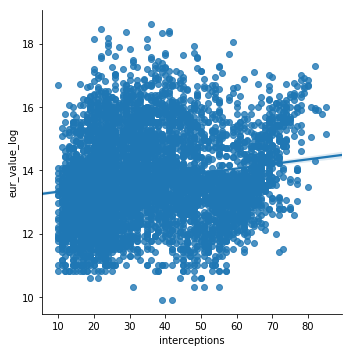

<Figure size 864x432 with 0 Axes>

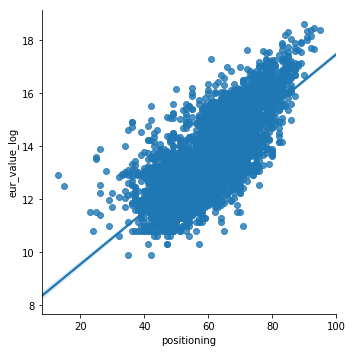

<Figure size 864x432 with 0 Axes>

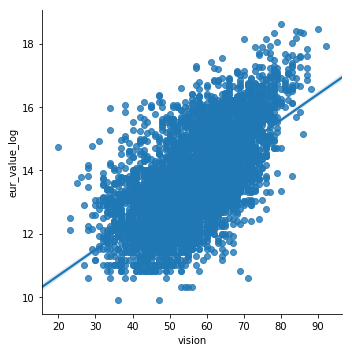

<Figure size 864x432 with 0 Axes>

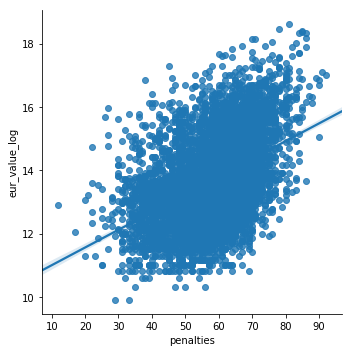

<Figure size 864x432 with 0 Axes>

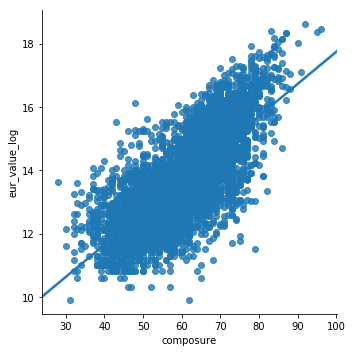

<Figure size 864x432 with 0 Axes>

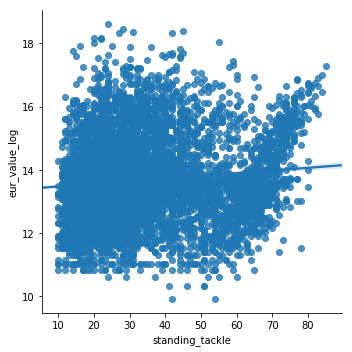

<Figure size 864x432 with 0 Axes>

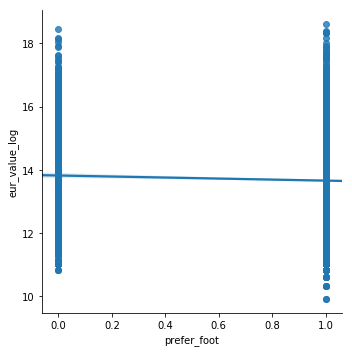

<Figure size 864x432 with 0 Axes>

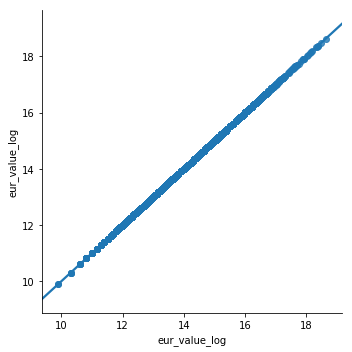

In [15]:
#Plot each variable against log of Eur value.
for col in df_fwd1:
    plt.figure(figsize=(12, 6))
    sns.lmplot(x = col, y='eur_value_log', data=df_fwd1)

Defensive stats (e.g. tackling) and height don't appear to have a strong linear relationship with log value for forwards at least. Interesting given higher emphasis on defensive work by forwards in the modern game.

Interestingly, many of the physical stats aren't that linearly related with value - convention would expect faster fowards to be more valuable, but this isn't obviously the case. Also, all the really valuable forwards appear to have good free kick statistics.

All in all, predictor variables look well suited for linear regression (seem linearly related with log of market value/eur_value_log).


## Model Fitting - Forwards

### Linear Regression

In [16]:
#import relevant packages (SKLearn)
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [17]:
#set up our variables
X = df_fwd[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'long_passing',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'interceptions', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_fwd['eur_value_log']

In [18]:
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [19]:
#create model
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [20]:
#See the Outputs
coefficients = pd.DataFrame(lm.coef_, X.columns, columns = ['Base OLS Coefficients'])
#insert intercept
coefficients.loc[len(coefficients)] = lm.intercept_
coefficients

,Base OLS Coefficients
height_cm,0.000494
age,-0.076506
skill_moves,-0.003028
weak_foot,-0.003984
work_rate_att,-0.025117
work_rate_def,-0.054162
crossing,0.006766
finishing,0.006767
heading_accuracy,0.012701
short_passing,0.021960


Text(0.5,1,'Actual v Predicted Value of Eur_Value_Log')

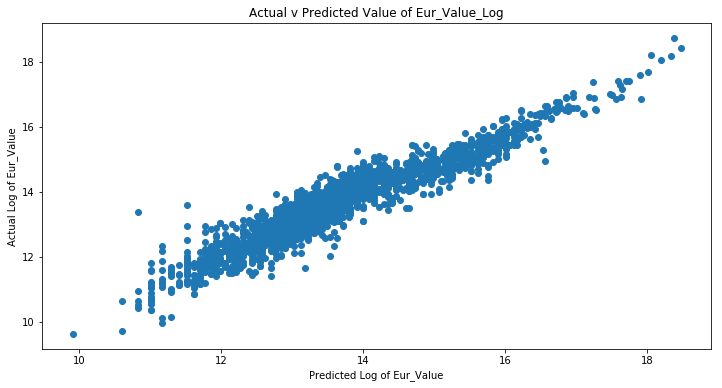

In [21]:
predictions = lm.predict(X_test)
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predictions)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('Actual v Predicted Value of Eur_Value_Log')

Linear model looks like a good fit for the data. Errors seem to be distributed randomly.

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


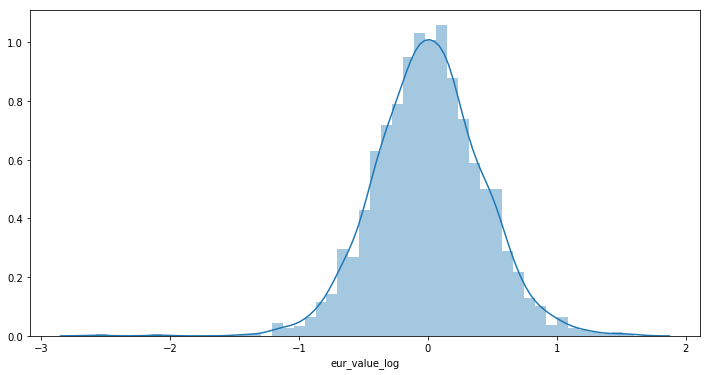

In [22]:
#Plot Errors
plt.figure(figsize=(12, 6))
sns.distplot(y_test-predictions)

Errors are largely normally distributed around zero.

In [23]:
#Evaluate error
mae = metrics.mean_absolute_error(y_test, predictions)
mse = metrics.mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))

MAE is: 0.3217270372171815
MSE is: 0.1721099493014179
RMSE is: 0.4148613615431279


We'll use K-Fold cross-validation to verify the MSE (i.e. results weren't a fluke).

In [24]:
#Import Packages
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

In [25]:
#Implement the KFold Validation
cv_list = []
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = LinearRegression(), X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')
cv_ols = {'OLS MSE' : results.mean()*-1}
cv_list.append(cv_ols)
print('Average OLS MSE after 10-Fold Cross-Validation is', results.mean()*-1)

Average OLS MSE after 10-Fold Cross-Validation is 0.16631819159758607


In [26]:
#What's our R2 value?
print ('R2 Score:', lm.score(X_test, y_test))

R2 Score: 0.9053119722007731


In [27]:
#Calculate an AIC value for comparison
predict_val = lm.predict(X_test)
residuals = (y_test-predict_val)
sse = sum(residuals**2)
k = 34
AIC_ols = (2*k) - (2*np.log(sse))
print('AIC value is: ', AIC_ols)

AIC value is:  56.4918250368628


The R2 score looks relatively high, suggesting the variables fed to the model explain 91% of the variance. But there's a lot of variables here, collinearity between variables and potential risk of overfitting. Ridge & Lasso Regression could be used here, both of which penalise an increase in features by reducing their impact on the end model.

### Ridge Regression

The hyperparameter, α controls how much the penalties on coefficients, with higher values of α creating simpler models (i.e. penalising models with lots of predictor variables). It effectively shrinks the coefficients if there is a high degree of multicollinearity?

In [28]:
#Import packages
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV
from sklearn.metrics import mean_squared_error

In [29]:
#set up an array with range of alphas to iterate through
alphas = 10**np.linspace(10,-2,100)*0.5

In [30]:
#set up all variables
X = df_fwd[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'long_passing',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'interceptions', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_fwd['eur_value_log']

In [31]:
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [32]:
#Use cross-validation to determine optimum level of alpha versus MSE. Normalise Data!
ridgecv = RidgeCV(alphas = alphas, scoring = 'neg_mean_squared_error', normalize = True)
ridgecv.fit(X_train, y_train)
alpha_opt = ridgecv.alpha_
print('Optimum Alpha to minimise MSE is: ', alpha_opt)

Optimum Alpha to minimise MSE is:  0.005


In [33]:
#Model Fit & Evaluation Using Optimum Alpha
ridge = Ridge(alpha = alpha_opt, normalize = True)
ridge.fit(X_train, y_train)
mse_opt = mean_squared_error(y_test, ridge.predict(X_test))
print('MSE at Alpha {} is {}'.format(alpha_opt, mse_opt))

MSE at Alpha 0.005 is 0.17597525457369353


In [34]:
#Run 10-Fold Cross-Validation
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = ridge, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')
#save errors to variables, append to list of CV MSE errors
cv_ridge = {'Ridge MSE': results.mean()*-1}
cv_list.append(cv_ridge)
print('Average Ridge Regression MSE after 10-Fold Cross-Validation is', results.mean()*-1)

Average Ridge Regression MSE after 10-Fold Cross-Validation is 0.1656414199362201


In [35]:
#Calculate an AIC value for comparison
predict_val = ridge.predict(X_test)
residuals = (y_test-predict_val)
sse = sum(residuals**2)
k = 34
AIC_ridge = (2*k) - (2*np.log(sse))
print('AIC value for Ridge Regression is: ', AIC_ridge)

AIC value for Ridge Regression is:  56.4474052900047


In [36]:
#let's compare shrinkage of coefficients with OLS
coefficients_ridge = pd.DataFrame(ridge.coef_, X.columns, columns = ['Ridge Coefficients'])
#insert intercept
coefficients_ridge.loc[len(coefficients_ridge)] = ridge.intercept_
coefficient_table = coefficients.join(coefficients_ridge)
coefficient_table

,Base OLS Coefficients,Ridge Coefficients
height_cm,0.000494,0.000110
age,-0.076506,-0.073107
skill_moves,-0.003028,-0.001621
weak_foot,-0.003984,-0.002862
work_rate_att,-0.025117,-0.028302
work_rate_def,-0.054162,-0.045880
crossing,0.006766,0.006741
finishing,0.006767,0.006567
heading_accuracy,0.012701,0.012524
short_passing,0.021960,0.021369


In [37]:
#show the difference in MSE between OLS and Ridge
cv_list

[{'OLS MSE': 0.16631819159758607}, {'Ridge MSE': 0.1656414199362201}]

For Forwards, Ridge Regression provided no meaningful improvement in the 10-Fold Cross-Validated MSE compared with the base 10-Fold Cross-Validated OLS regression.

### Lasso Regression

In [38]:
#set up the lasso cross validation process
lasso = Lasso(max_iter = 10000, normalize = True)
lassocv = LassoCV(alphas = None, cv = 10, max_iter = 100000, normalize = True)
lassocv.fit(X_train, y_train)
alpha_opt = lassocv.alpha_
print('Optimum Alpha to minimise Lasso MSE is: ', alpha_opt)

Optimum Alpha to minimise Lasso MSE is:  2.9061331779887982e-05


In [39]:
#Model Fit & Evaluation
lasso.set_params(alpha=lassocv.alpha_)
lasso.fit(X_train, y_train)
mean_squared_error(y_test, lasso.predict(X_test))
mse_opt = mean_squared_error(y_test, lasso.predict(X_test))
print('MSE at Alpha {} is {}'.format(alpha_opt, mse_opt))

MSE at Alpha 2.9061331779887982e-05 is 0.17599143003167625


In [40]:
#Run 10-Fold Cross-Validation
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = lasso, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

#save errors to variables, append to list of CV MSE errors
cv_lasso = {'Lasso MSE': results.mean()*-1}
cv_list.append(cv_lasso)
print('Average Lasso MSE after 10-Fold Cross-Validation is', results.mean()*-1)

Average Lasso MSE after 10-Fold Cross-Validation is 0.16539637001139468


<b> AIC: </b> Can AIC for Lasso be calculated given reduction of coefficients to zero? Literature is unclear.

In [41]:
#let's compare oefficients with other models
coefficients_lasso = pd.DataFrame(lasso.coef_, X.columns, columns = ['Lasso Coefficients'])
#insert intercept
coefficients_lasso.loc[len(coefficients_lasso)] = lasso.intercept_
coefficient_table.join(coefficients_lasso)

,Base OLS Coefficients,Ridge Coefficients,Lasso Coefficients
height_cm,0.000494,0.000110,0.000000
age,-0.076506,-0.073107,-0.072590
skill_moves,-0.003028,-0.001621,-0.000000
weak_foot,-0.003984,-0.002862,-0.000000
work_rate_att,-0.025117,-0.028302,-0.023140
work_rate_def,-0.054162,-0.045880,-0.039834
crossing,0.006766,0.006741,0.006355
finishing,0.006767,0.006567,0.006213
heading_accuracy,0.012701,0.012524,0.012792
short_passing,0.021960,0.021369,0.020625


In [42]:
#show the difference in MSE between OLS and Ridge
cv_list

[{'OLS MSE': 0.16631819159758607},
 {'Ridge MSE': 0.1656414199362201},
 {'Lasso MSE': 0.16539637001139468}]

Lasso Regression performed similarly on 10-Fold Cross Validated MSE when compared with Ridge Regression. Several coefficients were reduced to zero (i.e. 3 predictor variables were removed from the model).

Of the variables removed:
1. Height - Reasonable omission. Effective modern forwards can be fast or rely on better positioning instead of being tall.
2. Skill Moves - This feature is probably already encapsulated by ball_control.
3. Weak Foot - A strange feature to exclude. Perhaps the vast majority of players have poor weak foot ratings?
4. Free Kick Accuracy - Unusual - perhaps most forwards don't take free kicks (leaving it to midfielders).

Ridge and Lasso Regressions performed only slightly better than the basic Linear Regression Model on a 10-Fold Cross-Validation MSE.

### Recursive Feature Elimination (RFE)

As an alternative, RFE and Cross-Validation can be used as an automated way to to cut down features.

In [43]:
#Import Models
from sklearn.feature_selection import RFECV

In [44]:
#set up our variables
X = df_fwd1[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'long_passing',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'interceptions', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_fwd1['eur_value_log']

RFE CV can suggest which variables are most important using cross-validation processes.

In [45]:
#Set Up Dataframe of All Features
df_new = pd.DataFrame(data = df_fwd1.columns, columns = ['attributes'])

#define model to use
linreg = LinearRegression()

#Set UP RFECV, using MSE as primary measurement metric and 5 folds
rfecv = RFECV(estimator=linreg, step=1, cv=KFold(5), scoring='neg_mean_squared_error')

#Fit RFECV to Model
rfecv.fit(X, y)

RFECV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
   estimator=LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False),
   n_jobs=1, scoring='neg_mean_squared_error', step=1, verbose=0)

In [46]:
#Where MSE is minimised, how many features are in the model?
rfecv.n_features_

22

In [47]:
#Create df of RFE Booleans
support = pd.DataFrame(data = rfecv.support_, columns = ['importance_flg'])

#Concat the columngs together
classifier = pd.concat([support, df_new], axis=1)

#Drop the last row, as this is our target variable
a = classifier.drop(len(classifier)-1)
b = a.loc[a['importance_flg'] == True]

#Convert to list, show us which attributes are important
c = list(b['attributes'])
c

['age',
 'skill_moves',
 'weak_foot',
 'work_rate_att',
 'work_rate_def',
 'crossing',
 'finishing',
 'heading_accuracy',
 'short_passing',
 'dribbling',
 'long_passing',
 'ball_control',
 'sprint_speed',
 'reactions',
 'stamina',
 'strength',
 'long_shots',
 'aggression',
 'positioning',
 'composure',
 'standing_tackle',
 'prefer_foot']

According to RFECV, the above variables minimise MSE when predicting (log of) market value of forwards when providing their player ratings. None of these are a particular surprise, and would intuitively be desirable traits in a forward. Also note that height and free kick accuracy have been removed, consistent with the Lasso, though skill moves and weak foot remain.

In [48]:
#Set Up model to read target and predictor variables
X = df_fwd1[c]
y = df_fwd1['eur_value_log']

#Train Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#Set Up & Fit Model
lm = LinearRegression()
lm.fit(X_train, y_train)

#pull predictions
predictions = lm.predict(X_test)


#Run 10-Fold Cross-Validation
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = LinearRegression(), X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

#save errors to variables, append to list of CV MSE errors
cv_rfe= {'RFE OLS MSE': results.mean()*-1}
cv_list.append(cv_rfe)

In [49]:
cv_list

[{'OLS MSE': 0.16631819159758607},
 {'Ridge MSE': 0.1656414199362201},
 {'Lasso MSE': 0.16539637001139468},
 {'RFE OLS MSE': 0.1690573790019597}]

In [50]:
#What's our R2 value?
print ('R2 Score:', lm.score(X_test, y_test))

R2 Score: 0.9110734587855882


In [51]:
#Calculate an AIC value for comparison
predict_val = lm.predict(X_test)
residuals = (y_test-predict_val)
sse = sum(residuals**2)
k = 22
AIC = (2*k) - (2*np.log(sse))
print('AIC value is: ', AIC)

AIC value is:  32.54213363220507


Using RFE CV, there is a very minimal increase in 10-Fold CV MSE when compared with the base OLS. Note that the AIC value is less than the base OLS models due to reduction of features.

Given that the MSE is almost the same as the base OLS with almost a third fewer features, it appears this model strikes a good balance between bias and variance when compared with the un-filtered Linear Regression model as well as the Ridge and Lasso Regressions (which both have more features incorporated).

### Random Forest Regression

While normally used as a tool for classification problems, we can also use Random Forests for Regression.

In [52]:
#RFR Packages
from sklearn.ensemble import RandomForestRegressor

In [53]:
#Set up Training & Test Data
X = df_fwd1[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'long_passing',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'interceptions', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_fwd1['eur_value_log']

In [54]:
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [55]:
#Set up Model & Fit model to test data
RGR = RandomForestRegressor(n_jobs=-1)
RGR.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

Text(0.5,1,'Actual v Predicted Value of Eur_Value_Log')

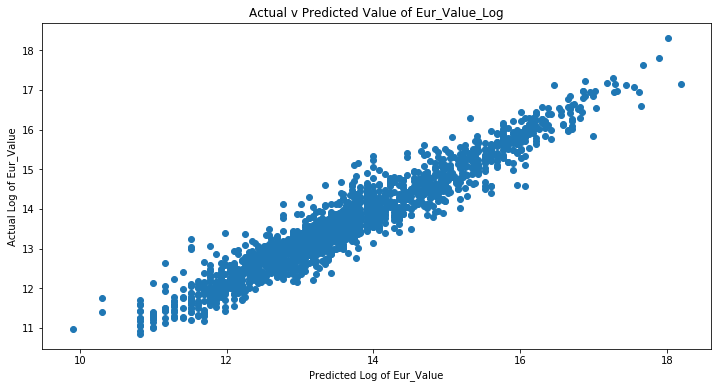

In [56]:
#plot graph
predictions = RGR.predict(X_test)
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predictions)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('Actual v Predicted Value of Eur_Value_Log')

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


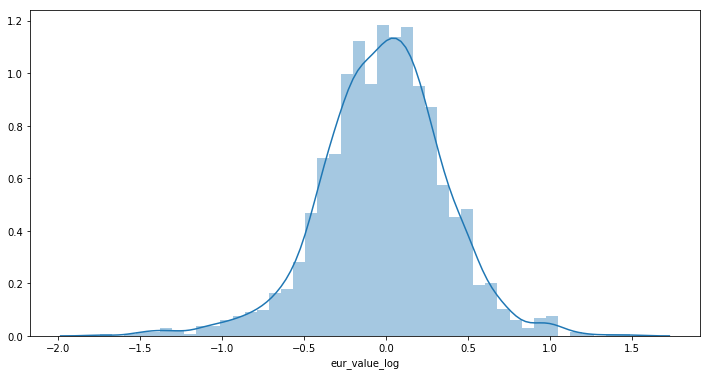

In [57]:
#Plot Errors
plt.figure(figsize=(12, 6))
sns.distplot(y_test-predictions)

In [58]:
#Run 10-Fold Cross-Validation on New Model - Evaluate Error
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = RGR, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predictions)
mse = metrics.mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('R2 Score is: ' + str(RGR.score(X_test, y_test)))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.28821197329739595
MSE is: 0.14317754288702264
RMSE is: 0.37838808502253696
R2 Score is: 0.9187342781174005
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.15048476379566686


In respect of MSE, the Random Forest Regression model appears to have provided an improvement on the RFE OLS Linear Regression models. It is still possible we could improve the MSE via optimising some of the hyperparameters. We can do so via brute force (i.e. GridSearchCV).

### Random Forest Regression Optimisation

The key parameters we can optimise are:
1. n_estimators - the number of trees in the forest. This will generally be more accurate the higher you go.
2. max_features - The number of features to consider when looking for the best split. Documentation indicates that the default value is the total number of features in the data. This seems too high. <i> The Elements of Statistical Learning: 2nd Edition </i> (Hastie et. al. 2009, p. 592) indicates that it should be around <b>n/3</b> features, where n is the total number of features in the data. 
3. min_samples_leaf - The minimum number of samples required to be at a leaf node (default = 1)

In [59]:
#Import GridSearch
from sklearn.grid_search import GridSearchCV

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/sklearn/grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


In [60]:
#Set up Parameters
#Execute Grid Search - Warning - will take approx. 9 mins. 
param_grid = {'n_estimators': np.arange(7,21), 'max_features': np.arange(7,16),'min_samples_leaf':[1,2,3,4]}
Grid = GridSearchCV(RGR, param_grid, verbose = 2)
Grid.fit(X_train, y_train)

Fitting 3 folds for each of 504 candidates, totalling 1512 fits
[CV] max_features=7, min_samples_leaf=1, n_estimators=7 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=7 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=7 ..............


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=7 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=7 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=7 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=8 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=8 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=8 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=8 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=8 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=8 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=9 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=9 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=9 ..............
[CV] .

[CV] .... max_features=7, min_samples_leaf=2, n_estimators=12 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=13 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=13 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=13 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=13 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=13 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=13 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=14 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=14 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=14 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=15 .............
[CV] .

[CV] .... max_features=7, min_samples_leaf=3, n_estimators=18 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=18 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=18 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=18 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=18 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=19 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=19 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=19 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=19 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=19 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=19 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=20 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=20 .............
[CV] .

[CV] ..... max_features=8, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=9 ..............
[CV] ..... max_features=8, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=10 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=10 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=10 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=10 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=10 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=10 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=11 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=11 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=11 .............
[CV] .

[CV] .... max_features=8, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=15 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=15 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=15 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=15 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=15 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=15 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=16 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=16 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=16 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=17 .............
[CV] .

[CV] .... max_features=8, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=8, min_samples_leaf=3, n_estimators=20 .............
[CV] .... max_features=8, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=8, min_samples_leaf=3, n_estimators=20 .............
[CV] .... max_features=8, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=7 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=7 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=7 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=7 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=7 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=7 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=8 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=8 ..............
[CV] .

[CV] .... max_features=9, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=11 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=12 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=12 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=12 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=12 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=12 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=12 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=13 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=13 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=13 .............
[CV] .

[CV] .... max_features=9, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=17 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=17 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=17 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=17 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=17 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=17 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=18 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=18 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=18 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=19 .............
[CV] .

[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=8 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=8 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=9 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=9 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=9 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=9 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=9 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=9 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=10 .............
[CV] .... max_features=9, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=10 .............
[CV] .

[CV] ... max_features=10, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=13 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=14 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=14 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=14 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=14 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=14 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=14 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=15 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=15 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=15 ............
[CV] .

[CV] ... max_features=10, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=19 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=19 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=19 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=19 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=19 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=19 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=20 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=20 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=20 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=10, min_samples_leaf=3, n_estimators=7 .............
[CV] .

[CV] ... max_features=10, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=10 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=10 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=11 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=11 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=11 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=11 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=11 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=11 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=12 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=12 ............
[CV] .

[CV] ... max_features=11, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=15 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=16 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=16 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=16 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=16 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=16 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=16 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=17 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=17 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=17 ............
[CV] .

[CV] ... max_features=11, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=7 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=7 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=7 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=7 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=7 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=7 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=8 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=8 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=8 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=9 .............
[CV] .

[CV] ... max_features=11, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=12 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=12 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=13 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=13 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=13 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=13 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=13 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=13 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=14 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=14 ............
[CV] .

[CV] ... max_features=12, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=17 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=18 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=18 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=18 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=18 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=18 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=18 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=19 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=19 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=19 ............
[CV] .

[CV] .... max_features=12, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=9 .............
[CV] .... max_features=12, min_samples_leaf=3, n_estimators=9 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=9 .............
[CV] .... max_features=12, min_samples_leaf=3, n_estimators=9 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=9 .............
[CV] .... max_features=12, min_samples_leaf=3, n_estimators=9 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=10 ............
[CV] ... max_features=12, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=10 ............
[CV] ... max_features=12, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=10 ............
[CV] ... max_features=12, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=11 ............
[CV] .

[CV] ... max_features=12, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=14 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=14 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=15 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=15 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=15 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=15 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=15 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=15 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=16 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=16 ............
[CV] .

[CV] ... max_features=13, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=19 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=20 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=20 -   0.3s
[CV] max_features=13, min_samples_leaf=1, n_estimators=20 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=20 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=20 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=20 -   0.2s
[CV] max_features=13, min_samples_leaf=2, n_estimators=7 .............
[CV] .... max_features=13, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=13, min_samples_leaf=2, n_estimators=7 .............
[CV] .... max_features=13, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=13, min_samples_leaf=2, n_estimators=7 .............
[CV] .

[CV] ... max_features=13, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=11 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=11 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=11 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=11 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=11 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=11 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=12 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=12 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=12 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=13 ............
[CV] .

[CV] ... max_features=13, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=16 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=16 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=17 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=17 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=17 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=17 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=17 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=17 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=18 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=18 ............
[CV] .

[CV] .... max_features=14, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=7 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=8 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=8 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=8 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=8 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=8 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=8 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=9 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=9 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=9 .............
[CV] .

[CV] ... max_features=14, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=13 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=13 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=13 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=13 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=13 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=13 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=14 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=14 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=14 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=15 ............
[CV] .

[CV] ... max_features=14, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=18 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=18 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=19 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=19 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=19 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=19 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=19 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=19 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=20 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=20 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=20 ............
[CV] .

[CV] .... max_features=15, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=9 .............
[CV] .... max_features=15, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=10 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=10 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=10 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=10 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=10 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=10 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=11 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=11 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=11 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=11 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=11 ............
[CV] .

[CV] ... max_features=15, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=15 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=15 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=15 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=15 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=15 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=15 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=16 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=16 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=16 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=16 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=16 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=16 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=17 ............
[CV] .

[CV] ... max_features=15, min_samples_leaf=4, n_estimators=20 -   0.2s
[CV] max_features=15, min_samples_leaf=4, n_estimators=20 ............
[CV] ... max_features=15, min_samples_leaf=4, n_estimators=20 -   0.2s
[CV] max_features=15, min_samples_leaf=4, n_estimators=20 ............
[CV] ... max_features=15, min_samples_leaf=4, n_estimators=20 -   0.2s


[Parallel(n_jobs=1)]: Done 1512 out of 1512 | elapsed:  5.6min finished


GridSearchCV(cv=None, error_score='raise',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'n_estimators': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]), 'max_features': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15]), 'min_samples_leaf': [1, 2, 3, 4]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=2)

In [61]:
#Pull out optimum parameters
Grid.best_params_

{'max_features': 15, 'min_samples_leaf': 1, 'n_estimators': 18}

The Grid Search has identified the above values to be the optimum values. These values will be used in a new Random Forest Regression to see the impact on MSE. 

In [62]:
#Rebuild Model using Optimum Parameters
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#Fit Model
RGR_new = RandomForestRegressor(n_estimators = 18, max_features = 15, min_samples_leaf = 1)
RGR_new.fit(X_train, y_train)
prediction = RGR_new.predict(X_test)

In [63]:
#Run 10-Fold Cross-Validation on New Model
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = RGR_new, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, prediction)
mse = metrics.mean_squared_error(y_test, prediction)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('R2 Score is: ' + str(RGR_new.score(X_test, y_test)))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.2709954416117015
MSE is: 0.13032604567857062
RMSE is: 0.3610069884068321
R2 Score is: 0.9284187695924198
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.1348298547395345


The tuning of hyperparameters did appear to reduce MSE compared to the unoptimised Random Forest Regression model.

In [64]:
#Key Features
importances = RGR_new.feature_importances_
indices = np.argsort(importances)
features = X.columns

Text(0.5,0,'Relative Importance')

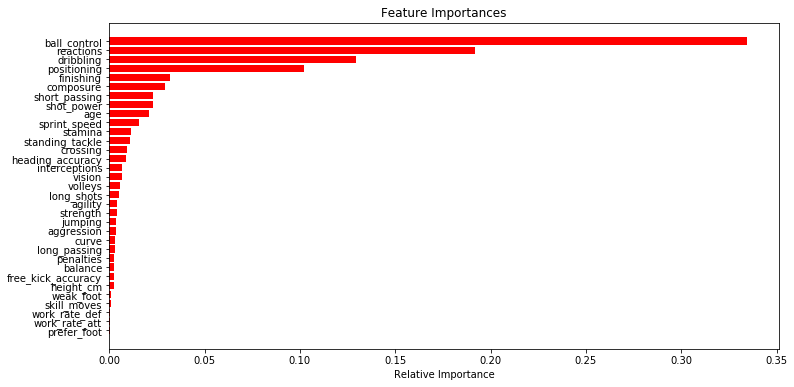

In [65]:
plt.figure(figsize = (12,6))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='r', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')

The top 7 features are all consistent with the RFE selected predictor variables in the OLS Linear Regression model, but also consistent with the most important features in the Ridge and Lasso Regression models. 

### Support Vector Regression

Another predictive technique that could be used is support vector regression. This another regression technique that can pull the data into higher dimensions to create a closer line of fit, at the cost of explanation (i.e. I would not be able to explain exactly what 'features' the model is using).

In [66]:
#import packages
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler

In [67]:
#Set up Data
X = df_fwd1[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'long_passing',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'interceptions', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_fwd1['eur_value_log']

In [68]:
#Requires Scaling of Data
scalar = StandardScaler()
scalar.fit(X)
scaled_features = scalar.transform(X)
df_scaled = pd.DataFrame(data = scaled_features, columns = X.columns)

In [69]:
#Set up Scaled Data
X = df_scaled
y = df_fwd1['eur_value_log']

#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [70]:
#Instantiate a few models, evaluate best fit - start with the radial basis function
svr_rbf = SVR(kernel = 'rbf')
svr_rbf.fit(X_train, y_train)
predict_val_rbf = svr_rbf.predict(X_test)

#Try the linear model
svr_lin = SVR(kernel = 'linear')
svr_lin.fit(X_train, y_train)
predict_val_lin = svr_lin.predict(X_test)

#Try the polynomial model
svr_poly = SVR(kernel = 'poly')
svr_poly.fit(X_train, y_train)
predict_val_poly = svr_poly.predict(X_test)

In [71]:
#Run 10-Fold Cross-Validation on RBF
svr_list = []
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_rbf, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_rbf)
mse = metrics.mean_squared_error(y_test, predict_val_rbf)
rmse = np.sqrt(mse)

rbf = {'RBF SVR MSE' : results.mean()*-1}
svr_list.append(rbf)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.19292683522995882
MSE is: 0.06771918174358998
RMSE is: 0.26022909472922123
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.07772548445978597


Text(0.5,1,'SVR RBF Function - Actual v Predicted Value of Eur_Value_Log')

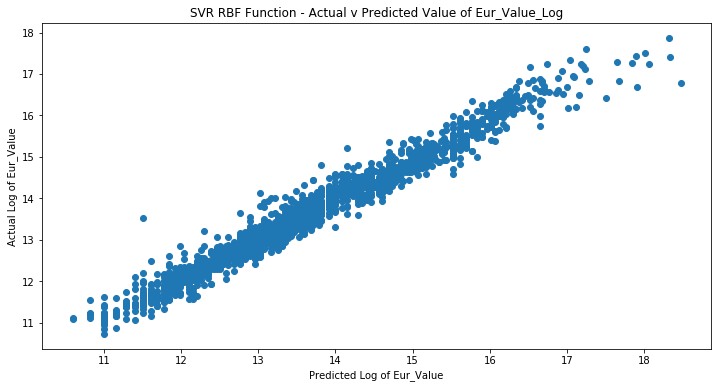

In [72]:
#Plot the functions as a comparison
#Plot the RBF function
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predict_val_rbf)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('SVR RBF Function - Actual v Predicted Value of Eur_Value_Log')

In [73]:
#linear SVR
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_lin, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_lin)
mse = metrics.mean_squared_error(y_test, predict_val_lin)
rmse = np.sqrt(mse)

lin = {'Linear SVR MSE' : results.mean()*-1}
svr_list.append(lin)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('Average MSE for Linear SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.31324477092503755
MSE is: 0.16392136249079164
RMSE is: 0.4048720322407954
Average MSE for Linear SVR after 10-Fold Cross-Validation is 0.1726258197341694


Text(0.5,1,'SVR Linear Function - Actual v Predicted Value of Eur_Value_Log')

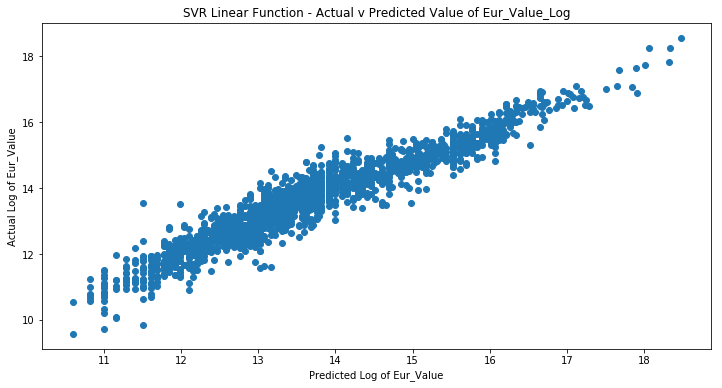

In [74]:
#linear
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predict_val_lin)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('SVR Linear Function - Actual v Predicted Value of Eur_Value_Log')

In [75]:
#Poly SVR
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_poly, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_poly)
mse = metrics.mean_squared_error(y_test, predict_val_poly)
rmse = np.sqrt(mse)

poly = {'Poly SVR MSE' : results.mean()*-1}
svr_list.append(poly)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('Average MSE for Poly SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.36070642458162594
MSE is: 0.25014161568469734
RMSE is: 0.5001415956353734
Average MSE for Poly SVR after 10-Fold Cross-Validation is 0.2884147091937491


Text(0.5,1,'SVR Polynomial Function - Actual v Predicted Value of Eur_Value_Log')

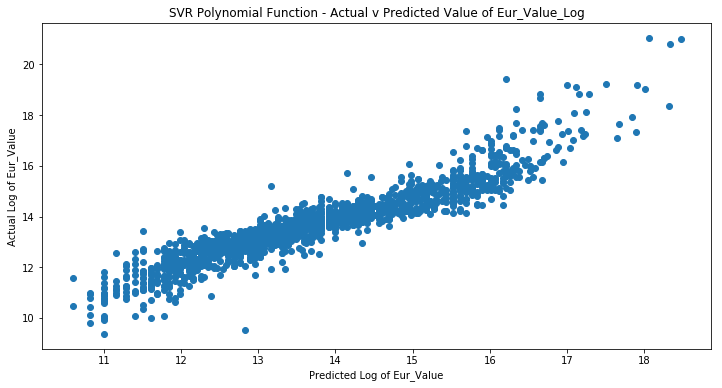

In [76]:
#Plot the Poly function
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predict_val_poly)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('SVR Polynomial Function - Actual v Predicted Value of Eur_Value_Log')

In [77]:
#Output list of MSE values
svr_list

[{'RBF SVR MSE': 0.07772548445978597},
 {'Linear SVR MSE': 0.1726258197341694},
 {'Poly SVR MSE': 0.2884147091937491}]

### SVR Optimisation

It appears the RBF function appears to have the closest set of predictions to actual target variables based on MSE. This kernel will be used going forward for optimisation. 

The parameters to be optimised are:
1. C (the error term) - Cost of misclassification on the training data. A higher C gives us lower bias(higher variance).  
2. γ (Kernel coefficient) - A lower Gamma means a Gaussian with a higher variance (lower bias). 
3. ϵ (epsilon) - how lenient the model is in classifying an error. 

We will do this via brute force optimisation (Grid Search CV).

In [78]:
#Set up Parameters

#Built in range doesn't support floats for epsilon values, set up custom function
def frange(start, stop, step):
    i = start
    while i < stop:
        yield i
        i += step

#generate lists
epsilon_params = []
c_params = []

for i in frange(0.0, 1.0, 0.1):
    epsilon_params.append(i)

for i in frange(0.1, 2.0, 0.2):
    c_params.append(i)

In [79]:
#Execute Grid Search - Warning - will take approx. 7 mins. 
param_grid = {'C': c_params, 'epsilon': epsilon_params,'gamma':[1,0.1,0.01,0.001]}
Grid = GridSearchCV(svr_rbf, param_grid, verbose = 2)
Grid.fit(X_train, y_train)

Fitting 3 folds for each of 440 candidates, totalling 1320 fits
[CV] C=0.1, epsilon=0.0, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.0, gamma=1 -   0.7s
[CV] C=0.1, epsilon=0.0, gamma=1 .....................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s


[CV] ............................ C=0.1, epsilon=0.0, gamma=1 -   0.7s
[CV] C=0.1, epsilon=0.0, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.0, gamma=1 -   0.7s
[CV] C=0.1, epsilon=0.0, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.0, gamma=0.1 -   0.6s
[CV] C=0.1, epsilon=0.0, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.0, gamma=0.1 -   0.6s
[CV] C=0.1, epsilon=0.0, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.0, gamma=0.1 -   0.6s
[CV] C=0.1, epsilon=0.0, gamma=0.01 ..................................
[CV] ......................... C=0.1, epsilon=0.0, gamma=0.01 -   0.6s
[CV] C=0.1, epsilon=0.0, gamma=0.01 ..................................
[CV] ......................... C=0.1, epsilon=0.0, gamma=0.01 -   0.6s
[CV] C=0.1, epsilon=0.0, gamma=0.01 ..................................
[CV] .

[CV] ........................ C=0.1, epsilon=0.4, gamma=0.001 -   0.3s
[CV] C=0.1, epsilon=0.5, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.5, gamma=1 -   0.5s
[CV] C=0.1, epsilon=0.5, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.5, gamma=1 -   0.6s
[CV] C=0.1, epsilon=0.5, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.5, gamma=1 -   0.5s
[CV] C=0.1, epsilon=0.5, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.5, gamma=0.1 -   0.3s
[CV] C=0.1, epsilon=0.5, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.5, gamma=0.1 -   0.3s
[CV] C=0.1, epsilon=0.5, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.5, gamma=0.1 -   0.3s
[CV] C=0.1, epsilon=0.5, gamma=0.01 ..................................
[CV] .

[CV] ......... C=0.1, epsilon=0.8999999999999999, gamma=0.001 -   0.1s
[CV] C=0.1, epsilon=0.8999999999999999, gamma=0.001 ..................
[CV] ......... C=0.1, epsilon=0.8999999999999999, gamma=0.001 -   0.1s
[CV] C=0.1, epsilon=0.8999999999999999, gamma=0.001 ..................
[CV] ......... C=0.1, epsilon=0.8999999999999999, gamma=0.001 -   0.1s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=1 ......................
[CV] ............. C=0.1, epsilon=0.9999999999999999, gamma=1 -   0.4s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=1 ......................
[CV] ............. C=0.1, epsilon=0.9999999999999999, gamma=1 -   0.4s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=1 ......................
[CV] ............. C=0.1, epsilon=0.9999999999999999, gamma=1 -   0.4s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=0.1 ....................
[CV] ........... C=0.1, epsilon=0.9999999999999999, gamma=0.1 -   0.2s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=0.1 ....................
[CV] .

[CV]  C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.01 -   0.2s
[CV] C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.01 ..
[CV]  C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.01 -   0.2s
[CV] C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 .
[CV]  C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 -   0.3s
[CV] C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 .
[CV]  C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 -   0.3s
[CV] C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 .
[CV]  C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 -   0.3s
[CV] C=0.30000000000000004, epsilon=0.4, gamma=1 .....................
[CV] ............ C=0.30000000000000004, epsilon=0.4, gamma=1 -   0.6s
[CV] C=0.30000000000000004, epsilon=0.4, gamma=1 .....................
[CV] ............ C=0.30000000000000004, epsilon=0.4, gamma=1 -   0.6s
[CV] C=0.30000000000000004, epsilon=0.4

[CV]  C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.01 -   0.0s
[CV] C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.01 ...
[CV]  C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.01 -   0.0s
[CV] C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 ..
[CV]  C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 -   0.1s
[CV] C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 ..
[CV]  C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 -   0.1s
[CV] C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 ..
[CV]  C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 -   0.1s
[CV] C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 ......
[CV]  C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 -   0.4s
[CV] C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 ......
[CV]  C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 -   0.4s
[CV] C=0.30000000000000004, epsilon=0.

[CV] .......................... C=0.5, epsilon=0.2, gamma=0.1 -   0.4s
[CV] C=0.5, epsilon=0.2, gamma=0.1 ...................................
[CV] .......................... C=0.5, epsilon=0.2, gamma=0.1 -   0.4s
[CV] C=0.5, epsilon=0.2, gamma=0.01 ..................................
[CV] ......................... C=0.5, epsilon=0.2, gamma=0.01 -   0.3s
[CV] C=0.5, epsilon=0.2, gamma=0.01 ..................................
[CV] ......................... C=0.5, epsilon=0.2, gamma=0.01 -   0.3s
[CV] C=0.5, epsilon=0.2, gamma=0.01 ..................................
[CV] ......................... C=0.5, epsilon=0.2, gamma=0.01 -   0.3s
[CV] C=0.5, epsilon=0.2, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.2, gamma=0.001 -   0.4s
[CV] C=0.5, epsilon=0.2, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.2, gamma=0.001 -   0.4s
[CV] C=0.5, epsilon=0.2, gamma=0.001 .................................
[CV] .

[CV] ............................ C=0.5, epsilon=0.7, gamma=1 -   0.5s
[CV] C=0.5, epsilon=0.7, gamma=0.1 ...................................
[CV] .......................... C=0.5, epsilon=0.7, gamma=0.1 -   0.1s
[CV] C=0.5, epsilon=0.7, gamma=0.1 ...................................
[CV] .......................... C=0.5, epsilon=0.7, gamma=0.1 -   0.2s
[CV] C=0.5, epsilon=0.7, gamma=0.1 ...................................
[CV] .......................... C=0.5, epsilon=0.7, gamma=0.1 -   0.1s
[CV] C=0.5, epsilon=0.7, gamma=0.01 ..................................
[CV] ......................... C=0.5, epsilon=0.7, gamma=0.01 -   0.0s
[CV] C=0.5, epsilon=0.7, gamma=0.01 ..................................
[CV] ......................... C=0.5, epsilon=0.7, gamma=0.01 -   0.0s
[CV] C=0.5, epsilon=0.7, gamma=0.01 ..................................
[CV] ......................... C=0.5, epsilon=0.7, gamma=0.01 -   0.0s
[CV] C=0.5, epsilon=0.7, gamma=0.001 .................................
[CV] .

[CV] ............................ C=0.7, epsilon=0.1, gamma=1 -   0.7s
[CV] C=0.7, epsilon=0.1, gamma=1 .....................................
[CV] ............................ C=0.7, epsilon=0.1, gamma=1 -   0.7s
[CV] C=0.7, epsilon=0.1, gamma=1 .....................................
[CV] ............................ C=0.7, epsilon=0.1, gamma=1 -   0.7s
[CV] C=0.7, epsilon=0.1, gamma=0.1 ...................................
[CV] .......................... C=0.7, epsilon=0.1, gamma=0.1 -   0.5s
[CV] C=0.7, epsilon=0.1, gamma=0.1 ...................................
[CV] .......................... C=0.7, epsilon=0.1, gamma=0.1 -   0.5s
[CV] C=0.7, epsilon=0.1, gamma=0.1 ...................................
[CV] .......................... C=0.7, epsilon=0.1, gamma=0.1 -   0.5s
[CV] C=0.7, epsilon=0.1, gamma=0.01 ..................................
[CV] ......................... C=0.7, epsilon=0.1, gamma=0.01 -   0.4s
[CV] C=0.7, epsilon=0.1, gamma=0.01 ..................................
[CV] .

[CV] ........................ C=0.7, epsilon=0.5, gamma=0.001 -   0.1s
[CV] C=0.7, epsilon=0.6, gamma=1 .....................................
[CV] ............................ C=0.7, epsilon=0.6, gamma=1 -   0.5s
[CV] C=0.7, epsilon=0.6, gamma=1 .....................................
[CV] ............................ C=0.7, epsilon=0.6, gamma=1 -   0.5s
[CV] C=0.7, epsilon=0.6, gamma=1 .....................................
[CV] ............................ C=0.7, epsilon=0.6, gamma=1 -   0.5s
[CV] C=0.7, epsilon=0.6, gamma=0.1 ...................................
[CV] .......................... C=0.7, epsilon=0.6, gamma=0.1 -   0.2s
[CV] C=0.7, epsilon=0.6, gamma=0.1 ...................................
[CV] .......................... C=0.7, epsilon=0.6, gamma=0.1 -   0.2s
[CV] C=0.7, epsilon=0.6, gamma=0.1 ...................................
[CV] .......................... C=0.7, epsilon=0.6, gamma=0.1 -   0.2s
[CV] C=0.7, epsilon=0.6, gamma=0.01 ..................................
[CV] .

[CV] ............. C=0.8999999999999999, epsilon=0.0, gamma=1 -   0.8s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=1 ......................
[CV] ............. C=0.8999999999999999, epsilon=0.0, gamma=1 -   0.8s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=1 ......................
[CV] ............. C=0.8999999999999999, epsilon=0.0, gamma=1 -   0.8s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.0, gamma=0.1 -   0.8s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.0, gamma=0.1 -   0.8s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.0, gamma=0.1 -   0.8s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.01 ...................
[CV] .......... C=0.8999999999999999, epsilon=0.0, gamma=0.01 -   0.7s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.01 ...................
[CV] .

[CV] ......... C=0.8999999999999999, epsilon=0.4, gamma=0.001 -   0.2s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=1 ......................
[CV] ............. C=0.8999999999999999, epsilon=0.5, gamma=1 -   0.5s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=1 ......................
[CV] ............. C=0.8999999999999999, epsilon=0.5, gamma=1 -   0.5s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=1 ......................
[CV] ............. C=0.8999999999999999, epsilon=0.5, gamma=1 -   0.6s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.01 ...................
[CV] .

[CV]  C=0.8999999999999999, epsilon=0.8999999999999999, gamma=0.001 -   0.0s
[CV] C=0.8999999999999999, epsilon=0.8999999999999999, gamma=0.001 ...
[CV]  C=0.8999999999999999, epsilon=0.8999999999999999, gamma=0.001 -   0.0s
[CV] C=0.8999999999999999, epsilon=0.8999999999999999, gamma=0.001 ...
[CV]  C=0.8999999999999999, epsilon=0.8999999999999999, gamma=0.001 -   0.0s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 -   0.4s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 -   0.4s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 -   0.4s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=0.8999999999999999, epsilon=0.999999999999

[CV]  C=1.0999999999999999, epsilon=0.30000000000000004, gamma=0.01 -   0.2s
[CV] C=1.0999999999999999, epsilon=0.30000000000000004, gamma=0.01 ...
[CV]  C=1.0999999999999999, epsilon=0.30000000000000004, gamma=0.01 -   0.2s
[CV] C=1.0999999999999999, epsilon=0.30000000000000004, gamma=0.001 ..
[CV]  C=1.0999999999999999, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=1.0999999999999999, epsilon=0.30000000000000004, gamma=0.001 ..
[CV]  C=1.0999999999999999, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=1.0999999999999999, epsilon=0.30000000000000004, gamma=0.001 ..
[CV]  C=1.0999999999999999, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.0999999999999999, epsilon=0.4, gamma=1 -   0.6s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.0999999999999999, epsilon=0.4, gamma=1 -   0.6s
[CV] C=1.0999999999999999, epsilon=0.4, gamm

[CV]  C=1.0999999999999999, epsilon=0.7999999999999999, gamma=0.01 -   0.0s
[CV] C=1.0999999999999999, epsilon=0.7999999999999999, gamma=0.001 ...
[CV]  C=1.0999999999999999, epsilon=0.7999999999999999, gamma=0.001 -   0.0s
[CV] C=1.0999999999999999, epsilon=0.7999999999999999, gamma=0.001 ...
[CV]  C=1.0999999999999999, epsilon=0.7999999999999999, gamma=0.001 -   0.0s
[CV] C=1.0999999999999999, epsilon=0.7999999999999999, gamma=0.001 ...
[CV]  C=1.0999999999999999, epsilon=0.7999999999999999, gamma=0.001 -   0.0s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 -   0.4s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 -   0.4s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 -   0.4s
[CV] C=1.0999999999999999, epsilon=0.89999999999

[CV] ........... C=1.2999999999999998, epsilon=0.2, gamma=0.1 -   0.4s
[CV] C=1.2999999999999998, epsilon=0.2, gamma=0.01 ...................
[CV] .......... C=1.2999999999999998, epsilon=0.2, gamma=0.01 -   0.3s
[CV] C=1.2999999999999998, epsilon=0.2, gamma=0.01 ...................
[CV] .......... C=1.2999999999999998, epsilon=0.2, gamma=0.01 -   0.3s
[CV] C=1.2999999999999998, epsilon=0.2, gamma=0.01 ...................
[CV] .......... C=1.2999999999999998, epsilon=0.2, gamma=0.01 -   0.3s
[CV] C=1.2999999999999998, epsilon=0.2, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.2, gamma=0.001 -   0.3s
[CV] C=1.2999999999999998, epsilon=0.2, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.2, gamma=0.001 -   0.3s
[CV] C=1.2999999999999998, epsilon=0.2, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.2, gamma=0.001 -   0.3s
[CV] C=1.2999999999999998, epsilon=0.30000000000000004, gamma=1 ......
[CV]  

[CV] ........... C=1.2999999999999998, epsilon=0.7, gamma=0.1 -   0.1s
[CV] C=1.2999999999999998, epsilon=0.7, gamma=0.1 ....................
[CV] ........... C=1.2999999999999998, epsilon=0.7, gamma=0.1 -   0.1s
[CV] C=1.2999999999999998, epsilon=0.7, gamma=0.01 ...................
[CV] .......... C=1.2999999999999998, epsilon=0.7, gamma=0.01 -   0.0s
[CV] C=1.2999999999999998, epsilon=0.7, gamma=0.01 ...................
[CV] .......... C=1.2999999999999998, epsilon=0.7, gamma=0.01 -   0.0s
[CV] C=1.2999999999999998, epsilon=0.7, gamma=0.01 ...................
[CV] .......... C=1.2999999999999998, epsilon=0.7, gamma=0.01 -   0.0s
[CV] C=1.2999999999999998, epsilon=0.7, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.7, gamma=0.001 -   0.1s
[CV] C=1.2999999999999998, epsilon=0.7, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.7, gamma=0.001 -   0.1s
[CV] C=1.2999999999999998, epsilon=0.7, gamma=0.001 ..................
[CV] .

[CV] ............. C=1.4999999999999998, epsilon=0.1, gamma=1 -   0.8s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=1 ......................
[CV] ............. C=1.4999999999999998, epsilon=0.1, gamma=1 -   0.8s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.1 ....................
[CV] ........... C=1.4999999999999998, epsilon=0.1, gamma=0.1 -   0.6s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.1 ....................
[CV] ........... C=1.4999999999999998, epsilon=0.1, gamma=0.1 -   0.5s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.1 ....................
[CV] ........... C=1.4999999999999998, epsilon=0.1, gamma=0.1 -   0.5s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.01 ...................
[CV] .......... C=1.4999999999999998, epsilon=0.1, gamma=0.01 -   0.5s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.01 ...................
[CV] .......... C=1.4999999999999998, epsilon=0.1, gamma=0.01 -   0.5s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.01 ...................
[CV] .

[CV] ......... C=1.4999999999999998, epsilon=0.5, gamma=0.001 -   0.1s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=1 ......................
[CV] ............. C=1.4999999999999998, epsilon=0.6, gamma=1 -   0.6s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=1 ......................
[CV] ............. C=1.4999999999999998, epsilon=0.6, gamma=1 -   0.6s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=1 ......................
[CV] ............. C=1.4999999999999998, epsilon=0.6, gamma=1 -   0.6s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.1 ....................
[CV] ........... C=1.4999999999999998, epsilon=0.6, gamma=0.1 -   0.2s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.1 ....................
[CV] ........... C=1.4999999999999998, epsilon=0.6, gamma=0.1 -   0.2s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.1 ....................
[CV] ........... C=1.4999999999999998, epsilon=0.6, gamma=0.1 -   0.2s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.01 ...................
[CV] .

[CV] ............. C=1.6999999999999997, epsilon=0.0, gamma=1 -   1.0s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=1 ......................
[CV] ............. C=1.6999999999999997, epsilon=0.0, gamma=1 -   1.0s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=1 ......................
[CV] ............. C=1.6999999999999997, epsilon=0.0, gamma=1 -   1.0s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.0, gamma=0.1 -   0.8s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.0, gamma=0.1 -   0.8s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.0, gamma=0.1 -   0.8s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.01 ...................
[CV] .......... C=1.6999999999999997, epsilon=0.0, gamma=0.01 -   0.8s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.01 ...................
[CV] .

[CV] ......... C=1.6999999999999997, epsilon=0.4, gamma=0.001 -   0.2s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=1 ......................
[CV] ............. C=1.6999999999999997, epsilon=0.5, gamma=1 -   0.6s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=1 ......................
[CV] ............. C=1.6999999999999997, epsilon=0.5, gamma=1 -   0.6s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=1 ......................
[CV] ............. C=1.6999999999999997, epsilon=0.5, gamma=1 -   0.6s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.01 ...................
[CV] .

[CV]  C=1.6999999999999997, epsilon=0.8999999999999999, gamma=0.001 -   0.0s
[CV] C=1.6999999999999997, epsilon=0.8999999999999999, gamma=0.001 ...
[CV]  C=1.6999999999999997, epsilon=0.8999999999999999, gamma=0.001 -   0.0s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 -   0.4s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 -   0.5s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 -   0.5s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.99999999999999

[CV]  C=1.8999999999999997, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=1.8999999999999997, epsilon=0.30000000000000004, gamma=0.001 ..
[CV]  C=1.8999999999999997, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=1.8999999999999997, epsilon=0.30000000000000004, gamma=0.001 ..
[CV]  C=1.8999999999999997, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.8999999999999997, epsilon=0.4, gamma=1 -   0.6s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.8999999999999997, epsilon=0.4, gamma=1 -   0.6s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.8999999999999997, epsilon=0.4, gamma=1 -   0.6s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=0.1 ....................
[CV] ........... C=1.8999999999999997, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=0.1 ......

[CV] C=1.8999999999999997, epsilon=0.7999999999999999, gamma=0.001 ...
[CV]  C=1.8999999999999997, epsilon=0.7999999999999999, gamma=0.001 -   0.0s
[CV] C=1.8999999999999997, epsilon=0.7999999999999999, gamma=0.001 ...
[CV]  C=1.8999999999999997, epsilon=0.7999999999999999, gamma=0.001 -   0.0s
[CV] C=1.8999999999999997, epsilon=0.7999999999999999, gamma=0.001 ...
[CV]  C=1.8999999999999997, epsilon=0.7999999999999999, gamma=0.001 -   0.0s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 -   0.4s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 -   0.5s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 -   0.5s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.1 .....
[CV]  C=1.8999999999999997, epsilon=0.899999999999999

[Parallel(n_jobs=1)]: Done 1320 out of 1320 | elapsed:  7.1min finished


GridSearchCV(cv=None, error_score='raise',
       estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='auto',
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'C': [0.1, 0.30000000000000004, 0.5, 0.7, 0.8999999999999999, 1.0999999999999999, 1.2999999999999998, 1.4999999999999998, 1.6999999999999997, 1.8999999999999997], 'epsilon': [0.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6, 0.7, 0.7999999999999999, 0.8999999999999999, 0.9999999999999999], 'gamma': [1, 0.1, 0.01, 0.001]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=2)

In [80]:
#Pull out optimum parameters
Grid.best_params_

{'C': 1.8999999999999997, 'epsilon': 0.0, 'gamma': 0.01}

In [81]:
#Rebuild Model using Optimum Parameters
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#Fit Model
svr_rbf = SVR(kernel = 'rbf', gamma = 0.01, C=1.90, epsilon = 0.0)
svr_rbf.fit(X_train, y_train)
predict_val_rbf = svr_rbf.predict(X_test)

In [82]:
#Run 10-Fold Cross-Validation on New RBF
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_rbf, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_rbf)
mse = metrics.mean_squared_error(y_test, predict_val_rbf)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('R2 Score is: ' + str(svr_rbf.score(X_test, y_test)))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.1889329138323883
MSE is: 0.06435786582557003
RMSE is: 0.2536885212727806
R2 Score is: 0.9649002335133261
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.06479825955161088


The Grid Search process achieved an 10-Fold Cross Validated MSE of 0.064, a considerable improvement over the unoptimised RBF Kernel SVR (MSE: 0.078).

<b>Conclusion:</b> The Support Vector Regression was able to provide the closest estimate of log-value of Forwards (with the lowest MSE of 0.064). The inability to explain the support vectors or what factors they represent isn't necessarily a problem here, as the goal is to provide a valuation (i.e. in this context, players are unable to improve individual stats, so not being able to provide a direction for increasing their market value isn't a problem). 

## EDA & Wrangling - Midfielders

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


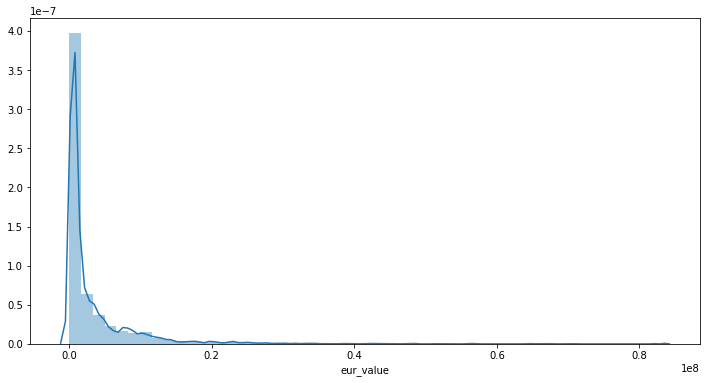

In [83]:
#let's look at distribution of eur_value. 
plt.figure(figsize=(12, 6))
sns.distplot(df_mid['eur_value'])

There's a very strong right skew to this data, same as with Forwards.

In [84]:
#drop zero & null values
df_mid = df_mid[df_mid['eur_value'].notnull() & (df_mid['eur_value'] != 0)]

#Log transform Y output values
df_mid['eur_value_log'] = np.log(df_mid['eur_value'])
df_mid.head()

,eur_value,overall,height_cm,weight_kg,age,pac,sho,pas,dri,def,...,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,prefer_foot,eur_value_log
8,79000000,90,182,78,27,56,81,89,81,73,...,85,79,88,73,85,63,82,69,1,18.184958
11,83000000,89,181,68,26,75,84,88,85,45,...,56,84,90,77,84,30,51,40,1,18.234351
13,67500000,89,169,62,28,86,84,80,89,40,...,42,86,83,77,86,30,39,35,1,18.027638
14,57000000,89,174,65,31,73,75,86,89,72,...,76,79,90,80,84,66,80,73,1,17.858562
22,70500000,88,174,70,26,72,75,85,90,62,...,78,83,86,75,83,49,64,62,1,18.071123


/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


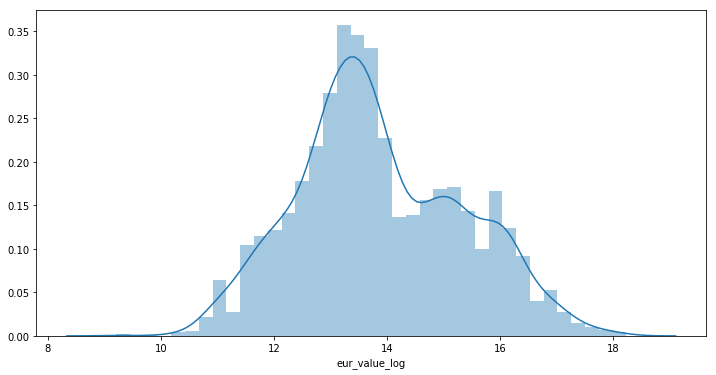

In [85]:
#Did log make a difference. 
plt.figure(figsize=(12, 6))
sns.distplot(df_mid['eur_value_log'])

The value distribution looks better, but distribution is still bimodal. Nonetheless, the data should be fine for linear regression purposes.

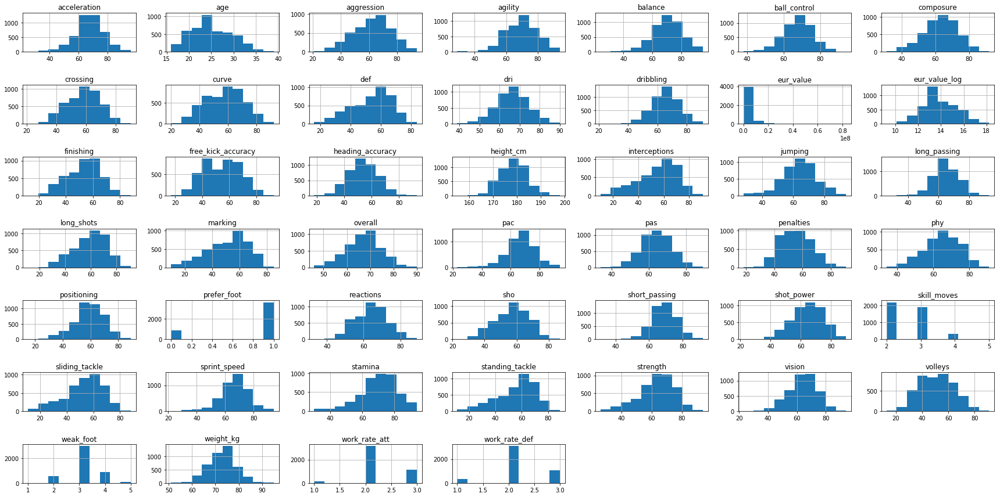

In [86]:
#Distributions of each variable
hist = df_mid.hist(figsize = (24, 12))
plt.tight_layout()

Again, the majority of labels look like they're normally distributed, which is helpful for regression purposes.

Midfielders appear to be much more balanced across the stats (more normally distributed) - which makes sense given their multi-faceted roles. Midfielders also are generally shorter than forwards.

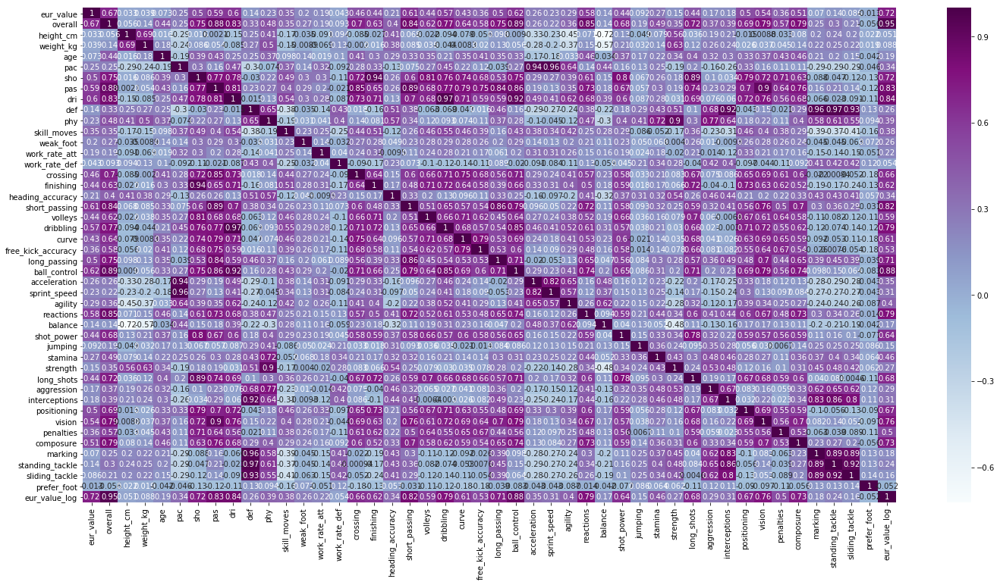

In [87]:
#plot heat map of correlations between variables
df_mid_heat = df_mid.corr()
plt.figure(figsize=(24, 12))
sns.heatmap(df_mid_heat, annot = True, cmap = 'BuPu')

The same collinearity issues per above occur - primarily among the parent statistics, overall and overlap between defending stats.

For midfielders, there is (naturally) a very high correlation between long and short passing, as well as interceptions and standing tackle. Interceptions should be dropped, but long passing should be kept, as this is still  a key skill for midfielders.

In [88]:
#drop above columns
df_mid1 = df_mid.drop(columns = ['eur_value','weight_kg', 'pac', 'acceleration', 'interceptions', 'overall', 'sho', 'pas', 'dri', 'def', 'phy', 'marking', 'sliding_tackle'])

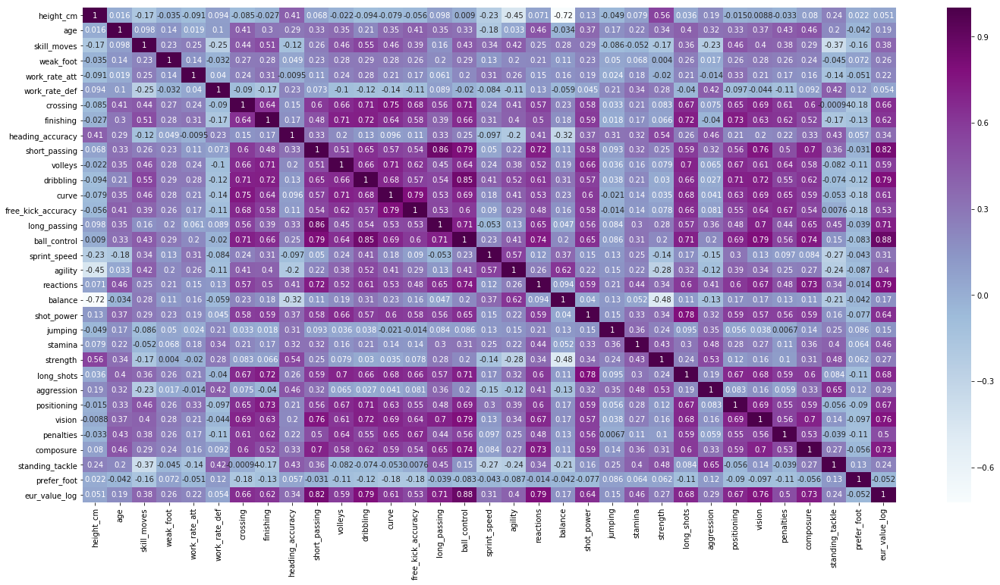

In [89]:
#Repeat above steps
df_mid_heat = df_mid1.corr()
plt.figure(figsize=(24, 12))
sns.heatmap(df_mid_heat, annot=True, cmap = 'BuPu')

A lot of collinearity has been reduced through dropping of variables, though short & long passing is still quite high. These will be kept for now.

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<Figure size 864x432 with 0 Axes>

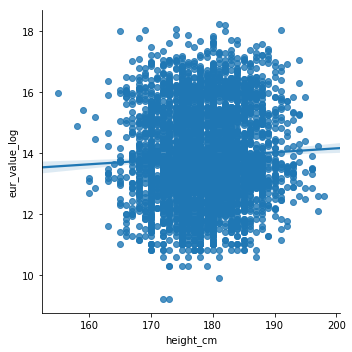

<Figure size 864x432 with 0 Axes>

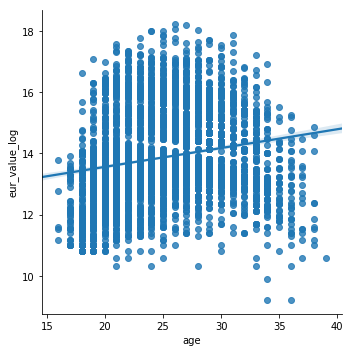

<Figure size 864x432 with 0 Axes>

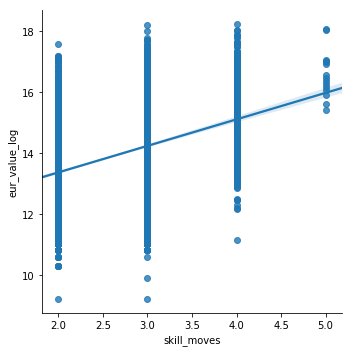

<Figure size 864x432 with 0 Axes>

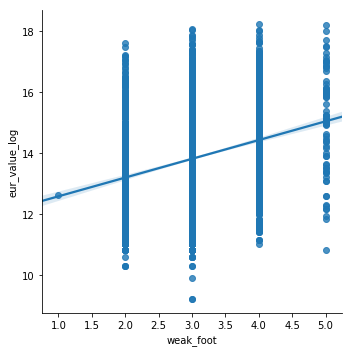

<Figure size 864x432 with 0 Axes>

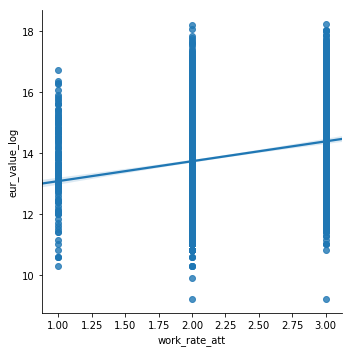

<Figure size 864x432 with 0 Axes>

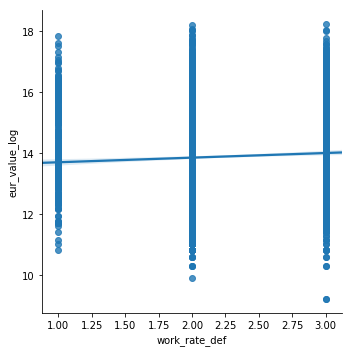

<Figure size 864x432 with 0 Axes>

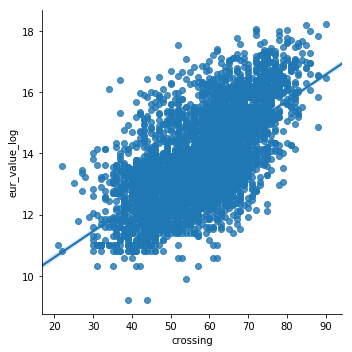

<Figure size 864x432 with 0 Axes>

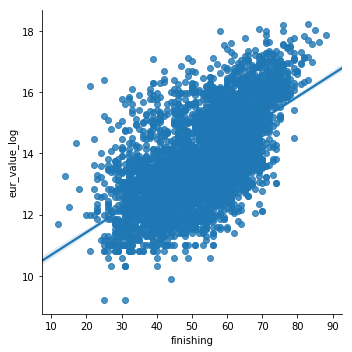

<Figure size 864x432 with 0 Axes>

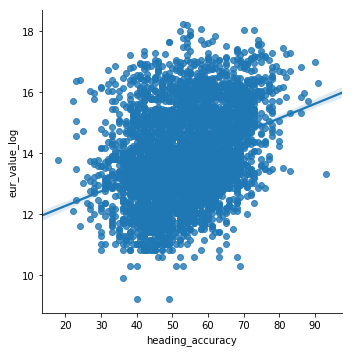

<Figure size 864x432 with 0 Axes>

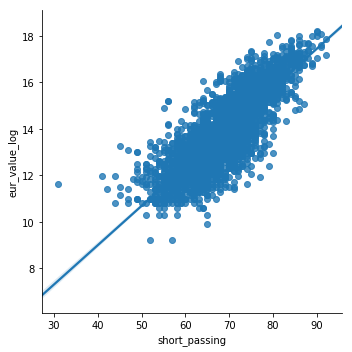

<Figure size 864x432 with 0 Axes>

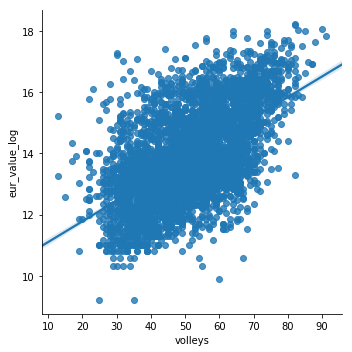

<Figure size 864x432 with 0 Axes>

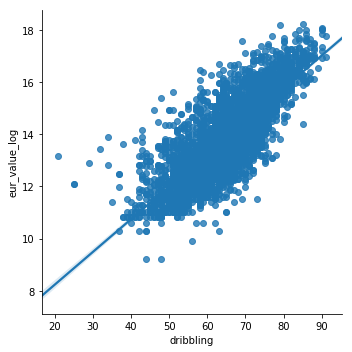

<Figure size 864x432 with 0 Axes>

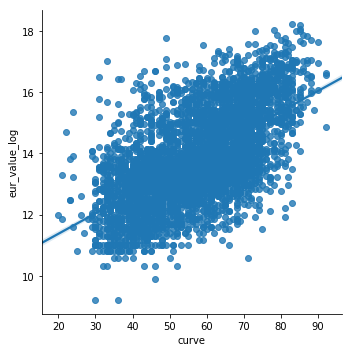

<Figure size 864x432 with 0 Axes>

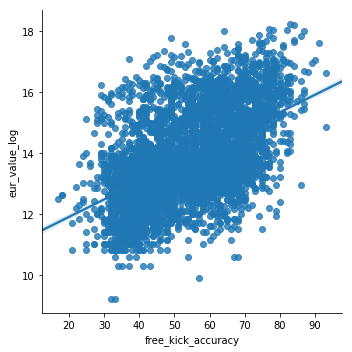

<Figure size 864x432 with 0 Axes>

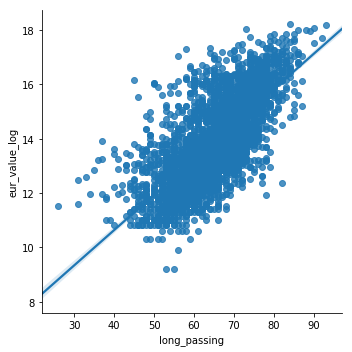

<Figure size 864x432 with 0 Axes>

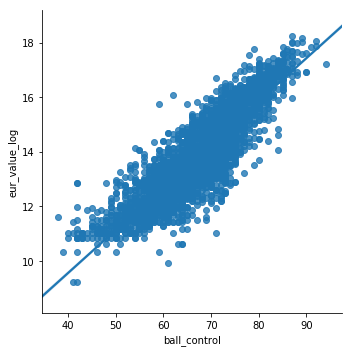

<Figure size 864x432 with 0 Axes>

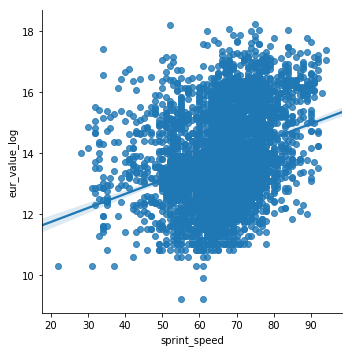

<Figure size 864x432 with 0 Axes>

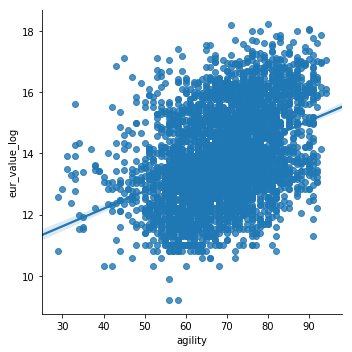

<Figure size 864x432 with 0 Axes>

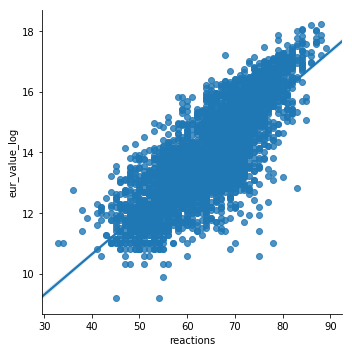

<Figure size 864x432 with 0 Axes>

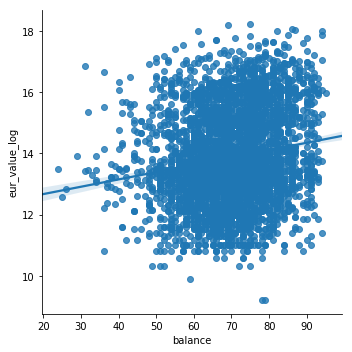

<Figure size 864x432 with 0 Axes>

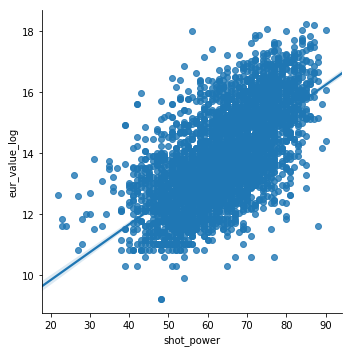

<Figure size 864x432 with 0 Axes>

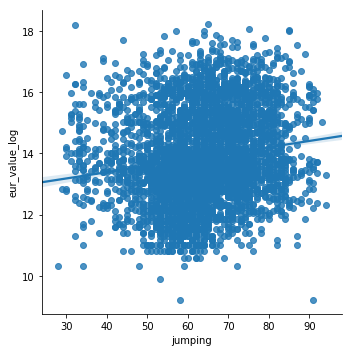

<Figure size 864x432 with 0 Axes>

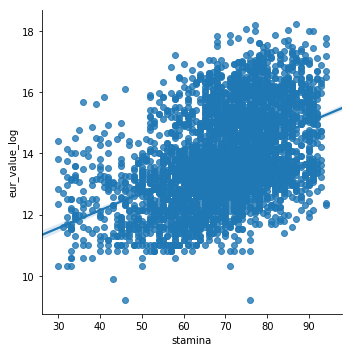

<Figure size 864x432 with 0 Axes>

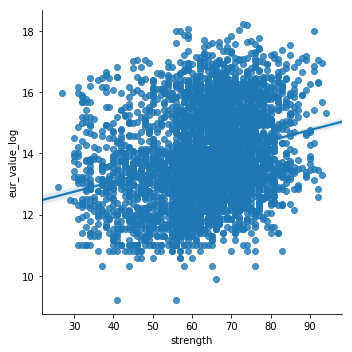

<Figure size 864x432 with 0 Axes>

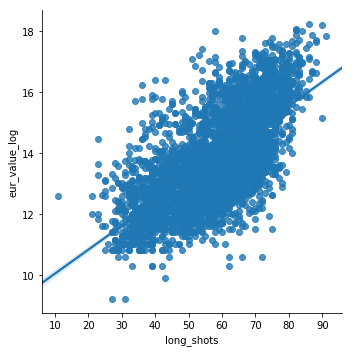

<Figure size 864x432 with 0 Axes>

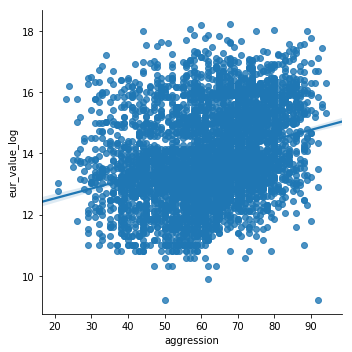

<Figure size 864x432 with 0 Axes>

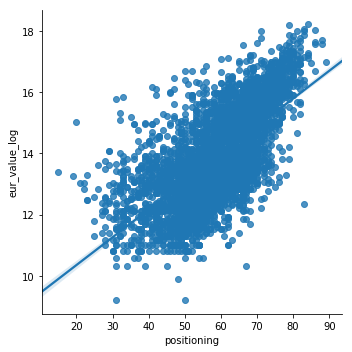

<Figure size 864x432 with 0 Axes>

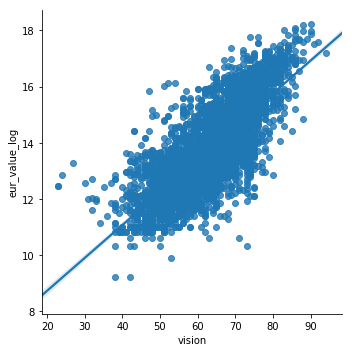

<Figure size 864x432 with 0 Axes>

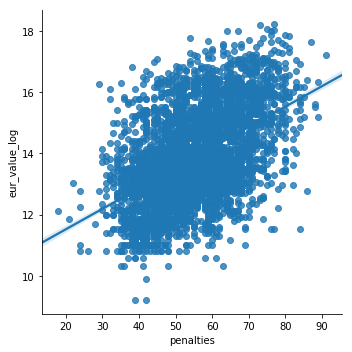

<Figure size 864x432 with 0 Axes>

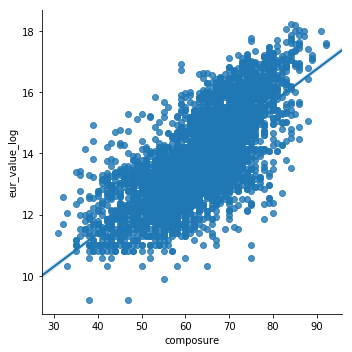

<Figure size 864x432 with 0 Axes>

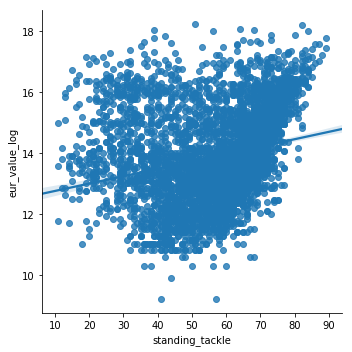

<Figure size 864x432 with 0 Axes>

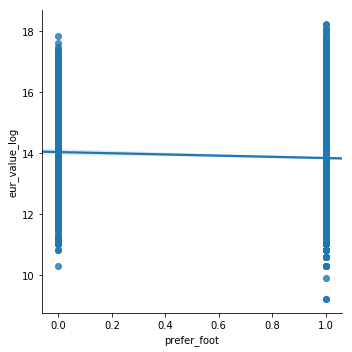

<Figure size 864x432 with 0 Axes>

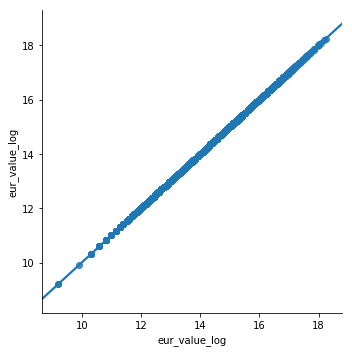

In [90]:
#Plot each variable against log of Eur value.
for col in df_mid1:
    plt.figure(figsize=(12, 6))
    sns.lmplot(x = col, y='eur_value_log', data=df_mid1)

Contrast with forwards, passing stats appear to be much more linearly related to eur_value. Not a surprise given midfielders have to pass a lot.  

Good shooting stats are valued highly - midfielders that score goals are generally valued more highly. 

Physical attributes (height, sprint speed) are not clearly linearly related to eur_value_log. Midfielders could be combative ball winners, or goal scorers - these results make sense given the varied roles midfielders have. 

## Model Fit - Midfielders

### Linear Regression

In [91]:
#set up our variables
X = df_mid[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'long_passing',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_mid['eur_value_log']

In [92]:
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [93]:
#create model
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [94]:
#See the Outputs
coefficients = pd.DataFrame(lm.coef_, X.columns, columns = ['Base OLS Coefficients'])
#insert intercept
coefficients.loc[len(coefficients)] = lm.intercept_
coefficients

,Base OLS Coefficients
height_cm,-0.006186
age,-0.078852
skill_moves,0.062732
weak_foot,-0.002046
work_rate_att,-0.068012
work_rate_def,0.013032
crossing,0.008615
finishing,0.005746
heading_accuracy,0.008209
short_passing,0.050946


Text(0.5,1,'Actual v Predicted Value of Eur_Value_Log')

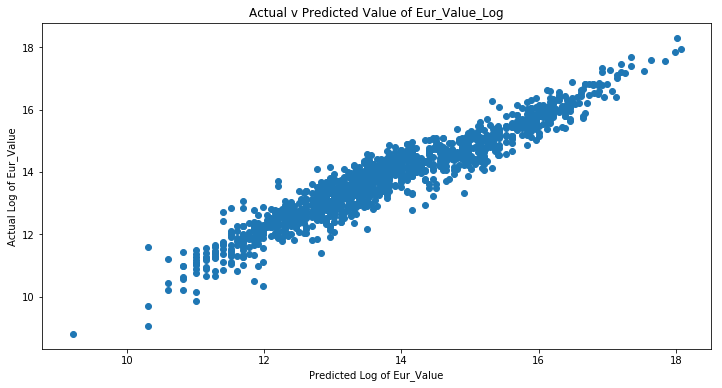

In [95]:
predictions = lm.predict(X_test)
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predictions)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('Actual v Predicted Value of Eur_Value_Log')

Linear model looks like a good fit for the data. Errors seem to be distributed randomly.

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


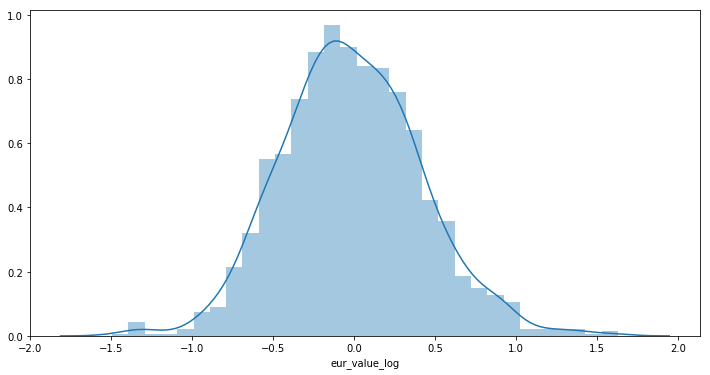

In [96]:
#Plot Errors
plt.figure(figsize=(12, 6))
sns.distplot(y_test-predictions)

Errors are normally distributed around zero.

In [97]:
#Evaluate error
mae = metrics.mean_absolute_error(y_test, predictions)
mse = metrics.mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))

MAE is: 0.34132062103772526
MSE is: 0.1866454484794104
RMSE is: 0.4320248239157218


K-Fold cross-validation to verify our MSE. 

In [98]:
#Implement the KFold Validation
cv_list = []
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = LinearRegression(), X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')
cv_ols = {'OLS MSE' : results.mean()*-1}
cv_list.append(cv_ols)
print('Average OLS MSE after 10-Fold Cross-Validation is', results.mean()*-1)

Average OLS MSE after 10-Fold Cross-Validation is 0.18886226141811968


In [99]:
#What's our R2 value?
print ('R2 Score:', lm.score(X_test, y_test))

R2 Score: 0.9107212354860641


In [100]:
#Calculate an AIC value for comparison
predict_val = lm.predict(X_test)
residuals = (y_test-predict_val)
sse = sum(residuals**2)
k = 33
AIC_ols = (2*k) - (2*np.log(sse))
print('AIC value is: ', AIC_ols)

AIC value is:  56.96521446553316


For midfielders, the base OLS Linear Regression appears to perform slightly worse than for forwards (comparing 10-Fold CV MSE). This may be explanable given that midfielders potentially have a large variety of roles to fill, but aren't necessarily good at everything, and are priced according to what they specialise in.

The R2 score looks relatively high, like with the Forwards. Again, we'll use Ridge & Lasso Regression to penalise an increase in features by reducing their impact on the end model.

### Ridge Regression

The hyperparameter, α lets us control how much we penalize the coefficients, with higher values of α creating simpler models. It effectively shrinks the coefficients if there is a high degree of multicollinearity?

In [102]:
#set up an array with range of alphas to iterate through
alphas = 10**np.linspace(10,-2,100)*0.5

In [101]:
#set up all variables
X = df_mid[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'long_passing',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_mid['eur_value_log']

In [103]:
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [104]:
#Use cross-validation to determine optimum level of alpha versus MSE. Normalise Data!
ridgecv = RidgeCV(alphas = alphas, scoring = 'neg_mean_squared_error', normalize = True)
ridgecv.fit(X_train, y_train)
alpha_opt = ridgecv.alpha_
print('Optimum Alpha to minimise MSE is: ', alpha_opt)

Optimum Alpha to minimise MSE is:  0.005


In [105]:
#Model Fit & Evaluation Using Optimum Alpha
ridge = Ridge(alpha = alpha_opt, normalize = True)
ridge.fit(X_train, y_train)
mse_opt = mean_squared_error(y_test, ridge.predict(X_test))
print('MSE at Alpha {} is {}'.format(alpha_opt, mse_opt))

MSE at Alpha 0.005 is 0.20675842241001494


In [106]:
#Run 10-Fold Cross-Validation
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = ridge, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')
#save errors to variables, append to list of CV MSE errors
cv_ridge = {'Ridge MSE': results.mean()*-1}
cv_list.append(cv_ridge)
print('Average Ridge Regression MSE after 10-Fold Cross-Validation is', results.mean()*-1)

Average Ridge Regression MSE after 10-Fold Cross-Validation is 0.1810617813853967


In [107]:
#Calculate an AIC value for comparison
predict_val = ridge.predict(X_test)
residuals = (y_test-predict_val)
sse = sum(residuals**2)
k = 33
AIC_ridge = (2*k) - (2*np.log(sse))
print('AIC value for Ridge Regression is: ', AIC_ridge)

AIC value for Ridge Regression is:  56.76053396452387


In [108]:
#let's compare shrinkage of coefficients with OLS
coefficients_ridge = pd.DataFrame(ridge.coef_, X.columns, columns = ['Ridge Coefficients'])
#insert intercept
coefficients_ridge.loc[len(coefficients_ridge)] = ridge.intercept_
coefficient_table = coefficients.join(coefficients_ridge)
coefficient_table

,Base OLS Coefficients,Ridge Coefficients
height_cm,-0.006186,-0.007993
age,-0.078852,-0.077646
skill_moves,0.062732,0.084096
weak_foot,-0.002046,-0.005596
work_rate_att,-0.068012,-0.060756
work_rate_def,0.013032,0.002111
crossing,0.008615,0.006762
finishing,0.005746,0.006442
heading_accuracy,0.008209,0.007190
short_passing,0.050946,0.047549


In [109]:
#show the difference in MSE between OLS and Ridge
cv_list

[{'OLS MSE': 0.18886226141811968}, {'Ridge MSE': 0.1810617813853967}]

For Midfielders, Ridge Regression provided an improvement in the 10-Fold Cross-Validated MSE compared with the base 10-Fold Cross-Validated OLS regression. It's also more notable than the difference observed for Forwards. 

### Lasso Regression

In [110]:
#set up the lasso cross validation process
lasso = Lasso(max_iter = 10000, normalize = True)
lassocv = LassoCV(alphas = None, cv = 10, max_iter = 100000, normalize = True)
lassocv.fit(X_train, y_train)
alpha_opt = lassocv.alpha_
print('Optimum Alpha to minimise Lasso MSE is: ', alpha_opt)

Optimum Alpha to minimise Lasso MSE is:  4.364737130036645e-05


In [111]:
#Model Fit & Evaluation
lasso.set_params(alpha=lassocv.alpha_)
lasso.fit(X_train, y_train)
mean_squared_error(y_test, lasso.predict(X_test))
mse_opt = mean_squared_error(y_test, lasso.predict(X_test))
print('MSE at Alpha {} is {}'.format(alpha_opt, mse_opt))

MSE at Alpha 4.364737130036645e-05 is 0.20643471882195172


In [112]:
#Run 10-Fold Cross-Validation
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = lasso, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

#save errors to variables, append to list of CV MSE errors
cv_lasso = {'Lasso MSE': results.mean()*-1}
cv_list.append(cv_lasso)
print('Average Lasso MSE after 10-Fold Cross-Validation is', results.mean()*-1)

Average Lasso MSE after 10-Fold Cross-Validation is 0.1808337430638282


<b> AIC: </b> Can AIC for Lasso be calculated given reduction of coefficients to zero? Literature is unclear.

In [113]:
#let's compare oefficients with other models
coefficients_lasso = pd.DataFrame(lasso.coef_, X.columns, columns = ['Lasso Coefficients'])
#insert intercept
coefficients_lasso.loc[len(coefficients_lasso)] = lasso.intercept_
coefficient_table.join(coefficients_lasso)

,Base OLS Coefficients,Ridge Coefficients,Lasso Coefficients
height_cm,-0.006186,-0.007993,-0.006082
age,-0.078852,-0.077646,-0.076418
skill_moves,0.062732,0.084096,0.078408
weak_foot,-0.002046,-0.005596,-0.001011
work_rate_att,-0.068012,-0.060756,-0.051302
work_rate_def,0.013032,0.002111,0.000000
crossing,0.008615,0.006762,0.006189
finishing,0.005746,0.006442,0.006230
heading_accuracy,0.008209,0.007190,0.007047
short_passing,0.050946,0.047549,0.048496


In [114]:
#show the difference in MSE between OLS and Ridge
cv_list

[{'OLS MSE': 0.18886226141811968},
 {'Ridge MSE': 0.1810617813853967},
 {'Lasso MSE': 0.1808337430638282}]

Lasso Regression performed similarly on 10-Fold Cross Validated MSE when compared with Ridge Regression. Only two coefficients were reduced to zero.

Of the variables removed:
1. Defensive Work Rate - Very interesting removal. Defensive midfielders aren't as valuable as their attacking counterparts, but to omit this entirely is unusual. Perhaps the vast majority of midfielders aren't specialist defensive midfielders, and have poor tackling & work rate stats (hence they aren't regarded as strong contributors to player value).
2. Standing Tackle - Per above.

Ridge and Lasso Regressions appeared to perform slightly better on 10-Fold Cross-Validation MSE than the base OLS Linear Regression.

### Recursive Feature Elimination (RFE)

As an alternative, RFE and Cross-Validation can be used as an automated way to to cut down features.

In [115]:
#set up our variables
X = df_mid1[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'long_passing',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_mid1['eur_value_log']

RFE CV can suggest which variables are most important using cross-validation processes.

In [116]:
#Set Up Dataframe of All Features
df_new = pd.DataFrame(data = df_mid1.columns, columns = ['attributes'])

#define model to use
linreg = LinearRegression()

#Set UP RFECV, using MSE as primary measurement metric and 5 folds
rfecv = RFECV(estimator=linreg, step=1, cv=KFold(5), scoring='neg_mean_squared_error')

#Fit RFECV to Model
rfecv.fit(X, y)

RFECV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
   estimator=LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False),
   n_jobs=1, scoring='neg_mean_squared_error', step=1, verbose=0)

In [117]:
#Where MSE is minimised, how many features are in the model?
rfecv.n_features_

31

In [118]:
#Create df of RFE Booleans
support = pd.DataFrame(data = rfecv.support_, columns = ['importance_flg'])

#Concat the columngs together
classifier = pd.concat([support, df_new], axis=1)

#Drop the last row, as this is our target variable
a = classifier.drop(len(classifier)-1)
b = a.loc[a['importance_flg'] == True]

#Convert to list, show us which attributes are important
c = list(b['attributes'])
c

['height_cm',
 'age',
 'skill_moves',
 'weak_foot',
 'work_rate_att',
 'work_rate_def',
 'crossing',
 'finishing',
 'heading_accuracy',
 'short_passing',
 'volleys',
 'dribbling',
 'curve',
 'free_kick_accuracy',
 'long_passing',
 'ball_control',
 'sprint_speed',
 'agility',
 'reactions',
 'balance',
 'shot_power',
 'stamina',
 'strength',
 'long_shots',
 'aggression',
 'positioning',
 'vision',
 'penalties',
 'composure',
 'standing_tackle',
 'prefer_foot']

According to RFECV, almost all of the originally input variables were retained. This is not necessarily unexpected, given the varied nature of midfielder roles. Jumping and marking were excluded, while defensive work rate and standing tackle were retained (c.f. Lasso Regression).

In [119]:
#Set Up model to read target and predictor variables
X = df_mid1[c]
y = df_mid1['eur_value_log']

#Train Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#Set Up & Fit Model
lm = LinearRegression()
lm.fit(X_train, y_train)

#pull predictions
predictions = lm.predict(X_test)


#Run 10-Fold Cross-Validation
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = LinearRegression(), X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

#save errors to variables, append to list of CV MSE errors
cv_rfe= {'RFE OLS MSE': results.mean()*-1}
cv_list.append(cv_rfe)

In [120]:
cv_list

[{'OLS MSE': 0.18886226141811968},
 {'Ridge MSE': 0.1810617813853967},
 {'Lasso MSE': 0.1808337430638282},
 {'RFE OLS MSE': 0.18932183202941405}]

In [121]:
#What's our R2 value?
print ('R2 Score:', lm.score(X_test, y_test))

R2 Score: 0.9164287258415001


In [122]:
#Calculate an AIC value for comparison
predict_val = lm.predict(X_test)
residuals = (y_test-predict_val)
sse = sum(residuals**2)
k = 31
AIC = (2*k) - (2*np.log(sse))
print('AIC value is: ', AIC)

AIC value is:  32.97457936513004


Using RFE CV, there is a very minimal increase in 10-Fold CV MSE when compared with the base OLS. Note that the AIC value is also less than the base OLS models.

It would appear that <u>Lasso Regression</u> is the preferred option from the Linear Regressions, as it has the fewest number of features, but the lowest MSE.

### Random Forest Regression

While normally used as a tool for classification problems, we can also use Random Forests for Regression.

In [123]:
#Set up Training & Test Data
X = df_mid1[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'long_passing',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_mid1['eur_value_log']

In [124]:
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [125]:
#Set up Model & Fit model to test data
RGR = RandomForestRegressor(n_jobs=-1)
RGR.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

Text(0.5,1,'Actual v Predicted Value of Eur_Value_Log')

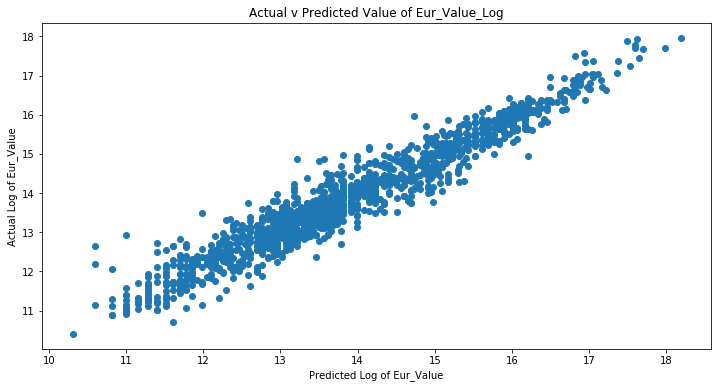

In [127]:
#plot graph
predictions = RGR.predict(X_test)
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predictions)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('Actual v Predicted Value of Eur_Value_Log')

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


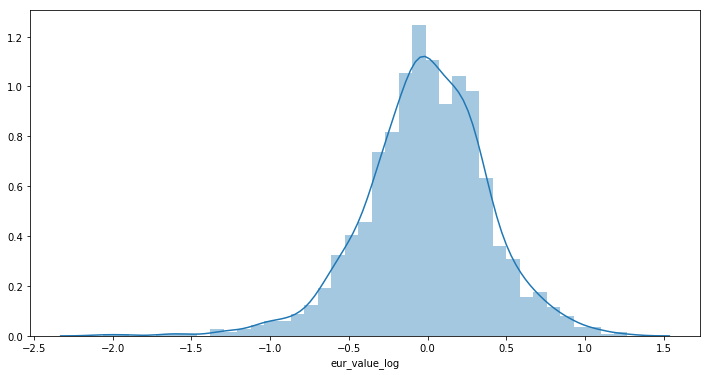

In [128]:
#Plot Errors
plt.figure(figsize=(12, 6))
sns.distplot(y_test-predictions)

In [129]:
#Run 10-Fold Cross-Validation on New Model - Evaluate Error
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = RGR, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predictions)
mse = metrics.mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('R2 Score is: ' + str(RGR.score(X_test, y_test)))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.29766735974315683
MSE is: 0.15452184936147983
RMSE is: 0.39309267273949516
R2 Score is: 0.926417628691329
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.15376401375981905


In respect of MSE, Random Forest Regression appears to have improved on the Lasso Regression model. We can continue to improve the MSE via optimising the hyperparameters.

### Random Forest Regression Optimisation

The key parameters we can optimise are:
1. n_estimators - the number of trees in the forest. This will generally be more accurate the higher you go.
2. max_features - The number of features to consider when looking for the best split. Documentation indicates that the default value is the total number of features in the data. This seems too high. <i> The Elements of Statistical Learning: 2nd Edition </i> (Hastie et. al. 2009, p. 592) indicates that it should be around <b>n/3</b> features, where n is the total number of features in the data. 
3. min_samples_leaf - The minimum number of samples required to be at a leaf node (default = 1)

In [130]:
#Set up Parameters
#Execute Grid Search - Warning - will take approx. 9 mins. 
param_grid = {'n_estimators': np.arange(7,21), 'max_features': np.arange(7,16),'min_samples_leaf':[1,2,3,4]}
Grid = GridSearchCV(RGR, param_grid, verbose = 2)
Grid.fit(X_train, y_train)

Fitting 3 folds for each of 504 candidates, totalling 1512 fits
[CV] max_features=7, min_samples_leaf=1, n_estimators=7 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=7 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=7 ..............


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=7 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=7 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=7 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=8 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=8 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=8 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=8 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=8 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=8 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=9 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=9 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=9 ..............
[CV] .

[CV] .... max_features=7, min_samples_leaf=2, n_estimators=12 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=13 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=13 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=13 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=13 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=13 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=13 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=14 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=14 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=14 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=15 .............
[CV] .

[CV] .... max_features=7, min_samples_leaf=3, n_estimators=18 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=18 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=18 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=18 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=18 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=19 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=19 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=19 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=19 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=19 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=19 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=20 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=20 .............
[CV] .

[CV] ..... max_features=8, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=9 ..............
[CV] ..... max_features=8, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=10 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=10 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=10 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=10 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=10 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=10 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=11 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=11 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=11 .............
[CV] .

[CV] .... max_features=8, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=15 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=15 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=15 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=15 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=15 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=15 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=16 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=16 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=16 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=17 .............
[CV] .

[CV] .... max_features=8, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=8, min_samples_leaf=3, n_estimators=20 .............
[CV] .... max_features=8, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=8, min_samples_leaf=3, n_estimators=20 .............
[CV] .... max_features=8, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=7 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=7 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=7 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=7 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=7 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=7 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=8 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=8 ..............
[CV] .

[CV] .... max_features=9, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=11 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=12 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=12 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=12 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=12 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=12 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=12 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=13 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=13 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=13 .............
[CV] .

[CV] .... max_features=9, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=17 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=17 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=17 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=17 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=17 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=17 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=18 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=18 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=18 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=19 .............
[CV] .

[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=8 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=8 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=9 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=9 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=9 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=9 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=9 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=9 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=10 .............
[CV] .... max_features=9, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=10 .............
[CV] .

[CV] ... max_features=10, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=13 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=14 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=14 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=14 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=14 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=14 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=14 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=15 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=15 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=15 ............
[CV] .

[CV] ... max_features=10, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=19 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=19 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=19 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=19 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=19 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=19 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=20 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=20 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=20 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=10, min_samples_leaf=3, n_estimators=7 .............
[CV] .

[CV] ... max_features=10, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=10 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=10 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=11 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=11 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=11 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=11 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=11 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=11 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=12 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=12 ............
[CV] .

[CV] ... max_features=11, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=15 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=16 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=16 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=16 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=16 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=16 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=16 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=17 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=17 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=17 ............
[CV] .

[CV] ... max_features=11, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=7 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=7 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=7 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=7 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=7 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=7 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=8 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=8 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=8 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=9 .............
[CV] .

[CV] ... max_features=11, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=12 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=12 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=13 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=13 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=13 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=13 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=13 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=13 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=14 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=14 ............
[CV] .

[CV] ... max_features=12, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=17 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=18 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=18 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=18 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=18 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=18 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=18 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=19 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=19 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=19 ............
[CV] .

[CV] .... max_features=12, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=9 .............
[CV] .... max_features=12, min_samples_leaf=3, n_estimators=9 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=9 .............
[CV] .... max_features=12, min_samples_leaf=3, n_estimators=9 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=9 .............
[CV] .... max_features=12, min_samples_leaf=3, n_estimators=9 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=10 ............
[CV] ... max_features=12, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=10 ............
[CV] ... max_features=12, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=10 ............
[CV] ... max_features=12, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=11 ............
[CV] .

[CV] ... max_features=12, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=14 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=14 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=15 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=15 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=15 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=15 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=15 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=15 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=16 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=16 ............
[CV] .

[CV] ... max_features=13, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=19 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=20 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=20 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=20 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=20 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=20 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=20 -   0.2s
[CV] max_features=13, min_samples_leaf=2, n_estimators=7 .............
[CV] .... max_features=13, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=13, min_samples_leaf=2, n_estimators=7 .............
[CV] .... max_features=13, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=13, min_samples_leaf=2, n_estimators=7 .............
[CV] .

[CV] ... max_features=13, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=11 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=11 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=11 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=11 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=11 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=11 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=12 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=12 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=12 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=13 ............
[CV] .

[CV] ... max_features=13, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=16 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=16 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=17 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=17 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=17 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=17 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=17 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=17 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=18 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=18 ............
[CV] .

[CV] .... max_features=14, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=7 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=8 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=8 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=8 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=8 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=8 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=8 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=9 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=9 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=9 .............
[CV] .

[CV] ... max_features=14, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=13 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=13 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=13 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=13 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=13 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=13 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=14 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=14 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=14 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=15 ............
[CV] .

[CV] ... max_features=14, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=18 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=18 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=19 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=19 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=19 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=19 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=19 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=19 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=20 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=20 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=20 ............
[CV] .

[CV] .... max_features=15, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=9 .............
[CV] .... max_features=15, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=10 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=10 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=10 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=10 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=10 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=10 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=11 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=11 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=11 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=11 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=11 ............
[CV] .

[CV] ... max_features=15, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=15 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=15 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=15 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=15 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=15 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=15 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=16 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=16 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=16 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=16 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=16 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=16 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=17 ............
[CV] .

[CV] ... max_features=15, min_samples_leaf=4, n_estimators=20 -   0.2s
[CV] max_features=15, min_samples_leaf=4, n_estimators=20 ............
[CV] ... max_features=15, min_samples_leaf=4, n_estimators=20 -   0.2s
[CV] max_features=15, min_samples_leaf=4, n_estimators=20 ............
[CV] ... max_features=15, min_samples_leaf=4, n_estimators=20 -   0.2s


[Parallel(n_jobs=1)]: Done 1512 out of 1512 | elapsed:  5.6min finished


GridSearchCV(cv=None, error_score='raise',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'n_estimators': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]), 'max_features': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15]), 'min_samples_leaf': [1, 2, 3, 4]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=2)

In [131]:
#Pull out optimum parameters
Grid.best_params_

{'max_features': 14, 'min_samples_leaf': 1, 'n_estimators': 20}

The Grid Search has identified the above values to be the optimum values. These values will be used in a new Random Forest Regression to see the impact on MSE. 

In [132]:
#Rebuild Model using Optimum Parameters
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#Fit Model
RGR_new = RandomForestRegressor(n_estimators = 20, max_features = 14, min_samples_leaf = 1)
RGR_new.fit(X_train, y_train)
prediction = RGR_new.predict(X_test)

In [133]:
#Run 10-Fold Cross-Validation on New Model
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = RGR_new, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, prediction)
mse = metrics.mean_squared_error(y_test, prediction)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('R2 Score is: ' + str(RGR_new.score(X_test, y_test)))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.27542951110375663
MSE is: 0.13546395673900788
RMSE is: 0.3680542850436711
R2 Score is: 0.937611067773292
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.14495151717523352


The tuning of hyperparameters did appear to have a positive impact on MSE. 

In [134]:
#Key Features
importances = RGR_new.feature_importances_
indices = np.argsort(importances)
features = X.columns

Text(0.5,0,'Relative Importance')

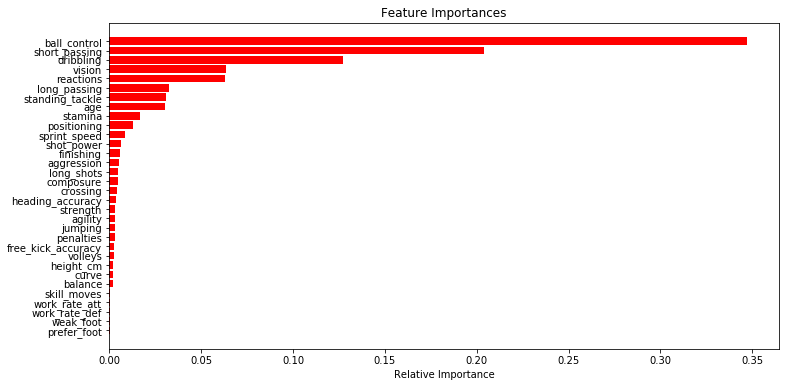

In [135]:
plt.figure(figsize = (12,6))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='r', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')

The most important features within the Random Forest Regression appear consistent with features identified as important by the Lasso Regression. They also make sense from an intuitive point of view, where vision and passing are particularly valuable attributes for a midfielder. 

Unlike the Lasso Regression, it appears that standing tackle is a relatively important feature within this model. Also noteworthy that age and stamina are also important considerations - midfielders cover the most ground, and so being able to run for the full game is important. Finally, the lack of free kick importance is also interesting.

### Support Vector Regression

Another predictive technique that could be used is support vector regression. This another regression technique that can pull the data into higher dimensions to create a closer line of fit, at the cost of explanation (i.e. I would not be able to explain exactly what 'features' the model is using).

In [136]:
#Set up Data
X = df_mid1[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'long_passing',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_mid1['eur_value_log']

In [137]:
#Requires Scaling of Data
scalar = StandardScaler()
scalar.fit(X)
scaled_features = scalar.transform(X)
df_scaled = pd.DataFrame(data = scaled_features, columns = X.columns)

In [139]:
#Set up Scaled Data
X = df_scaled
y = df_mid1['eur_value_log']

#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [140]:
#Instantiate a few models, evaluate best fit - start with the radial basis function
svr_rbf = SVR(kernel = 'rbf')
svr_rbf.fit(X_train, y_train)
predict_val_rbf = svr_rbf.predict(X_test)

#Try the linear model
svr_lin = SVR(kernel = 'linear')
svr_lin.fit(X_train, y_train)
predict_val_lin = svr_lin.predict(X_test)

#Try the polynomial model
svr_poly = SVR(kernel = 'poly')
svr_poly.fit(X_train, y_train)
predict_val_poly = svr_poly.predict(X_test)

In [141]:
#Run 10-Fold Cross-Validation on RBF
svr_list = []
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_rbf, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_rbf)
mse = metrics.mean_squared_error(y_test, predict_val_rbf)
rmse = np.sqrt(mse)

rbf = {'RBF SVR MSE' : results.mean()*-1}
svr_list.append(rbf)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.2512799030909751
MSE is: 0.11148217303894505
RMSE is: 0.33388946230593297
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.11242991797204258


Text(0.5,1,'SVR RBF Function - Actual v Predicted Value of Eur_Value_Log')

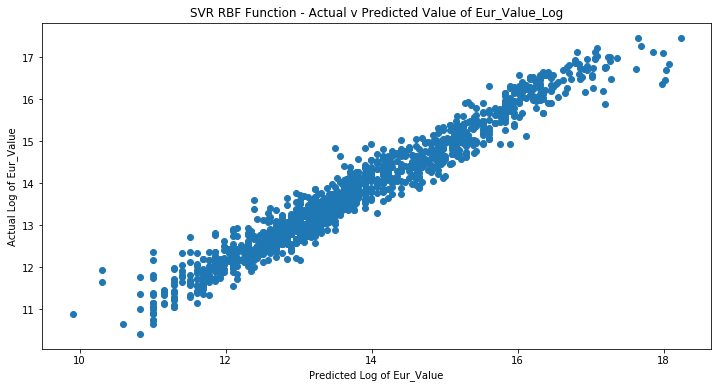

In [142]:
#Plot the functions as a comparison
#Plot the RBF function
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predict_val_rbf)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('SVR RBF Function - Actual v Predicted Value of Eur_Value_Log')

In [143]:
#linear SVR
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_lin, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_lin)
mse = metrics.mean_squared_error(y_test, predict_val_lin)
rmse = np.sqrt(mse)

lin = {'Linear SVR MSE' : results.mean()*-1}
svr_list.append(lin)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('Average MSE for Linear SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.3356765042572237
MSE is: 0.18783604629156492
RMSE is: 0.43340056101897806
Average MSE for Linear SVR after 10-Fold Cross-Validation is 0.1946533327711834


Text(0.5,1,'SVR Linear Function - Actual v Predicted Value of Eur_Value_Log')

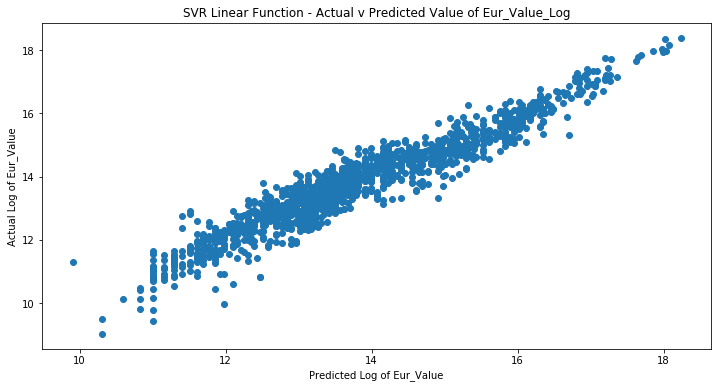

In [144]:
#linear
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predict_val_lin)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('SVR Linear Function - Actual v Predicted Value of Eur_Value_Log')

In [145]:
#Poly SVR
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_poly, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_poly)
mse = metrics.mean_squared_error(y_test, predict_val_poly)
rmse = np.sqrt(mse)

poly = {'Poly SVR MSE' : results.mean()*-1}
svr_list.append(poly)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('Average MSE for Poly SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.5182993148088526
MSE is: 0.5120629975145732
RMSE is: 0.7155857722974747
Average MSE for Poly SVR after 10-Fold Cross-Validation is 0.43105265800671144


Text(0.5,1,'SVR Polynomial Function - Actual v Predicted Value of Eur_Value_Log')

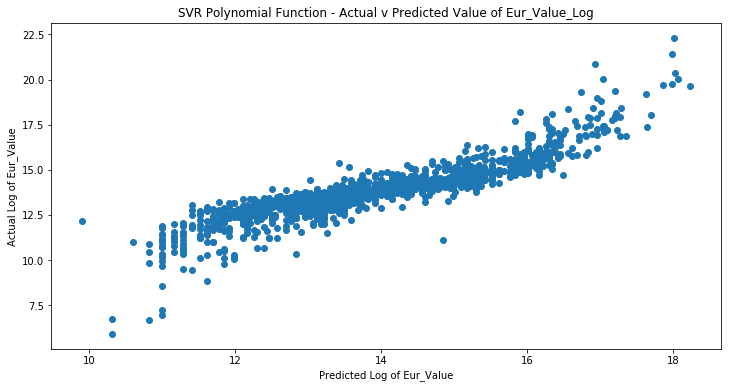

In [146]:
#Plot the Poly function
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predict_val_poly)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('SVR Polynomial Function - Actual v Predicted Value of Eur_Value_Log')

In [147]:
#Output list of MSE values
svr_list

[{'RBF SVR MSE': 0.11242991797204258},
 {'Linear SVR MSE': 0.1946533327711834},
 {'Poly SVR MSE': 0.43105265800671144}]

### SVR Optimisation

It appears the RBF function appears to have the closest set of predictions to actual target variables based on MSE. This kernel will be used going forward for optimisation. 

The parameters to be optimised are:
1. C (the error term) - Cost of misclassification on the training data. A higher C gives us lower bias(higher variance).  
2. γ (Kernel coefficient) - A lower Gamma means a Gaussian with a higher variance (lower bias). 
3. ϵ (epsilon) - how lenient the model is in classifying an error. 

We will do this via brute force optimisation (Grid Search CV).

In [148]:
#Set up Parameters

#Built in range doesn't support floats for epsilon values, set up custom function
def frange(start, stop, step):
    i = start
    while i < stop:
        yield i
        i += step

#generate lists
epsilon_params = []
c_params = []

for i in frange(0.0, 1.0, 0.1):
    epsilon_params.append(i)

for i in frange(0.1, 2.0, 0.2):
    c_params.append(i)

In [149]:
#Execute Grid Search - Warning - will take approx. 7 mins. 
param_grid = {'C': c_params, 'epsilon': epsilon_params,'gamma':[1,0.1,0.01,0.001]}
Grid = GridSearchCV(svr_rbf, param_grid, verbose = 2)
Grid.fit(X_train, y_train)

Fitting 3 folds for each of 440 candidates, totalling 1320 fits
[CV] C=0.1, epsilon=0.0, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.0, gamma=1 -   0.4s
[CV] C=0.1, epsilon=0.0, gamma=1 .....................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV] ............................ C=0.1, epsilon=0.0, gamma=1 -   0.4s
[CV] C=0.1, epsilon=0.0, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.0, gamma=1 -   0.4s
[CV] C=0.1, epsilon=0.0, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.0, gamma=0.1 -   0.3s
[CV] C=0.1, epsilon=0.0, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.0, gamma=0.1 -   0.3s
[CV] C=0.1, epsilon=0.0, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.0, gamma=0.1 -   0.3s
[CV] C=0.1, epsilon=0.0, gamma=0.01 ..................................
[CV] ......................... C=0.1, epsilon=0.0, gamma=0.01 -   0.3s
[CV] C=0.1, epsilon=0.0, gamma=0.01 ..................................
[CV] ......................... C=0.1, epsilon=0.0, gamma=0.01 -   0.3s
[CV] C=0.1, epsilon=0.0, gamma=0.01 ..................................
[CV] .

[CV] ............................ C=0.1, epsilon=0.5, gamma=1 -   0.3s
[CV] C=0.1, epsilon=0.5, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.5, gamma=1 -   0.3s
[CV] C=0.1, epsilon=0.5, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.5, gamma=1 -   0.3s
[CV] C=0.1, epsilon=0.5, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=0.1, epsilon=0.5, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=0.1, epsilon=0.5, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=0.1, epsilon=0.5, gamma=0.01 ..................................
[CV] ......................... C=0.1, epsilon=0.5, gamma=0.01 -   0.1s
[CV] C=0.1, epsilon=0.5, gamma=0.01 ..................................
[CV] .

[CV] ......... C=0.1, epsilon=0.8999999999999999, gamma=0.001 -   0.1s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=1 ......................
[CV] ............. C=0.1, epsilon=0.9999999999999999, gamma=1 -   0.2s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=1 ......................
[CV] ............. C=0.1, epsilon=0.9999999999999999, gamma=1 -   0.2s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=1 ......................
[CV] ............. C=0.1, epsilon=0.9999999999999999, gamma=1 -   0.2s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=0.1 ....................
[CV] ........... C=0.1, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=0.1 ....................
[CV] ........... C=0.1, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=0.1 ....................
[CV] ........... C=0.1, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=0.01 ...................
[CV] .

[CV]  C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 .
[CV]  C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 .
[CV]  C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=0.30000000000000004, epsilon=0.4, gamma=1 .....................
[CV] ............ C=0.30000000000000004, epsilon=0.4, gamma=1 -   0.4s
[CV] C=0.30000000000000004, epsilon=0.4, gamma=1 .....................
[CV] ............ C=0.30000000000000004, epsilon=0.4, gamma=1 -   0.4s
[CV] C=0.30000000000000004, epsilon=0.4, gamma=1 .....................
[CV] ............ C=0.30000000000000004, epsilon=0.4, gamma=1 -   0.4s
[CV] C=0.30000000000000004, epsilon=0.4, gamma=0.1 ...................
[CV] .......... C=0.30000000000000004, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=0.30000000000000004, epsilon=0.4, gamma=0.1 ..

[CV]  C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 -   0.1s
[CV] C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 ..
[CV]  C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 -   0.1s
[CV] C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 ......
[CV]  C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 ......
[CV]  C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 ......
[CV]  C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=0.30000000000000004, epsilon=0.8999999999999999, gamma=0.1 ....
[CV]  C=0.30000000000000004, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=0.30000000000000004, epsilon=0.8999999999999999, gamma=0.1 ....
[CV]  C=0.30000000000000004, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=0.30000000000000004, epsilon=0.899999

[CV] ......................... C=0.5, epsilon=0.2, gamma=0.01 -   0.2s
[CV] C=0.5, epsilon=0.2, gamma=0.01 ..................................
[CV] ......................... C=0.5, epsilon=0.2, gamma=0.01 -   0.2s
[CV] C=0.5, epsilon=0.2, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.2, gamma=0.001 -   0.2s
[CV] C=0.5, epsilon=0.2, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.2, gamma=0.001 -   0.2s
[CV] C=0.5, epsilon=0.2, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.2, gamma=0.001 -   0.2s
[CV] C=0.5, epsilon=0.30000000000000004, gamma=1 .....................
[CV] ............ C=0.5, epsilon=0.30000000000000004, gamma=1 -   0.4s
[CV] C=0.5, epsilon=0.30000000000000004, gamma=1 .....................
[CV] ............ C=0.5, epsilon=0.30000000000000004, gamma=1 -   0.4s
[CV] C=0.5, epsilon=0.30000000000000004, gamma=1 .....................
[CV] .

[CV] ......................... C=0.5, epsilon=0.7, gamma=0.01 -   0.0s
[CV] C=0.5, epsilon=0.7, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.7, gamma=0.001 -   0.1s
[CV] C=0.5, epsilon=0.7, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.7, gamma=0.001 -   0.1s
[CV] C=0.5, epsilon=0.7, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.7, gamma=0.001 -   0.1s
[CV] C=0.5, epsilon=0.7999999999999999, gamma=1 ......................
[CV] ............. C=0.5, epsilon=0.7999999999999999, gamma=1 -   0.3s
[CV] C=0.5, epsilon=0.7999999999999999, gamma=1 ......................
[CV] ............. C=0.5, epsilon=0.7999999999999999, gamma=1 -   0.3s
[CV] C=0.5, epsilon=0.7999999999999999, gamma=1 ......................
[CV] ............. C=0.5, epsilon=0.7999999999999999, gamma=1 -   0.3s
[CV] C=0.5, epsilon=0.7999999999999999, gamma=0.1 ....................
[CV] .

[CV] ......................... C=0.7, epsilon=0.1, gamma=0.01 -   0.3s
[CV] C=0.7, epsilon=0.1, gamma=0.01 ..................................
[CV] ......................... C=0.7, epsilon=0.1, gamma=0.01 -   0.3s
[CV] C=0.7, epsilon=0.1, gamma=0.01 ..................................
[CV] ......................... C=0.7, epsilon=0.1, gamma=0.01 -   0.3s
[CV] C=0.7, epsilon=0.1, gamma=0.001 .................................
[CV] ........................ C=0.7, epsilon=0.1, gamma=0.001 -   0.3s
[CV] C=0.7, epsilon=0.1, gamma=0.001 .................................
[CV] ........................ C=0.7, epsilon=0.1, gamma=0.001 -   0.3s
[CV] C=0.7, epsilon=0.1, gamma=0.001 .................................
[CV] ........................ C=0.7, epsilon=0.1, gamma=0.001 -   0.3s
[CV] C=0.7, epsilon=0.2, gamma=1 .....................................
[CV] ............................ C=0.7, epsilon=0.2, gamma=1 -   0.4s
[CV] C=0.7, epsilon=0.2, gamma=1 .....................................
[CV] .

[CV] .......................... C=0.7, epsilon=0.6, gamma=0.1 -   0.1s
[CV] C=0.7, epsilon=0.6, gamma=0.1 ...................................
[CV] .......................... C=0.7, epsilon=0.6, gamma=0.1 -   0.1s
[CV] C=0.7, epsilon=0.6, gamma=0.01 ..................................
[CV] ......................... C=0.7, epsilon=0.6, gamma=0.01 -   0.0s
[CV] C=0.7, epsilon=0.6, gamma=0.01 ..................................
[CV] ......................... C=0.7, epsilon=0.6, gamma=0.01 -   0.0s
[CV] C=0.7, epsilon=0.6, gamma=0.01 ..................................
[CV] ......................... C=0.7, epsilon=0.6, gamma=0.01 -   0.0s
[CV] C=0.7, epsilon=0.6, gamma=0.001 .................................
[CV] ........................ C=0.7, epsilon=0.6, gamma=0.001 -   0.1s
[CV] C=0.7, epsilon=0.6, gamma=0.001 .................................
[CV] ........................ C=0.7, epsilon=0.6, gamma=0.001 -   0.1s
[CV] C=0.7, epsilon=0.6, gamma=0.001 .................................
[CV] .

[CV] ............. C=0.8999999999999999, epsilon=0.0, gamma=1 -   0.5s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.0, gamma=0.1 -   0.5s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.0, gamma=0.1 -   0.5s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.0, gamma=0.1 -   0.5s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.01 ...................
[CV] .......... C=0.8999999999999999, epsilon=0.0, gamma=0.01 -   0.4s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.01 ...................
[CV] .......... C=0.8999999999999999, epsilon=0.0, gamma=0.01 -   0.4s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.01 ...................
[CV] .......... C=0.8999999999999999, epsilon=0.0, gamma=0.01 -   0.4s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.001 ..................
[CV] .

[CV] ............. C=0.8999999999999999, epsilon=0.5, gamma=1 -   0.4s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=1 ......................
[CV] ............. C=0.8999999999999999, epsilon=0.5, gamma=1 -   0.4s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=1 ......................
[CV] ............. C=0.8999999999999999, epsilon=0.5, gamma=1 -   0.4s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.5, gamma=0.1 -   0.1s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.5, gamma=0.1 -   0.1s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.01 ...................
[CV] .......... C=0.8999999999999999, epsilon=0.5, gamma=0.01 -   0.1s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.01 ...................
[CV] .

[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 -   0.4s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 -   0.3s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 -   0.3s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.01 ....
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.01 -   0.0s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999,

[CV]  C=1.0999999999999999, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.0999999999999999, epsilon=0.4, gamma=1 -   0.4s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.0999999999999999, epsilon=0.4, gamma=1 -   0.4s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.0999999999999999, epsilon=0.4, gamma=1 -   0.4s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=0.1 ....................
[CV] ........... C=1.0999999999999999, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=0.1 ....................
[CV] ........... C=1.0999999999999999, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=0.1 ....................
[CV] ........... C=1.0999999999999999, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=0.01 ...................

[CV]  C=1.0999999999999999, epsilon=0.7999999999999999, gamma=0.001 -   0.0s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=0.1 .....
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=0.1 .....
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=0.1 .....
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999

[CV] ......... C=1.2999999999999998, epsilon=0.2, gamma=0.001 -   0.2s
[CV] C=1.2999999999999998, epsilon=0.2, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.2, gamma=0.001 -   0.2s
[CV] C=1.2999999999999998, epsilon=0.2, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.2, gamma=0.001 -   0.2s
[CV] C=1.2999999999999998, epsilon=0.30000000000000004, gamma=1 ......
[CV]  C=1.2999999999999998, epsilon=0.30000000000000004, gamma=1 -   0.4s
[CV] C=1.2999999999999998, epsilon=0.30000000000000004, gamma=1 ......
[CV]  C=1.2999999999999998, epsilon=0.30000000000000004, gamma=1 -   0.4s
[CV] C=1.2999999999999998, epsilon=0.30000000000000004, gamma=1 ......
[CV]  C=1.2999999999999998, epsilon=0.30000000000000004, gamma=1 -   0.4s
[CV] C=1.2999999999999998, epsilon=0.30000000000000004, gamma=0.1 ....
[CV]  C=1.2999999999999998, epsilon=0.30000000000000004, gamma=0.1 -   0.2s
[CV] C=1.2999999999999998, epsilon=0.30000000000000004, gamma=0

[CV] ......... C=1.2999999999999998, epsilon=0.7, gamma=0.001 -   0.1s
[CV] C=1.2999999999999998, epsilon=0.7, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.7, gamma=0.001 -   0.0s
[CV] C=1.2999999999999998, epsilon=0.7999999999999999, gamma=1 .......
[CV]  C=1.2999999999999998, epsilon=0.7999999999999999, gamma=1 -   0.3s
[CV] C=1.2999999999999998, epsilon=0.7999999999999999, gamma=1 .......
[CV]  C=1.2999999999999998, epsilon=0.7999999999999999, gamma=1 -   0.3s
[CV] C=1.2999999999999998, epsilon=0.7999999999999999, gamma=1 .......
[CV]  C=1.2999999999999998, epsilon=0.7999999999999999, gamma=1 -   0.3s
[CV] C=1.2999999999999998, epsilon=0.7999999999999999, gamma=0.1 .....
[CV]  C=1.2999999999999998, epsilon=0.7999999999999999, gamma=0.1 -   0.1s
[CV] C=1.2999999999999998, epsilon=0.7999999999999999, gamma=0.1 .....
[CV]  C=1.2999999999999998, epsilon=0.7999999999999999, gamma=0.1 -   0.1s
[CV] C=1.2999999999999998, epsilon=0.7999999999999999, gamma=0.

[CV] .......... C=1.4999999999999998, epsilon=0.1, gamma=0.01 -   0.3s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.01 ...................
[CV] .......... C=1.4999999999999998, epsilon=0.1, gamma=0.01 -   0.3s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.001 ..................
[CV] ......... C=1.4999999999999998, epsilon=0.1, gamma=0.001 -   0.3s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.001 ..................
[CV] ......... C=1.4999999999999998, epsilon=0.1, gamma=0.001 -   0.3s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.001 ..................
[CV] ......... C=1.4999999999999998, epsilon=0.1, gamma=0.001 -   0.3s
[CV] C=1.4999999999999998, epsilon=0.2, gamma=1 ......................
[CV] ............. C=1.4999999999999998, epsilon=0.2, gamma=1 -   0.5s
[CV] C=1.4999999999999998, epsilon=0.2, gamma=1 ......................
[CV] ............. C=1.4999999999999998, epsilon=0.2, gamma=1 -   0.4s
[CV] C=1.4999999999999998, epsilon=0.2, gamma=1 ......................
[CV] .

[CV] .......... C=1.4999999999999998, epsilon=0.6, gamma=0.01 -   0.0s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.01 ...................
[CV] .......... C=1.4999999999999998, epsilon=0.6, gamma=0.01 -   0.0s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.001 ..................
[CV] ......... C=1.4999999999999998, epsilon=0.6, gamma=0.001 -   0.1s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.001 ..................
[CV] ......... C=1.4999999999999998, epsilon=0.6, gamma=0.001 -   0.1s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.001 ..................
[CV] ......... C=1.4999999999999998, epsilon=0.6, gamma=0.001 -   0.1s
[CV] C=1.4999999999999998, epsilon=0.7, gamma=1 ......................
[CV] ............. C=1.4999999999999998, epsilon=0.7, gamma=1 -   0.3s
[CV] C=1.4999999999999998, epsilon=0.7, gamma=1 ......................
[CV] ............. C=1.4999999999999998, epsilon=0.7, gamma=1 -   0.4s
[CV] C=1.4999999999999998, epsilon=0.7, gamma=1 ......................
[CV] .

[CV] ........... C=1.6999999999999997, epsilon=0.0, gamma=0.1 -   0.5s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.0, gamma=0.1 -   0.5s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.01 ...................
[CV] .......... C=1.6999999999999997, epsilon=0.0, gamma=0.01 -   0.4s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.01 ...................
[CV] .......... C=1.6999999999999997, epsilon=0.0, gamma=0.01 -   0.4s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.01 ...................
[CV] .......... C=1.6999999999999997, epsilon=0.0, gamma=0.01 -   0.4s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.001 ..................
[CV] ......... C=1.6999999999999997, epsilon=0.0, gamma=0.001 -   0.3s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.001 ..................
[CV] ......... C=1.6999999999999997, epsilon=0.0, gamma=0.001 -   0.3s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.001 ..................
[CV] .

[CV] ............. C=1.6999999999999997, epsilon=0.5, gamma=1 -   0.4s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.5, gamma=0.1 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.5, gamma=0.1 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.5, gamma=0.1 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.01 ...................
[CV] .......... C=1.6999999999999997, epsilon=0.5, gamma=0.01 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.01 ...................
[CV] .......... C=1.6999999999999997, epsilon=0.5, gamma=0.01 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.01 ...................
[CV] .......... C=1.6999999999999997, epsilon=0.5, gamma=0.01 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.001 ..................
[CV] .

[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 -   0.3s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 -   0.3s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 -   0.3s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.01 ....
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.01 -   0.0s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999,

[CV]  C=1.8999999999999997, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=1.8999999999999997, epsilon=0.30000000000000004, gamma=0.001 ..
[CV]  C=1.8999999999999997, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.8999999999999997, epsilon=0.4, gamma=1 -   0.5s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.8999999999999997, epsilon=0.4, gamma=1 -   0.4s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.8999999999999997, epsilon=0.4, gamma=1 -   0.4s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=0.1 ....................
[CV] ........... C=1.8999999999999997, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=0.1 ....................
[CV] ........... C=1.8999999999999997, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=0.1 .............

[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.1 .....
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.1 .....
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.1 .....
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.01 ....
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.01 -   0.0s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999,

[Parallel(n_jobs=1)]: Done 1320 out of 1320 | elapsed:  4.5min finished


GridSearchCV(cv=None, error_score='raise',
       estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='auto',
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'C': [0.1, 0.30000000000000004, 0.5, 0.7, 0.8999999999999999, 1.0999999999999999, 1.2999999999999998, 1.4999999999999998, 1.6999999999999997, 1.8999999999999997], 'epsilon': [0.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6, 0.7, 0.7999999999999999, 0.8999999999999999, 0.9999999999999999], 'gamma': [1, 0.1, 0.01, 0.001]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=2)

In [150]:
#Pull out optimum parameters
Grid.best_params_

{'C': 1.8999999999999997, 'epsilon': 0.1, 'gamma': 0.01}

In [151]:
#Rebuild Model using Optimum Parameters
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#Fit Model
svr_rbf = SVR(kernel = 'rbf', gamma = 0.01, C=1.90, epsilon = 0.1)
svr_rbf.fit(X_train, y_train)
predict_val_rbf = svr_rbf.predict(X_test)

In [152]:
#Run 10-Fold Cross-Validation on New RBF
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_rbf, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_rbf)
mse = metrics.mean_squared_error(y_test, predict_val_rbf)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('R2 Score is: ' + str(svr_rbf.score(X_test, y_test)))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.21963738319733778
MSE is: 0.0803433175596854
RMSE is: 0.2834489681753762
R2 Score is: 0.9636008063197129
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.09321045611747919


The Grid Search process achieved an 10-Fold Cross Validated MSE of 0.090, a considerable improvement over the unoptimised RBF Kernel SVR (MSE: 0.112).

<b>Conclusion:</b> Once again, the Support Vector Regression model proved to be the most accurate at predicting a midfielder's market value. 

## EDA & Wrangling - Defenders

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


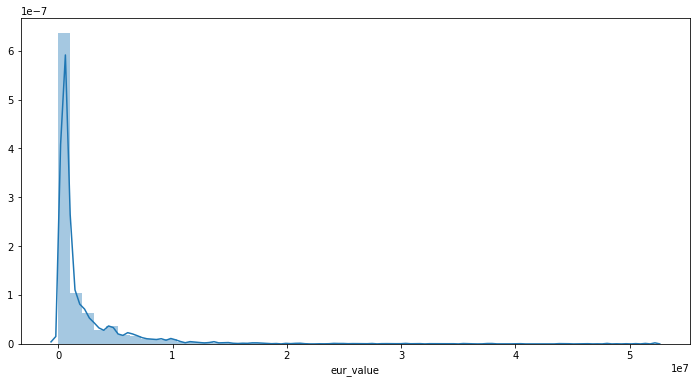

In [153]:
#Plot out Value
plt.figure(figsize=(12, 6))
sns.distplot(df_def['eur_value'])

Right skew on Value. Log required.

In [154]:
#drop zero & null values
df_def = df_def[df_def['eur_value'].notnull() & (df_def['eur_value'] != 0)]

#Log transform Y output values
df_def['eur_value_log'] = np.log(df_def['eur_value'])
df_def.head()

,eur_value,overall,height_cm,weight_kg,age,pac,sho,pas,dri,def,...,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,prefer_foot,eur_value_log
10,52000000,90,183,75,31,76,63,71,71,88,...,88,52,63,68,80,86,89,91,1,17.766754
17,38000000,89,187,85,32,74,46,56,59,90,...,88,28,50,50,82,92,92,90,0,17.453097
24,44000000,88,190,85,30,68,54,70,70,87,...,90,38,74,70,84,84,88,88,1,17.599700
25,48000000,88,192,90,28,75,50,72,67,88,...,83,47,76,46,86,88,91,90,1,17.686712
26,40000000,88,186,78,31,67,48,65,63,88,...,88,48,52,50,82,87,86,89,1,17.504390


/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


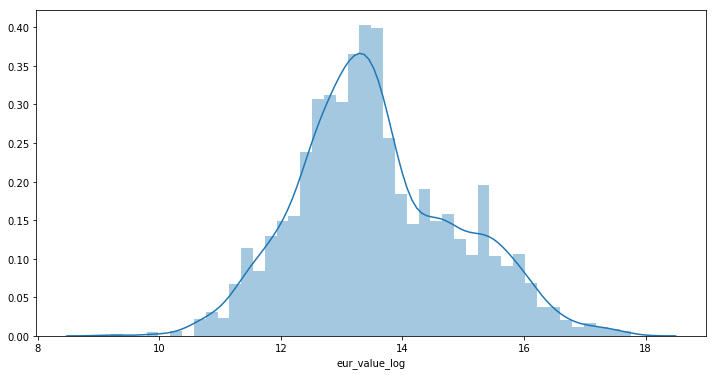

In [155]:
#Plot the log distribution of market value
plt.figure(figsize=(12, 6))
sns.distplot(df_def['eur_value_log'])

Slightly bimodal, but not as dramatic as midfielders. Defenders generally don't have as varied roles as midfielders, so this makes sense - good (i.e. valuable) defenders are generally good at the same thing.

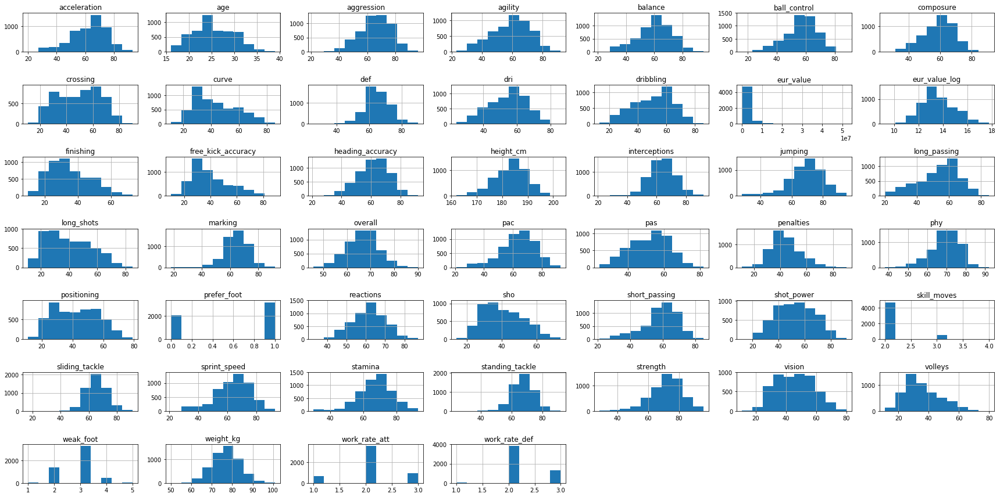

In [156]:
#Let's look at the distributions of each variable
hist = df_def.hist(figsize = (24,12))
plt.tight_layout()

Defenders look like they're awful at free kicks. Not a surprise.
Physically, defenders are taller and stronger than both midfielders and forwards. They're also slower.

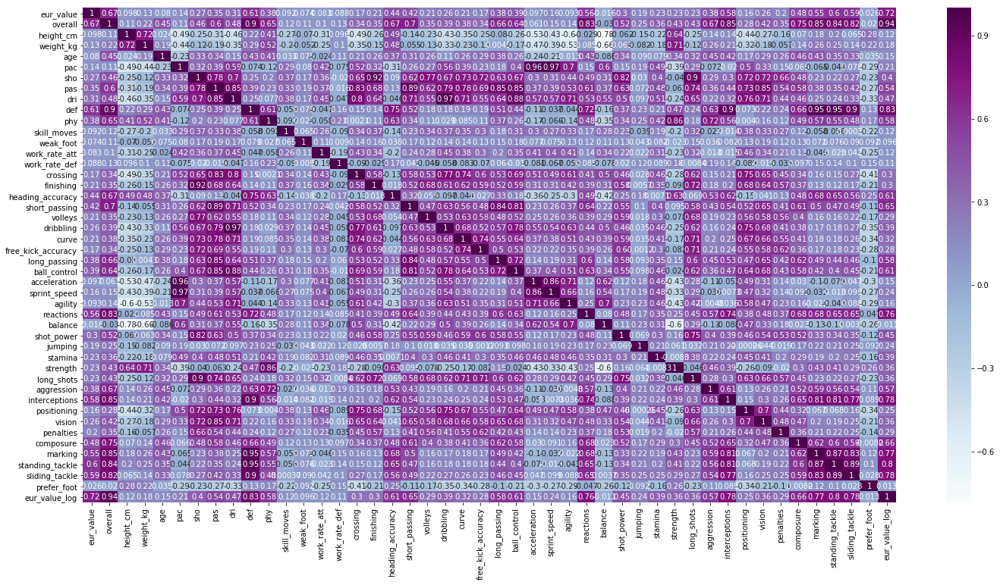

In [157]:
#Look at heatmap of correlations
df_def_heat = df_def.corr()
plt.figure(figsize=(24, 12))
sns.heatmap(df_def_heat, annot = True, cmap = 'BuPu')

Note the same problem of the 'tackles' all being strongly correlated, as well as 'parents' stats being correlated with their child stats. For now, sliding tackle will be dropped, while other variables will be kept, as:
1. Marking is a critical stat - marking a player perfectly means you don't ever have to tackle them
2. Sliding tackles aren't done that often, and this stat is more likely to be inaccurate. 

Also note high correlation between short and long passing - will drop the long passing as the vast majority of defenders aren't good long passers (and aren't required to do so).

In [158]:
#drop above columns
df_def1 = df_def.drop(columns = ['weight_kg', 'eur_value','pac', 'acceleration', 'long_passing','sho', 'overall','pas', 'dri', 'def', 'phy', 'sliding_tackle'])

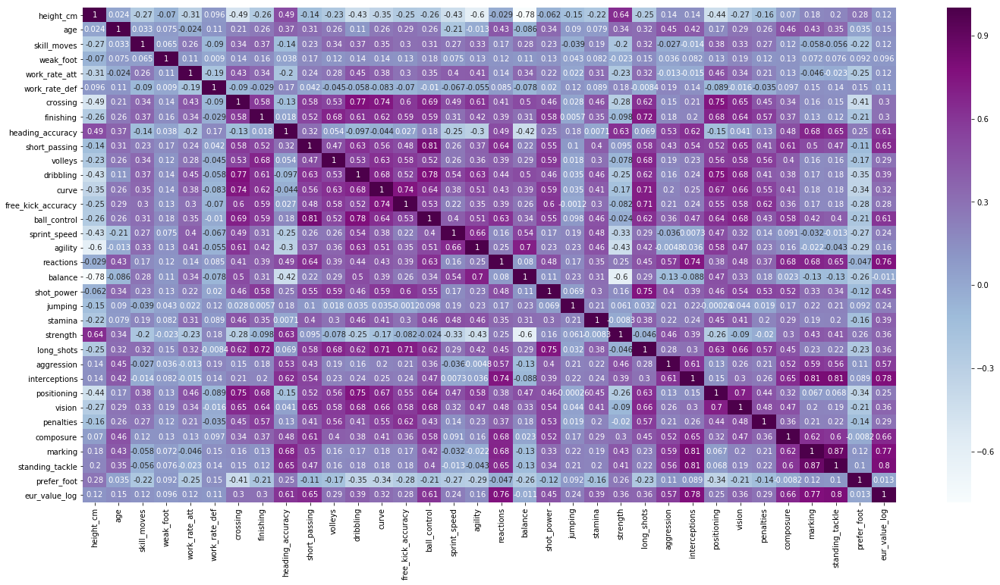

In [159]:
#Plot out correlations
df_def_heat = df_def1.corr()
plt.figure(figsize=(24, 12))
sns.heatmap(df_def_heat, annot = True, cmap = 'BuPu')

Less strong collinearity, though some strong relationships between the tackling and marking stats as previously mentioned. 

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<Figure size 864x432 with 0 Axes>

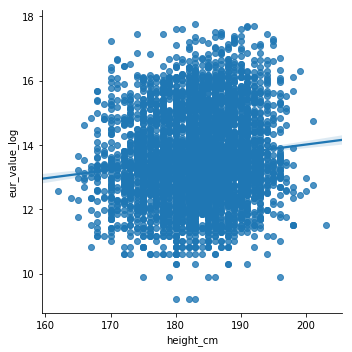

<Figure size 864x432 with 0 Axes>

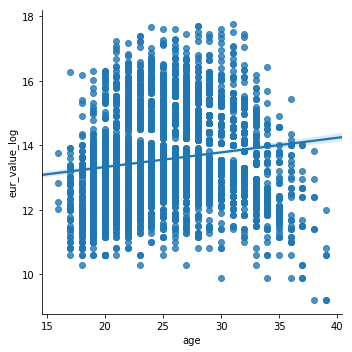

<Figure size 864x432 with 0 Axes>

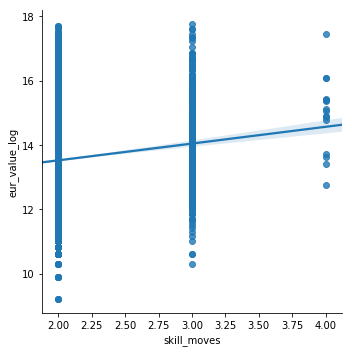

<Figure size 864x432 with 0 Axes>

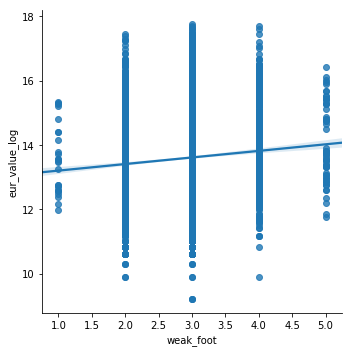

<Figure size 864x432 with 0 Axes>

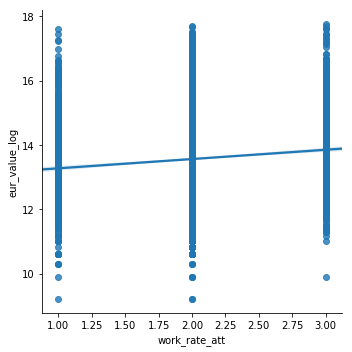

<Figure size 864x432 with 0 Axes>

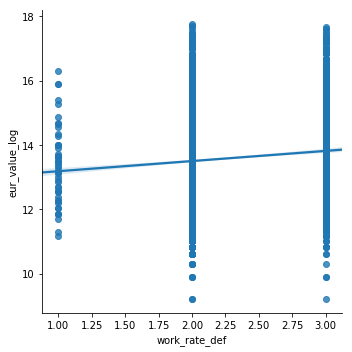

<Figure size 864x432 with 0 Axes>

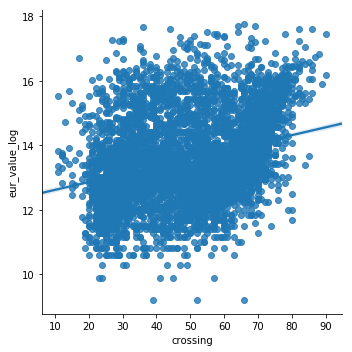

<Figure size 864x432 with 0 Axes>

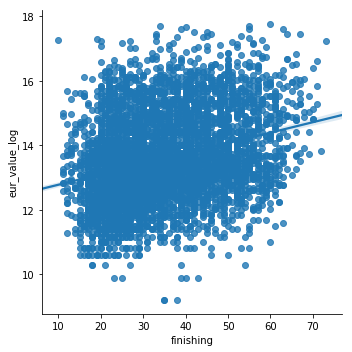

<Figure size 864x432 with 0 Axes>

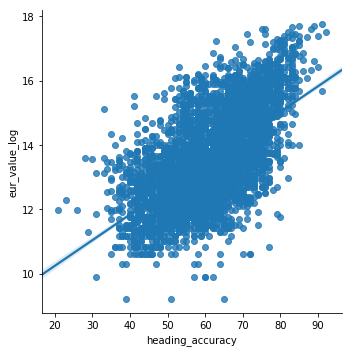

<Figure size 864x432 with 0 Axes>

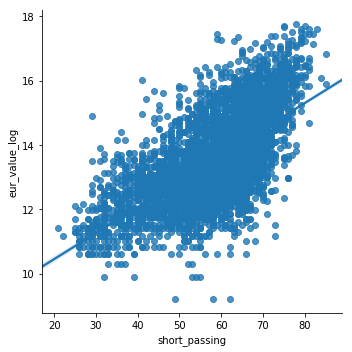

<Figure size 864x432 with 0 Axes>

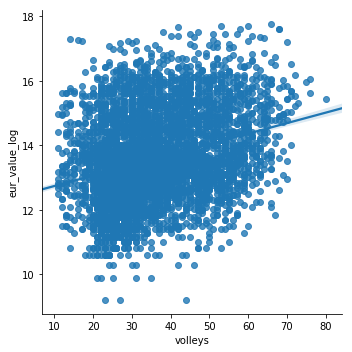

<Figure size 864x432 with 0 Axes>

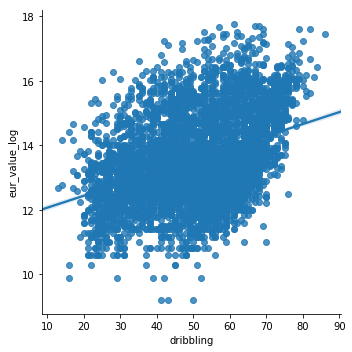

<Figure size 864x432 with 0 Axes>

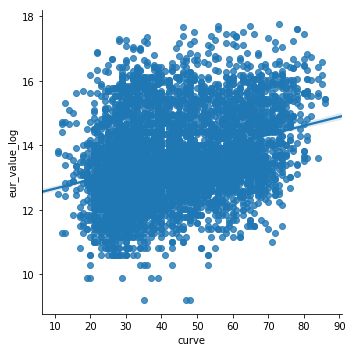

<Figure size 864x432 with 0 Axes>

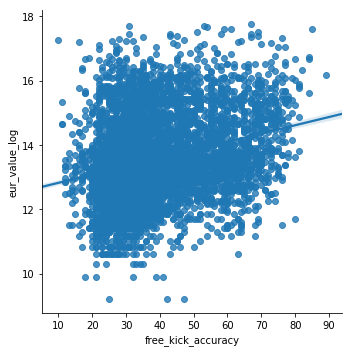

<Figure size 864x432 with 0 Axes>

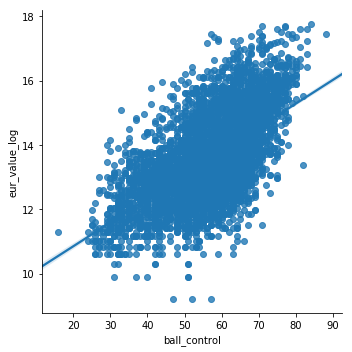

<Figure size 864x432 with 0 Axes>

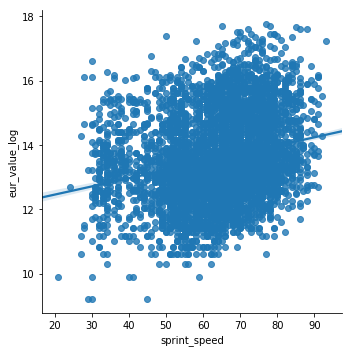

<Figure size 864x432 with 0 Axes>

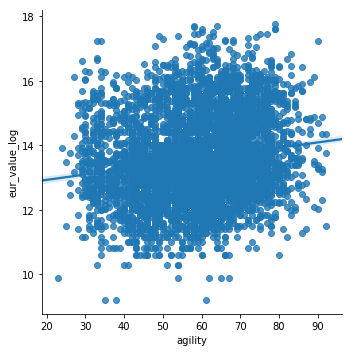

<Figure size 864x432 with 0 Axes>

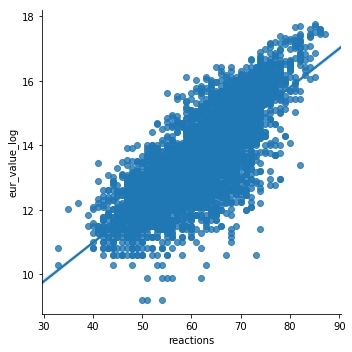

<Figure size 864x432 with 0 Axes>

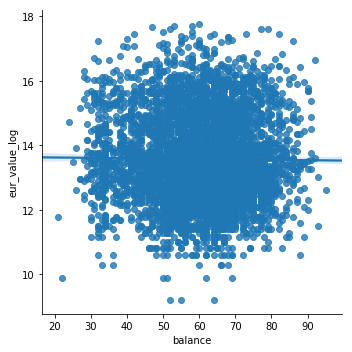

<Figure size 864x432 with 0 Axes>

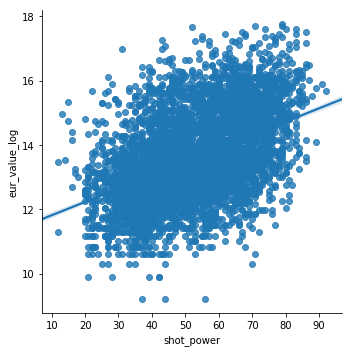

<Figure size 864x432 with 0 Axes>

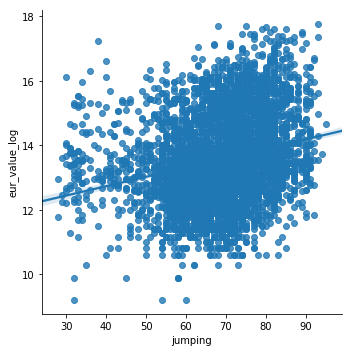

<Figure size 864x432 with 0 Axes>

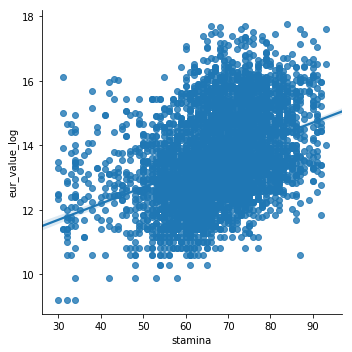

<Figure size 864x432 with 0 Axes>

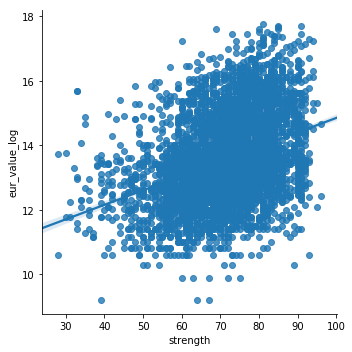

<Figure size 864x432 with 0 Axes>

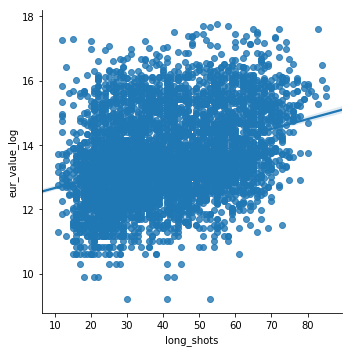

<Figure size 864x432 with 0 Axes>

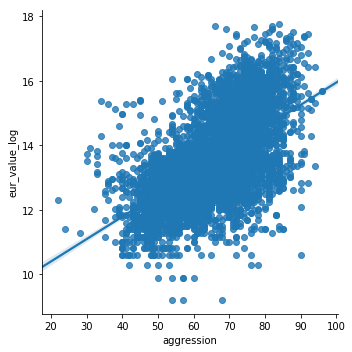

<Figure size 864x432 with 0 Axes>

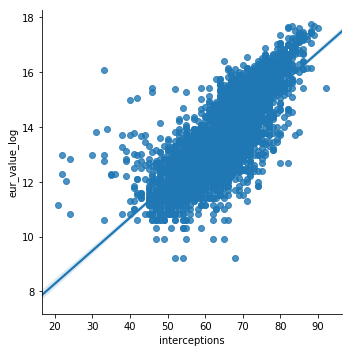

<Figure size 864x432 with 0 Axes>

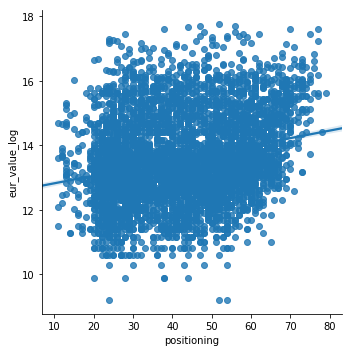

<Figure size 864x432 with 0 Axes>

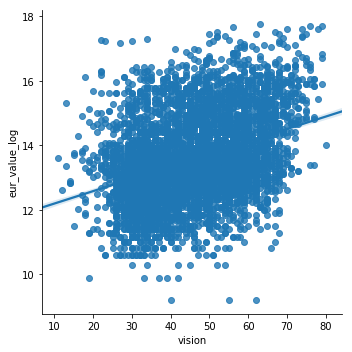

<Figure size 864x432 with 0 Axes>

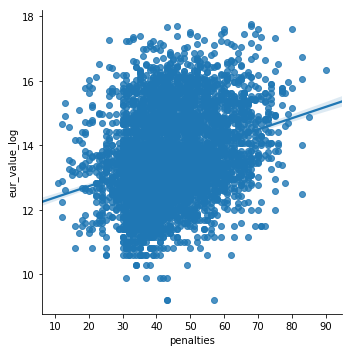

<Figure size 864x432 with 0 Axes>

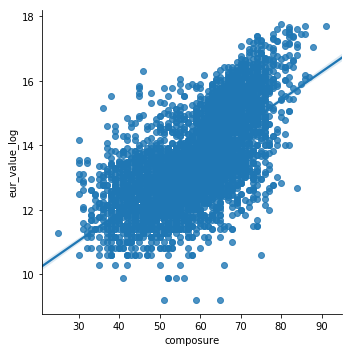

<Figure size 864x432 with 0 Axes>

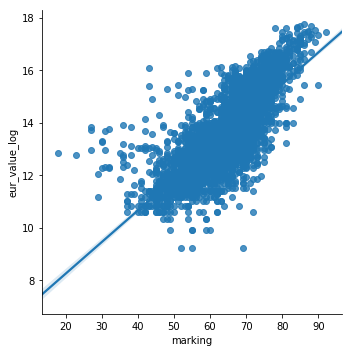

<Figure size 864x432 with 0 Axes>

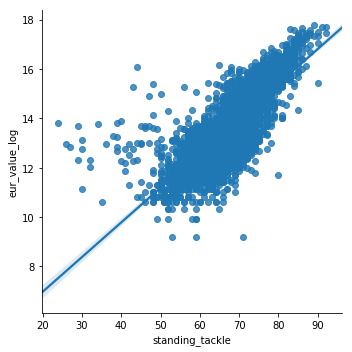

<Figure size 864x432 with 0 Axes>

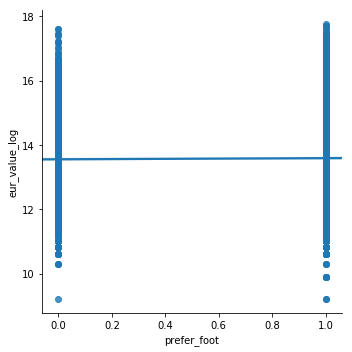

<Figure size 864x432 with 0 Axes>

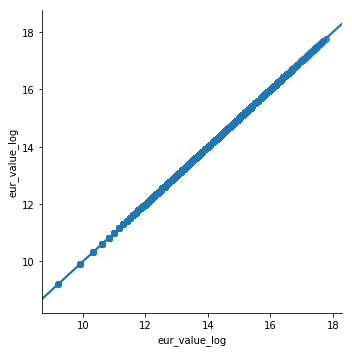

In [160]:
#Plot each variable against log of Eur value.
for col in df_def1:
    plt.figure(figsize=(12, 6))
    sns.lmplot(x = col, y='eur_value_log', data=df_def1)

Interesting that there isn't a clear relationship between height and value. Taller defenders could be much more common across all levels of skill, as well as the fact that fullbacks (who are much more dynamic players) don't necessarily have to be tall to be good. 

Passing stats appear to be much more linearly related with value - good passing defenders are very valuable as they can step out and function as additional midfielders, setting up the attack. 

Being good at free kicks isn't valued highly as a defender.

## Model Fit - Defenders

### Linear Regression

In [162]:
#set up our variables
X = df_def1[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def', 'interceptions',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'marking',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_def1['eur_value_log']

In [163]:
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [164]:
#create model
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [165]:
#See the Outputs
coefficients = pd.DataFrame(lm.coef_, X.columns, columns = ['Base OLS Coefficients'])
#insert intercept
coefficients.loc[len(coefficients)] = lm.intercept_
coefficients

,Base OLS Coefficients
height_cm,-0.002650
age,-0.093271
skill_moves,0.209747
weak_foot,-0.009236
work_rate_att,0.035802
work_rate_def,-0.025323
interceptions,0.023828
crossing,-0.002591
finishing,0.005287
heading_accuracy,0.019228


Text(0.5,1,'Actual v Predicted Value of Eur_Value_Log')

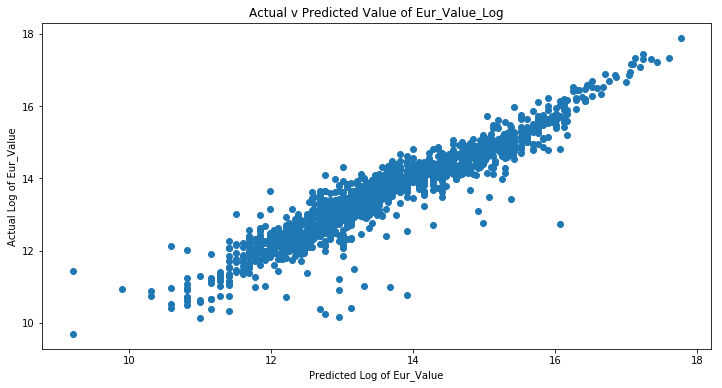

In [166]:
predictions = lm.predict(X_test)
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predictions)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('Actual v Predicted Value of Eur_Value_Log')

Linear model looks like a good fit for the data. Errors seem to be distributed randomly.

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


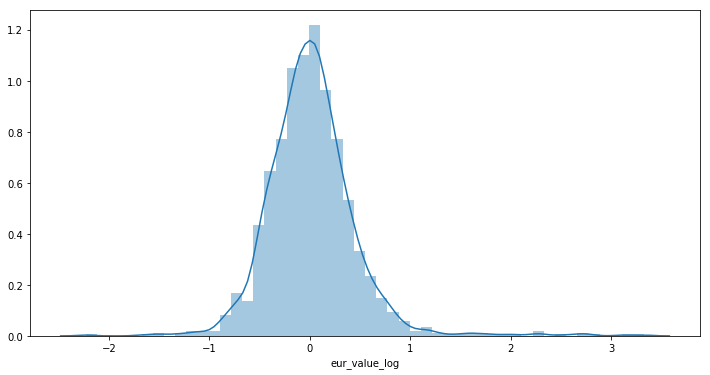

In [167]:
#Plot Errors
plt.figure(figsize=(12, 6))
sns.distplot(y_test-predictions)

Errors are normally distributed around zero.

In [168]:
#Evaluate error
mae = metrics.mean_absolute_error(y_test, predictions)
mse = metrics.mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))

MAE is: 0.3080279444355844
MSE is: 0.1973671545801757
RMSE is: 0.4442602329493106


K-Fold cross-validation to verify our MSE. 

In [169]:
#Implement the KFold Validation
cv_list = []
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = LinearRegression(), X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')
cv_ols = {'OLS MSE' : results.mean()*-1}
cv_list.append(cv_ols)
print('Average OLS MSE after 10-Fold Cross-Validation is', results.mean()*-1)

Average OLS MSE after 10-Fold Cross-Validation is 0.18564892399996355


In [170]:
#What's our R2 value?
print ('R2 Score:', lm.score(X_test, y_test))

R2 Score: 0.8811301421440062


In [171]:
#Calculate an AIC value for comparison
predict_val = lm.predict(X_test)
residuals = (y_test-predict_val)
sse = sum(residuals**2)
k = 34
AIC_ols = (2*k) - (2*np.log(sse))
print('AIC value is: ', AIC_ols)

AIC value is:  56.540496911509805


For defenders, the base OLS Linear Regression appears to perform worse than the equivalent model for both midfielders and forwards (comparing 10-Fold CV MSE).

The R2 score looks relatively high, like with the Midfielders and Forwards. Again, we'll use Ridge & Lasso Regression to penalise an increase in features by reducing their impact on the end model.

### Ridge Regression

The hyperparameter, α lets us control how much we penalize the coefficients, with higher values of α creating simpler models. It effectively shrinks the coefficients if there is a high degree of multicollinearity?

In [172]:
#set up an array with range of alphas to iterate through
alphas = 10**np.linspace(10,-2,100)*0.5

In [173]:
#set up all variables
X = df_def1[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def', 'interceptions',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'marking',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_def1['eur_value_log']

In [174]:
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [175]:
#Use cross-validation to determine optimum level of alpha versus MSE. Normalise Data!
ridgecv = RidgeCV(alphas = alphas, scoring = 'neg_mean_squared_error', normalize = True)
ridgecv.fit(X_train, y_train)
alpha_opt = ridgecv.alpha_
print('Optimum Alpha to minimise MSE is: ', alpha_opt)

Optimum Alpha to minimise MSE is:  0.008737642000038414


In [176]:
#Model Fit & Evaluation Using Optimum Alpha
ridge = Ridge(alpha = alpha_opt, normalize = True)
ridge.fit(X_train, y_train)
mse_opt = mean_squared_error(y_test, ridge.predict(X_test))
print('MSE at Alpha {} is {}'.format(alpha_opt, mse_opt))

MSE at Alpha 0.008737642000038414 is 0.18929394811421255


In [177]:
#Run 10-Fold Cross-Validation
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = ridge, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')
#save errors to variables, append to list of CV MSE errors
cv_ridge = {'Ridge MSE': results.mean()*-1}
cv_list.append(cv_ridge)
print('Average Ridge Regression MSE after 10-Fold Cross-Validation is', results.mean()*-1)

Average Ridge Regression MSE after 10-Fold Cross-Validation is 0.18819484640186693


In [178]:
#Calculate an AIC value for comparison
predict_val = ridge.predict(X_test)
residuals = (y_test-predict_val)
sse = sum(residuals**2)
k = 34
AIC_ridge = (2*k) - (2*np.log(sse))
print('AIC value for Ridge Regression is: ', AIC_ridge)

AIC value for Ridge Regression is:  56.624026181696614


In [179]:
#let's compare shrinkage of coefficients with OLS
coefficients_ridge = pd.DataFrame(ridge.coef_, X.columns, columns = ['Ridge Coefficients'])
#insert intercept
coefficients_ridge.loc[len(coefficients_ridge)] = ridge.intercept_
coefficient_table = coefficients.join(coefficients_ridge)
coefficient_table

,Base OLS Coefficients,Ridge Coefficients
height_cm,-0.002650,-0.002777
age,-0.093271,-0.092241
skill_moves,0.209747,0.240869
weak_foot,-0.009236,-0.020885
work_rate_att,0.035802,0.035958
work_rate_def,-0.025323,-0.013023
interceptions,0.023828,0.025056
crossing,-0.002591,-0.002324
finishing,0.005287,0.004952
heading_accuracy,0.019228,0.017965


In [180]:
#show the difference in MSE between OLS and Ridge
cv_list

[{'OLS MSE': 0.18564892399996355}, {'Ridge MSE': 0.18819484640186693}]

For Defenders, Ridge Regression provided no meaningful improvement in the 10-Fold Cross-Validated MSE compared with the base 10-Fold Cross-Validated OLS regression.

### Lasso Regression

In [181]:
#set up the lasso cross validation process
lasso = Lasso(max_iter = 10000, normalize = True)
lassocv = LassoCV(alphas = None, cv = 10, max_iter = 100000, normalize = True)
lassocv.fit(X_train, y_train)
alpha_opt = lassocv.alpha_
print('Optimum Alpha to minimise Lasso MSE is: ', alpha_opt)

Optimum Alpha to minimise Lasso MSE is:  1.7500291854374847e-05


In [182]:
#Model Fit & Evaluation
lasso.set_params(alpha=lassocv.alpha_)
lasso.fit(X_train, y_train)
mean_squared_error(y_test, lasso.predict(X_test))
mse_opt = mean_squared_error(y_test, lasso.predict(X_test))
print('MSE at Alpha {} is {}'.format(alpha_opt, mse_opt))

MSE at Alpha 1.7500291854374847e-05 is 0.1893980735743407


In [183]:
#Run 10-Fold Cross-Validation
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = lasso, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

#save errors to variables, append to list of CV MSE errors
cv_lasso = {'Lasso MSE': results.mean()*-1}
cv_list.append(cv_lasso)
print('Average Lasso MSE after 10-Fold Cross-Validation is', results.mean()*-1)

Average Lasso MSE after 10-Fold Cross-Validation is 0.18824284029970112


<b> AIC: </b> Can AIC for Lasso be calculated given reduction of coefficients to zero? Literature is unclear.

In [184]:
#let's compare oefficients with other models
coefficients_lasso = pd.DataFrame(lasso.coef_, X.columns, columns = ['Lasso Coefficients'])
#insert intercept
coefficients_lasso.loc[len(coefficients_lasso)] = lasso.intercept_
coefficient_table.join(coefficients_lasso)

,Base OLS Coefficients,Ridge Coefficients,Lasso Coefficients
height_cm,-0.002650,-0.002777,-0.002235
age,-0.093271,-0.092241,-0.093162
skill_moves,0.209747,0.240869,0.239524
weak_foot,-0.009236,-0.020885,-0.019846
work_rate_att,0.035802,0.035958,0.033748
work_rate_def,-0.025323,-0.013023,-0.010527
interceptions,0.023828,0.025056,0.024994
crossing,-0.002591,-0.002324,-0.002119
finishing,0.005287,0.004952,0.004727
heading_accuracy,0.019228,0.017965,0.018053


In [185]:
#show the difference in MSE between OLS and Ridge
cv_list

[{'OLS MSE': 0.18564892399996355},
 {'Ridge MSE': 0.18819484640186693},
 {'Lasso MSE': 0.18824284029970112}]

Lasso Regression performed similarly on 10-Fold Cross Validated MSE when compared with Ridge Regression. No coefficients were reduced to zero.

Ridge and Lasso Regressions performed slightly worse on 10-Fold Cross-Validation MSE than the base OLS Linear Regression.

### Recursive Feature Elimination (RFE)

As an alternative, RFE and Cross-Validation can be used as an automated way to to cut down features.

In [186]:
#set up our variables
X = df_def1[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def', 'interceptions',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'marking',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_def1['eur_value_log']

RFE CV can suggest which variables are most important using cross-validation processes.

In [187]:
#Set Up Dataframe of All Features
df_new = pd.DataFrame(data = df_def1.columns, columns = ['attributes'])

#define model to use
linreg = LinearRegression()

#Set UP RFECV, using MSE as primary measurement metric and 5 folds
rfecv = RFECV(estimator=linreg, step=1, cv=KFold(5), scoring='neg_mean_squared_error')

#Fit RFECV to Model
rfecv.fit(X, y)

RFECV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
   estimator=LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False),
   n_jobs=1, scoring='neg_mean_squared_error', step=1, verbose=0)

In [188]:
#Where MSE is minimised, how many features are in the model?
rfecv.n_features_

29

In [189]:
#Create df of RFE Booleans
support = pd.DataFrame(data = rfecv.support_, columns = ['importance_flg'])

#Concat the columngs together
classifier = pd.concat([support, df_new], axis=1)

#Drop the last row, as this is our target variable
a = classifier.drop(len(classifier)-1)
b = a.loc[a['importance_flg'] == True]

#Convert to list, show us which attributes are important
c = list(b['attributes'])
c

['height_cm',
 'age',
 'skill_moves',
 'weak_foot',
 'work_rate_att',
 'work_rate_def',
 'crossing',
 'finishing',
 'heading_accuracy',
 'short_passing',
 'volleys',
 'free_kick_accuracy',
 'sprint_speed',
 'agility',
 'reactions',
 'balance',
 'shot_power',
 'jumping',
 'stamina',
 'strength',
 'long_shots',
 'aggression',
 'interceptions',
 'positioning',
 'vision',
 'penalties',
 'marking',
 'standing_tackle',
 'prefer_foot']

According to RFECV, 4 of the originally input variables were dropped:
1. Composure - Usually a trait required in forwards when finishing goals. Given defenders score a lot fewer goals, it's not as important for them. 
2. Dribbling - Defenders aren't usually required to bring the ball out and take on opposition players with dribbling. Not important. 
3. Ball Control. Similar to above - the vast majority of defenders aren't required to carry the ball upfield. 
4. Curve - Defenders don't take that many free kicks. 

In [190]:
#Set Up model to read target and predictor variables
X = df_def1[c]
y = df_def1['eur_value_log']

#Train Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#Set Up & Fit Model
lm = LinearRegression()
lm.fit(X_train, y_train)

#pull predictions
predictions = lm.predict(X_test)


#Run 10-Fold Cross-Validation
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = LinearRegression(), X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

#save errors to variables, append to list of CV MSE errors
cv_rfe= {'RFE OLS MSE': results.mean()*-1}
cv_list.append(cv_rfe)

In [191]:
cv_list

[{'OLS MSE': 0.18564892399996355},
 {'Ridge MSE': 0.18819484640186693},
 {'Lasso MSE': 0.18824284029970112},
 {'RFE OLS MSE': 0.20101238795353912}]

In [192]:
#What's our R2 value?
print ('R2 Score:', lm.score(X_test, y_test))

R2 Score: 0.8946307387735859


In [193]:
#Calculate an AIC value for comparison
predict_val = lm.predict(X_test)
residuals = (y_test-predict_val)
sse = sum(residuals**2)
k = 29
AIC = (2*k) - (2*np.log(sse))
print('AIC value is: ', AIC)

AIC value is:  46.645464129286935


Using RFE CV, there is a an increase in 10-Fold CV MSE when compared with the base OLS. Note that the AIC value is also less than the base OLS models.

Like with midfielders, it would appear that <u>Lasso Regression</u> is the preferred option from the Linear Regressions, as it has the fewest number of features, but the lowest MSE.

### Random Forest Regression

While normally used as a tool for classification problems, we can also use Random Forests for Regression.

In [196]:
#Set up Training & Test Data
X = df_def1[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def', 'interceptions',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'marking',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_def1['eur_value_log']

In [197]:
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [198]:
#Set up Model & Fit model to test data
RGR = RandomForestRegressor(n_jobs=-1)
RGR.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

Text(0.5,1,'Actual v Predicted Value of Eur_Value_Log')

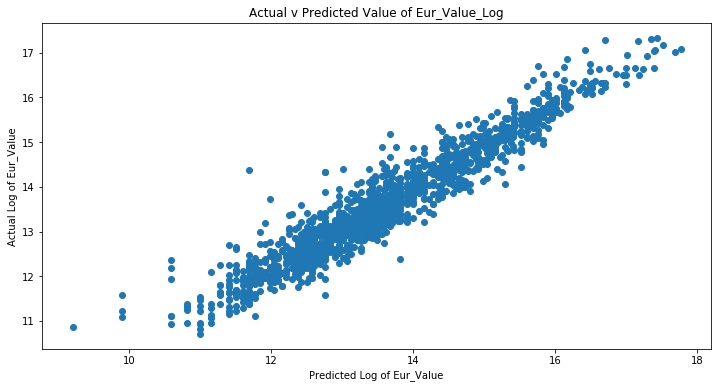

In [199]:
#plot graph
predictions = RGR.predict(X_test)
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predictions)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('Actual v Predicted Value of Eur_Value_Log')

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


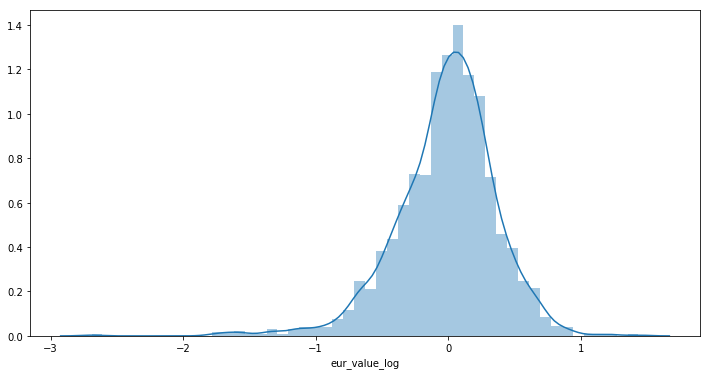

In [200]:
#Plot Errors
plt.figure(figsize=(12, 6))
sns.distplot(y_test-predictions)

In [201]:
#Run 10-Fold Cross-Validation on New Model - Evaluate Error
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = RGR, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predictions)
mse = metrics.mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('R2 Score is: ' + str(RGR.score(X_test, y_test)))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.28011044297070226
MSE is: 0.14452180198377965
RMSE is: 0.3801602319861714
R2 Score is: 0.9159109783406831
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.13791229587145606


In respect of MSE, Random Forest Regression appears to have improved on the Lasso Regression model. We can continue to improve the MSE via optimising the hyperparameters.

### Random Forest Regression Optimisation

The key parameters we can optimise are:
1. n_estimators - the number of trees in the forest. This will generally be more accurate the higher you go.
2. max_features - The number of features to consider when looking for the best split. Documentation indicates that the default value is the total number of features in the data. This seems too high. <i> The Elements of Statistical Learning: 2nd Edition </i> (Hastie et. al. 2009, p. 592) indicates that it should be around <b>n/3</b> features, where n is the total number of features in the data. 
3. min_samples_leaf - The minimum number of samples required to be at a leaf node (default = 1)

In [202]:
#Set up Parameters
#Execute Grid Search - Warning - will take approx. 9 mins. 
param_grid = {'n_estimators': np.arange(7,21), 'max_features': np.arange(7,16),'min_samples_leaf':[1,2,3,4]}
Grid = GridSearchCV(RGR, param_grid, verbose = 2)
Grid.fit(X_train, y_train)

Fitting 3 folds for each of 504 candidates, totalling 1512 fits
[CV] max_features=7, min_samples_leaf=1, n_estimators=7 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=7 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=7 ..............


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=7 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=7 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=7 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=8 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=8 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=8 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=8 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=8 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=8 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=9 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=9 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=9 ..............
[CV] .

[CV] .... max_features=7, min_samples_leaf=2, n_estimators=12 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=13 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=13 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=13 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=13 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=13 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=13 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=14 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=14 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=14 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=15 .............
[CV] .

[CV] .... max_features=7, min_samples_leaf=3, n_estimators=18 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=18 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=18 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=18 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=18 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=19 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=19 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=19 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=19 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=19 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=19 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=20 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=20 .............
[CV] .

[CV] ..... max_features=8, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=9 ..............
[CV] ..... max_features=8, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=10 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=10 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=10 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=10 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=10 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=10 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=11 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=11 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=11 .............
[CV] .

[CV] .... max_features=8, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=15 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=15 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=15 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=15 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=15 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=15 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=16 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=16 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=16 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=17 .............
[CV] .

[CV] .... max_features=8, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=8, min_samples_leaf=3, n_estimators=20 .............
[CV] .... max_features=8, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=8, min_samples_leaf=3, n_estimators=20 .............
[CV] .... max_features=8, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=7 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=7 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=7 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=7 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=7 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=7 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=8 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=8 ..............
[CV] .

[CV] .... max_features=9, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=11 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=12 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=12 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=12 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=12 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=12 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=12 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=13 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=13 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=13 .............
[CV] .

[CV] .... max_features=9, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=17 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=17 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=17 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=17 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=17 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=17 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=18 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=18 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=18 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=19 .............
[CV] .

[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=8 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=8 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=9 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=9 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=9 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=9 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=9 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=9 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=10 .............
[CV] .... max_features=9, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=10 .............
[CV] .

[CV] ... max_features=10, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=13 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=14 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=14 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=14 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=14 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=14 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=14 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=15 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=15 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=15 ............
[CV] .

[CV] ... max_features=10, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=19 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=19 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=19 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=19 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=19 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=19 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=20 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=20 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=20 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=10, min_samples_leaf=3, n_estimators=7 .............
[CV] .

[CV] ... max_features=10, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=10 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=10 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=11 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=11 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=11 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=11 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=11 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=11 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=12 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=12 ............
[CV] .

[CV] ... max_features=11, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=15 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=16 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=16 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=16 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=16 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=16 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=16 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=17 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=17 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=17 ............
[CV] .

[CV] ... max_features=11, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=7 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=7 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=7 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=7 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=7 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=7 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=8 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=8 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=8 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=9 .............
[CV] .

[CV] ... max_features=11, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=12 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=12 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=13 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=13 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=13 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=13 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=13 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=13 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=14 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=14 ............
[CV] .

[CV] ... max_features=12, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=17 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=18 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=18 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=18 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=18 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=18 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=18 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=19 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=19 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=19 ............
[CV] .

[CV] .... max_features=12, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=9 .............
[CV] .... max_features=12, min_samples_leaf=3, n_estimators=9 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=9 .............
[CV] .... max_features=12, min_samples_leaf=3, n_estimators=9 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=9 .............
[CV] .... max_features=12, min_samples_leaf=3, n_estimators=9 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=10 ............
[CV] ... max_features=12, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=10 ............
[CV] ... max_features=12, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=10 ............
[CV] ... max_features=12, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=11 ............
[CV] .

[CV] ... max_features=12, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=14 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=14 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=15 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=15 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=15 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=15 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=15 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=15 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=16 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=16 ............
[CV] .

[CV] ... max_features=13, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=19 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=20 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=20 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=20 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=20 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=20 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=20 -   0.2s
[CV] max_features=13, min_samples_leaf=2, n_estimators=7 .............
[CV] .... max_features=13, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=13, min_samples_leaf=2, n_estimators=7 .............
[CV] .... max_features=13, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=13, min_samples_leaf=2, n_estimators=7 .............
[CV] .

[CV] ... max_features=13, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=11 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=11 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=11 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=11 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=11 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=11 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=12 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=12 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=12 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=13 ............
[CV] .

[CV] ... max_features=13, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=16 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=16 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=17 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=17 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=17 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=17 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=17 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=17 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=18 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=18 ............
[CV] .

[CV] .... max_features=14, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=7 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=8 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=8 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=8 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=8 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=8 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=8 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=9 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=9 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=9 .............
[CV] .

[CV] ... max_features=14, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=13 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=13 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=13 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=13 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=13 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=13 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=14 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=14 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=14 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=15 ............
[CV] .

[CV] ... max_features=14, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=18 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=18 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=19 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=19 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=19 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=19 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=19 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=19 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=20 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=20 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=20 ............
[CV] .

[CV] .... max_features=15, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=9 .............
[CV] .... max_features=15, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=10 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=10 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=10 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=10 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=10 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=10 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=11 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=11 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=11 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=11 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=11 ............
[CV] .

[CV] ... max_features=15, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=15 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=15 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=15 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=15 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=15 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=15 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=16 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=16 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=16 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=16 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=16 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=16 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=17 ............
[CV] .

[CV] ... max_features=15, min_samples_leaf=4, n_estimators=20 -   0.2s
[CV] max_features=15, min_samples_leaf=4, n_estimators=20 ............
[CV] ... max_features=15, min_samples_leaf=4, n_estimators=20 -   0.2s
[CV] max_features=15, min_samples_leaf=4, n_estimators=20 ............
[CV] ... max_features=15, min_samples_leaf=4, n_estimators=20 -   0.2s


[Parallel(n_jobs=1)]: Done 1512 out of 1512 | elapsed:  5.6min finished


GridSearchCV(cv=None, error_score='raise',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'n_estimators': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]), 'max_features': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15]), 'min_samples_leaf': [1, 2, 3, 4]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=2)

In [203]:
#Pull out optimum parameters
Grid.best_params_

{'max_features': 15, 'min_samples_leaf': 2, 'n_estimators': 20}

The Grid Search has identified the above values to be the optimum values. These values will be used in a new Random Forest Regression to see the impact on MSE. 

In [204]:
#Rebuild Model using Optimum Parameters
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#Fit Model
RGR_new = RandomForestRegressor(n_estimators = 20, max_features = 15, min_samples_leaf = 2)
RGR_new.fit(X_train, y_train)
prediction = RGR_new.predict(X_test)

In [205]:
#Run 10-Fold Cross-Validation on New Model
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = RGR_new, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, prediction)
mse = metrics.mean_squared_error(y_test, prediction)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('R2 Score is: ' + str(RGR_new.score(X_test, y_test)))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.26886923569909454
MSE is: 0.12528194209666738
RMSE is: 0.3539518923479113
R2 Score is: 0.9282543645960106
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.13581410358234708


The tuning of hyperparameters did appear to have a positive impact on MSE. 

In [206]:
#Key Features
importances = RGR_new.feature_importances_
indices = np.argsort(importances)
features = X.columns

Text(0.5,0,'Relative Importance')

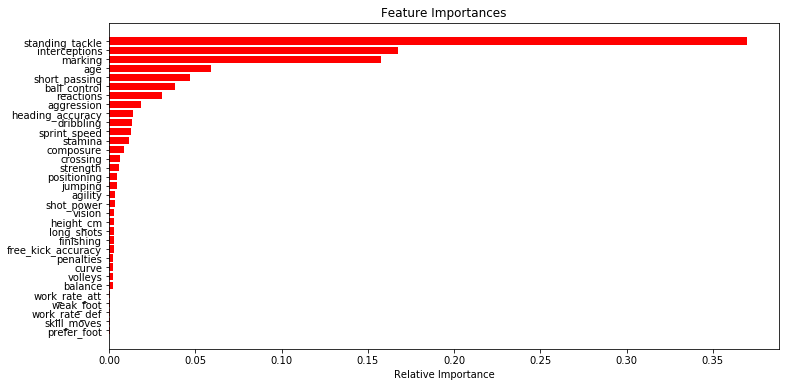

In [207]:
plt.figure(figsize = (12,6))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='r', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')

From an intuitive point, the factors identified by the Random Forest Regression make the most sense - defenders require strong standing tackle, interceptions and marking ability to do their job. Strangely, skill moves were identified as an incredibly key factor in the Regression models, which don't really make sense.

### Support Vector Regression

Another predictive technique that could be used is support vector regression. This another regression technique that can pull the data into higher dimensions to create a closer line of fit, at the cost of explanation (i.e. I would not be able to explain exactly what 'features' the model is using).

In [208]:
#Set up Data
X = df_def1[['height_cm', 'age', 'skill_moves',
       'weak_foot', 'work_rate_att', 'work_rate_def', 'interceptions',
       'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
       'dribbling', 'curve', 'free_kick_accuracy', 'marking',
       'ball_control', 'sprint_speed', 'agility', 'reactions',
       'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
       'aggression', 'positioning', 'vision', 'penalties',
       'composure', 'standing_tackle', 'prefer_foot']]
y = df_def1['eur_value_log']

In [209]:
#Requires Scaling of Data
scalar = StandardScaler()
scalar.fit(X)
scaled_features = scalar.transform(X)
df_scaled = pd.DataFrame(data = scaled_features, columns = X.columns)

In [210]:
#Set up Scaled Data
X = df_scaled
y = df_def1['eur_value_log']

#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [211]:
#Instantiate a few models, evaluate best fit - start with the radial basis function
svr_rbf = SVR(kernel = 'rbf')
svr_rbf.fit(X_train, y_train)
predict_val_rbf = svr_rbf.predict(X_test)

#Try the linear model
svr_lin = SVR(kernel = 'linear')
svr_lin.fit(X_train, y_train)
predict_val_lin = svr_lin.predict(X_test)

#Try the polynomial model
svr_poly = SVR(kernel = 'poly')
svr_poly.fit(X_train, y_train)
predict_val_poly = svr_poly.predict(X_test)

In [212]:
#Run 10-Fold Cross-Validation on RBF
svr_list = []
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_rbf, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_rbf)
mse = metrics.mean_squared_error(y_test, predict_val_rbf)
rmse = np.sqrt(mse)

rbf = {'RBF SVR MSE' : results.mean()*-1}
svr_list.append(rbf)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.2241269963929219
MSE is: 0.09594999790640459
RMSE is: 0.3097579666552655
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.09169695498127663


Text(0.5,1,'SVR RBF Function - Actual v Predicted Value of Eur_Value_Log')

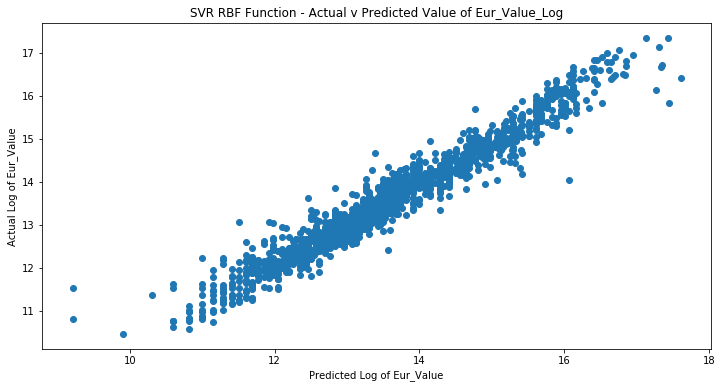

In [213]:
#Plot the functions as a comparison
#Plot the RBF function
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predict_val_rbf)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('SVR RBF Function - Actual v Predicted Value of Eur_Value_Log')

In [214]:
#linear SVR
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_lin, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_lin)
mse = metrics.mean_squared_error(y_test, predict_val_lin)
rmse = np.sqrt(mse)

lin = {'Linear SVR MSE' : results.mean()*-1}
svr_list.append(lin)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('Average MSE for Linear SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.29324258807641884
MSE is: 0.2034066283848647
RMSE is: 0.45100623985136246
Average MSE for Linear SVR after 10-Fold Cross-Validation is 0.2149361279108802


Text(0.5,1,'SVR Linear Function - Actual v Predicted Value of Eur_Value_Log')

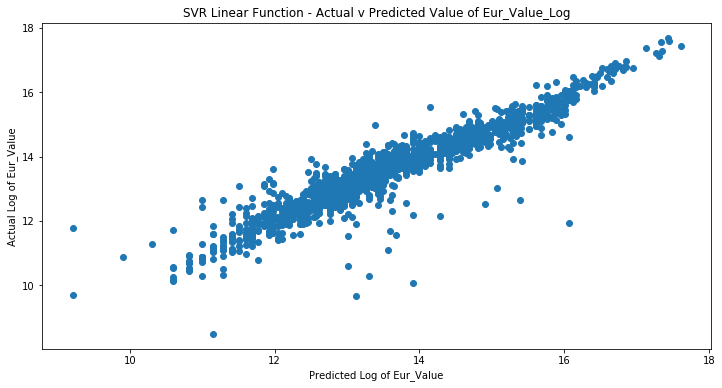

In [215]:
#linear
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predict_val_lin)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('SVR Linear Function - Actual v Predicted Value of Eur_Value_Log')

In [216]:
#Poly SVR
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_poly, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_poly)
mse = metrics.mean_squared_error(y_test, predict_val_poly)
rmse = np.sqrt(mse)

poly = {'Poly SVR MSE' : results.mean()*-1}
svr_list.append(poly)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('Average MSE for Poly SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.40167678696157133
MSE is: 0.3167666920615637
RMSE is: 0.562820301749647
Average MSE for Poly SVR after 10-Fold Cross-Validation is 0.33341367668132416


Text(0.5,1,'SVR Polynomial Function - Actual v Predicted Value of Eur_Value_Log')

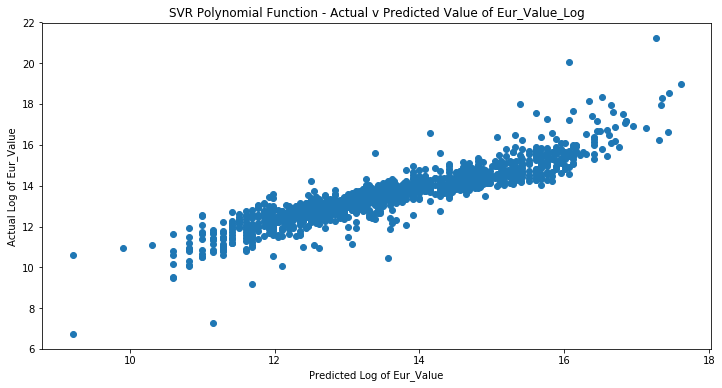

In [217]:
#Plot the Poly function
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predict_val_poly)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('SVR Polynomial Function - Actual v Predicted Value of Eur_Value_Log')

In [218]:
#Output list of MSE values
svr_list

[{'RBF SVR MSE': 0.09169695498127663},
 {'Linear SVR MSE': 0.2149361279108802},
 {'Poly SVR MSE': 0.33341367668132416}]

### SVR Optimisation

It appears the RBF function appears to have the closest set of predictions to actual target variables based on MSE. This kernel will be used going forward for optimisation. 

The parameters to be optimised are:
1. C (the error term) - Cost of misclassification on the training data. A higher C gives us lower bias(higher variance).  
2. γ (Kernel coefficient) - A lower Gamma means a Gaussian with a higher variance (lower bias). 
3. ϵ (epsilon) - how lenient the model is in classifying an error. 

We will do this via brute force optimisation (Grid Search CV).

In [219]:
#Set up Parameters

#Built in range doesn't support floats for epsilon values, set up custom function
def frange(start, stop, step):
    i = start
    while i < stop:
        yield i
        i += step

#generate lists
epsilon_params = []
c_params = []

for i in frange(0.0, 1.0, 0.1):
    epsilon_params.append(i)

for i in frange(0.1, 2.0, 0.2):
    c_params.append(i)

In [220]:
#Execute Grid Search - Warning - will take approx. 7 mins. 
param_grid = {'C': c_params, 'epsilon': epsilon_params,'gamma':[1,0.1,0.01,0.001]}
Grid = GridSearchCV(svr_rbf, param_grid, verbose = 2)
Grid.fit(X_train, y_train)

Fitting 3 folds for each of 440 candidates, totalling 1320 fits
[CV] C=0.1, epsilon=0.0, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.0, gamma=1 -   0.6s
[CV] C=0.1, epsilon=0.0, gamma=1 .....................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV] ............................ C=0.1, epsilon=0.0, gamma=1 -   0.5s
[CV] C=0.1, epsilon=0.0, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.0, gamma=1 -   0.5s
[CV] C=0.1, epsilon=0.0, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.0, gamma=0.1 -   0.4s
[CV] C=0.1, epsilon=0.0, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.0, gamma=0.1 -   0.4s
[CV] C=0.1, epsilon=0.0, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.0, gamma=0.1 -   0.4s
[CV] C=0.1, epsilon=0.0, gamma=0.01 ..................................
[CV] ......................... C=0.1, epsilon=0.0, gamma=0.01 -   0.5s
[CV] C=0.1, epsilon=0.0, gamma=0.01 ..................................
[CV] ......................... C=0.1, epsilon=0.0, gamma=0.01 -   0.4s
[CV] C=0.1, epsilon=0.0, gamma=0.01 ..................................
[CV] .

[CV] C=0.1, epsilon=0.5, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.5, gamma=1 -   0.4s
[CV] C=0.1, epsilon=0.5, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.5, gamma=1 -   0.4s
[CV] C=0.1, epsilon=0.5, gamma=1 .....................................
[CV] ............................ C=0.1, epsilon=0.5, gamma=1 -   0.4s
[CV] C=0.1, epsilon=0.5, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=0.1, epsilon=0.5, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=0.1, epsilon=0.5, gamma=0.1 ...................................
[CV] .......................... C=0.1, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=0.1, epsilon=0.5, gamma=0.01 ..................................
[CV] ......................... C=0.1, epsilon=0.5, gamma=0.01 -   0.1s
[CV] C

[CV] ......... C=0.1, epsilon=0.8999999999999999, gamma=0.001 -   0.1s
[CV] C=0.1, epsilon=0.8999999999999999, gamma=0.001 ..................
[CV] ......... C=0.1, epsilon=0.8999999999999999, gamma=0.001 -   0.1s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=1 ......................
[CV] ............. C=0.1, epsilon=0.9999999999999999, gamma=1 -   0.2s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=1 ......................
[CV] ............. C=0.1, epsilon=0.9999999999999999, gamma=1 -   0.3s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=1 ......................
[CV] ............. C=0.1, epsilon=0.9999999999999999, gamma=1 -   0.2s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=0.1 ....................
[CV] ........... C=0.1, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=0.1 ....................
[CV] ........... C=0.1, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=0.1, epsilon=0.9999999999999999, gamma=0.1 ....................
[CV] .

[CV]  C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 .
[CV]  C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 .
[CV]  C=0.30000000000000004, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=0.30000000000000004, epsilon=0.4, gamma=1 .....................
[CV] ............ C=0.30000000000000004, epsilon=0.4, gamma=1 -   0.4s
[CV] C=0.30000000000000004, epsilon=0.4, gamma=1 .....................
[CV] ............ C=0.30000000000000004, epsilon=0.4, gamma=1 -   0.4s
[CV] C=0.30000000000000004, epsilon=0.4, gamma=1 .....................
[CV] ............ C=0.30000000000000004, epsilon=0.4, gamma=1 -   0.4s
[CV] C=0.30000000000000004, epsilon=0.4, gamma=0.1 ...................
[CV] .......... C=0.30000000000000004, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=0.30000000000000004, epsilon=0.4, gamma=0.1 ..

[CV]  C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 -   0.1s
[CV] C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 ..
[CV]  C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 -   0.1s
[CV] C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 ..
[CV]  C=0.30000000000000004, epsilon=0.7999999999999999, gamma=0.001 -   0.1s
[CV] C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 ......
[CV]  C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 ......
[CV]  C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 ......
[CV]  C=0.30000000000000004, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=0.30000000000000004, epsilon=0.8999999999999999, gamma=0.1 ....
[CV]  C=0.30000000000000004, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=0.30000000000000004, epsilon=0.8999

[CV] ......................... C=0.5, epsilon=0.2, gamma=0.01 -   0.2s
[CV] C=0.5, epsilon=0.2, gamma=0.01 ..................................
[CV] ......................... C=0.5, epsilon=0.2, gamma=0.01 -   0.2s
[CV] C=0.5, epsilon=0.2, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.2, gamma=0.001 -   0.2s
[CV] C=0.5, epsilon=0.2, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.2, gamma=0.001 -   0.2s
[CV] C=0.5, epsilon=0.2, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.2, gamma=0.001 -   0.2s
[CV] C=0.5, epsilon=0.30000000000000004, gamma=1 .....................
[CV] ............ C=0.5, epsilon=0.30000000000000004, gamma=1 -   0.4s
[CV] C=0.5, epsilon=0.30000000000000004, gamma=1 .....................
[CV] ............ C=0.5, epsilon=0.30000000000000004, gamma=1 -   0.4s
[CV] C=0.5, epsilon=0.30000000000000004, gamma=1 .....................
[CV] .

[CV] ......................... C=0.5, epsilon=0.7, gamma=0.01 -   0.0s
[CV] C=0.5, epsilon=0.7, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.7, gamma=0.001 -   0.1s
[CV] C=0.5, epsilon=0.7, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.7, gamma=0.001 -   0.1s
[CV] C=0.5, epsilon=0.7, gamma=0.001 .................................
[CV] ........................ C=0.5, epsilon=0.7, gamma=0.001 -   0.1s
[CV] C=0.5, epsilon=0.7999999999999999, gamma=1 ......................
[CV] ............. C=0.5, epsilon=0.7999999999999999, gamma=1 -   0.3s
[CV] C=0.5, epsilon=0.7999999999999999, gamma=1 ......................
[CV] ............. C=0.5, epsilon=0.7999999999999999, gamma=1 -   0.3s
[CV] C=0.5, epsilon=0.7999999999999999, gamma=1 ......................
[CV] ............. C=0.5, epsilon=0.7999999999999999, gamma=1 -   0.3s
[CV] C=0.5, epsilon=0.7999999999999999, gamma=0.1 ....................
[CV] .

[CV] ......................... C=0.7, epsilon=0.1, gamma=0.01 -   0.3s
[CV] C=0.7, epsilon=0.1, gamma=0.01 ..................................
[CV] ......................... C=0.7, epsilon=0.1, gamma=0.01 -   0.4s
[CV] C=0.7, epsilon=0.1, gamma=0.01 ..................................
[CV] ......................... C=0.7, epsilon=0.1, gamma=0.01 -   0.4s
[CV] C=0.7, epsilon=0.1, gamma=0.001 .................................
[CV] ........................ C=0.7, epsilon=0.1, gamma=0.001 -   0.4s
[CV] C=0.7, epsilon=0.1, gamma=0.001 .................................
[CV] ........................ C=0.7, epsilon=0.1, gamma=0.001 -   0.4s
[CV] C=0.7, epsilon=0.1, gamma=0.001 .................................
[CV] ........................ C=0.7, epsilon=0.1, gamma=0.001 -   0.4s
[CV] C=0.7, epsilon=0.2, gamma=1 .....................................
[CV] ............................ C=0.7, epsilon=0.2, gamma=1 -   0.6s
[CV] C=0.7, epsilon=0.2, gamma=1 .....................................
[CV] .

[CV] .......................... C=0.7, epsilon=0.6, gamma=0.1 -   0.1s
[CV] C=0.7, epsilon=0.6, gamma=0.1 ...................................
[CV] .......................... C=0.7, epsilon=0.6, gamma=0.1 -   0.1s
[CV] C=0.7, epsilon=0.6, gamma=0.01 ..................................
[CV] ......................... C=0.7, epsilon=0.6, gamma=0.01 -   0.0s
[CV] C=0.7, epsilon=0.6, gamma=0.01 ..................................
[CV] ......................... C=0.7, epsilon=0.6, gamma=0.01 -   0.0s
[CV] C=0.7, epsilon=0.6, gamma=0.01 ..................................
[CV] ......................... C=0.7, epsilon=0.6, gamma=0.01 -   0.0s
[CV] C=0.7, epsilon=0.6, gamma=0.001 .................................
[CV] ........................ C=0.7, epsilon=0.6, gamma=0.001 -   0.1s
[CV] C=0.7, epsilon=0.6, gamma=0.001 .................................
[CV] ........................ C=0.7, epsilon=0.6, gamma=0.001 -   0.1s
[CV] C=0.7, epsilon=0.6, gamma=0.001 .................................
[CV] .

[CV] ............. C=0.8999999999999999, epsilon=0.0, gamma=1 -   0.7s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.0, gamma=0.1 -   0.6s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.0, gamma=0.1 -   0.6s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.0, gamma=0.1 -   0.6s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.01 ...................
[CV] .......... C=0.8999999999999999, epsilon=0.0, gamma=0.01 -   0.6s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.01 ...................
[CV] .......... C=0.8999999999999999, epsilon=0.0, gamma=0.01 -   0.5s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.01 ...................
[CV] .......... C=0.8999999999999999, epsilon=0.0, gamma=0.01 -   0.5s
[CV] C=0.8999999999999999, epsilon=0.0, gamma=0.001 ..................
[CV] .

[CV] ............. C=0.8999999999999999, epsilon=0.5, gamma=1 -   0.4s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=1 ......................
[CV] ............. C=0.8999999999999999, epsilon=0.5, gamma=1 -   0.4s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=1 ......................
[CV] ............. C=0.8999999999999999, epsilon=0.5, gamma=1 -   0.4s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=0.8999999999999999, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.01 ...................
[CV] .......... C=0.8999999999999999, epsilon=0.5, gamma=0.01 -   0.1s
[CV] C=0.8999999999999999, epsilon=0.5, gamma=0.01 ...................
[CV] .

[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 -   0.3s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 -   0.3s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=1 -   0.3s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.01 ....
[CV]  C=0.8999999999999999, epsilon=0.9999999999999999, gamma=0.01 -   0.0s
[CV] C=0.8999999999999999, epsilon=0.9999999999999999,

[CV]  C=1.0999999999999999, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.0999999999999999, epsilon=0.4, gamma=1 -   0.5s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.0999999999999999, epsilon=0.4, gamma=1 -   0.5s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.0999999999999999, epsilon=0.4, gamma=1 -   0.5s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=0.1 ....................
[CV] ........... C=1.0999999999999999, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=0.1 ....................
[CV] ........... C=1.0999999999999999, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=0.1 ....................
[CV] ........... C=1.0999999999999999, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=1.0999999999999999, epsilon=0.4, gamma=0.01 ...................

[CV]  C=1.0999999999999999, epsilon=0.7999999999999999, gamma=0.001 -   0.0s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 -   0.4s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=0.1 .....
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=0.1 .....
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999, gamma=0.1 .....
[CV]  C=1.0999999999999999, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=1.0999999999999999, epsilon=0.8999999999999999

[CV] .......... C=1.2999999999999998, epsilon=0.2, gamma=0.01 -   0.2s
[CV] C=1.2999999999999998, epsilon=0.2, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.2, gamma=0.001 -   0.3s
[CV] C=1.2999999999999998, epsilon=0.2, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.2, gamma=0.001 -   0.3s
[CV] C=1.2999999999999998, epsilon=0.2, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.2, gamma=0.001 -   0.3s
[CV] C=1.2999999999999998, epsilon=0.30000000000000004, gamma=1 ......
[CV]  C=1.2999999999999998, epsilon=0.30000000000000004, gamma=1 -   0.5s
[CV] C=1.2999999999999998, epsilon=0.30000000000000004, gamma=1 ......
[CV]  C=1.2999999999999998, epsilon=0.30000000000000004, gamma=1 -   0.5s
[CV] C=1.2999999999999998, epsilon=0.30000000000000004, gamma=1 ......
[CV]  C=1.2999999999999998, epsilon=0.30000000000000004, gamma=1 -   0.5s
[CV] C=1.2999999999999998, epsilon=0.30000000000000004, gamma=0.1 ..

[CV] .......... C=1.2999999999999998, epsilon=0.7, gamma=0.01 -   0.0s
[CV] C=1.2999999999999998, epsilon=0.7, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.7, gamma=0.001 -   0.1s
[CV] C=1.2999999999999998, epsilon=0.7, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.7, gamma=0.001 -   0.1s
[CV] C=1.2999999999999998, epsilon=0.7, gamma=0.001 ..................
[CV] ......... C=1.2999999999999998, epsilon=0.7, gamma=0.001 -   0.1s
[CV] C=1.2999999999999998, epsilon=0.7999999999999999, gamma=1 .......
[CV]  C=1.2999999999999998, epsilon=0.7999999999999999, gamma=1 -   0.4s
[CV] C=1.2999999999999998, epsilon=0.7999999999999999, gamma=1 .......
[CV]  C=1.2999999999999998, epsilon=0.7999999999999999, gamma=1 -   0.4s
[CV] C=1.2999999999999998, epsilon=0.7999999999999999, gamma=1 .......
[CV]  C=1.2999999999999998, epsilon=0.7999999999999999, gamma=1 -   0.4s
[CV] C=1.2999999999999998, epsilon=0.7999999999999999, gamma=0.1 .....


[CV] ........... C=1.4999999999999998, epsilon=0.1, gamma=0.1 -   0.4s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.01 ...................
[CV] .......... C=1.4999999999999998, epsilon=0.1, gamma=0.01 -   0.4s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.01 ...................
[CV] .......... C=1.4999999999999998, epsilon=0.1, gamma=0.01 -   0.4s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.01 ...................
[CV] .......... C=1.4999999999999998, epsilon=0.1, gamma=0.01 -   0.4s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.001 ..................
[CV] ......... C=1.4999999999999998, epsilon=0.1, gamma=0.001 -   0.3s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.001 ..................
[CV] ......... C=1.4999999999999998, epsilon=0.1, gamma=0.001 -   0.3s
[CV] C=1.4999999999999998, epsilon=0.1, gamma=0.001 ..................
[CV] ......... C=1.4999999999999998, epsilon=0.1, gamma=0.001 -   0.3s
[CV] C=1.4999999999999998, epsilon=0.2, gamma=1 ......................
[CV] .

[CV] ........... C=1.4999999999999998, epsilon=0.6, gamma=0.1 -   0.1s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.1 ....................
[CV] ........... C=1.4999999999999998, epsilon=0.6, gamma=0.1 -   0.1s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.01 ...................
[CV] .......... C=1.4999999999999998, epsilon=0.6, gamma=0.01 -   0.0s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.01 ...................
[CV] .......... C=1.4999999999999998, epsilon=0.6, gamma=0.01 -   0.1s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.01 ...................
[CV] .......... C=1.4999999999999998, epsilon=0.6, gamma=0.01 -   0.0s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.001 ..................
[CV] ......... C=1.4999999999999998, epsilon=0.6, gamma=0.001 -   0.1s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.001 ..................
[CV] ......... C=1.4999999999999998, epsilon=0.6, gamma=0.001 -   0.1s
[CV] C=1.4999999999999998, epsilon=0.6, gamma=0.001 ..................
[CV] .

[CV] ............. C=1.6999999999999997, epsilon=0.0, gamma=1 -   0.8s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=1 ......................
[CV] ............. C=1.6999999999999997, epsilon=0.0, gamma=1 -   0.8s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.0, gamma=0.1 -   0.7s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.0, gamma=0.1 -   0.7s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.0, gamma=0.1 -   0.7s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.01 ...................
[CV] .......... C=1.6999999999999997, epsilon=0.0, gamma=0.01 -   0.6s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.01 ...................
[CV] .......... C=1.6999999999999997, epsilon=0.0, gamma=0.01 -   0.6s
[CV] C=1.6999999999999997, epsilon=0.0, gamma=0.01 ...................
[CV] .

[CV] ............. C=1.6999999999999997, epsilon=0.5, gamma=1 -   0.5s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=1 ......................
[CV] ............. C=1.6999999999999997, epsilon=0.5, gamma=1 -   0.5s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=1 ......................
[CV] ............. C=1.6999999999999997, epsilon=0.5, gamma=1 -   0.5s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.1 ....................
[CV] ........... C=1.6999999999999997, epsilon=0.5, gamma=0.1 -   0.2s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.01 ...................
[CV] .......... C=1.6999999999999997, epsilon=0.5, gamma=0.01 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.5, gamma=0.01 ...................
[CV] .

[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 -   0.3s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 -   0.3s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 .......
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=1 -   0.3s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 .....
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.1 -   0.1s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.01 ....
[CV]  C=1.6999999999999997, epsilon=0.9999999999999999, gamma=0.01 -   0.0s
[CV] C=1.6999999999999997, epsilon=0.9999999999999999,

[CV]  C=1.8999999999999997, epsilon=0.30000000000000004, gamma=0.001 -   0.2s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.8999999999999997, epsilon=0.4, gamma=1 -   0.6s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.8999999999999997, epsilon=0.4, gamma=1 -   0.6s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=1 ......................
[CV] ............. C=1.8999999999999997, epsilon=0.4, gamma=1 -   0.6s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=0.1 ....................
[CV] ........... C=1.8999999999999997, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=0.1 ....................
[CV] ........... C=1.8999999999999997, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=0.1 ....................
[CV] ........... C=1.8999999999999997, epsilon=0.4, gamma=0.1 -   0.2s
[CV] C=1.8999999999999997, epsilon=0.4, gamma=0.01 ...................

[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 -   0.3s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 -   0.4s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 .......
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=1 -   0.4s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.1 .....
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.1 .....
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.1 .....
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.1 -   0.1s
[CV] C=1.8999999999999997, epsilon=0.8999999999999999, gamma=0.01 ....
[CV]  C=1.8999999999999997, epsilon=0.8999999999999999, gam

[Parallel(n_jobs=1)]: Done 1320 out of 1320 | elapsed:  5.5min finished


GridSearchCV(cv=None, error_score='raise',
       estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='auto',
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'C': [0.1, 0.30000000000000004, 0.5, 0.7, 0.8999999999999999, 1.0999999999999999, 1.2999999999999998, 1.4999999999999998, 1.6999999999999997, 1.8999999999999997], 'epsilon': [0.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6, 0.7, 0.7999999999999999, 0.8999999999999999, 0.9999999999999999], 'gamma': [1, 0.1, 0.01, 0.001]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=2)

In [221]:
#Pull out optimum parameters
Grid.best_params_

{'C': 1.8999999999999997, 'epsilon': 0.1, 'gamma': 0.01}

In [222]:
#Rebuild Model using Optimum Parameters
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#Fit Model
svr_rbf = SVR(kernel = 'rbf', gamma = 0.01, C=1.90, epsilon = 0.1)
svr_rbf.fit(X_train, y_train)
predict_val_rbf = svr_rbf.predict(X_test)

In [223]:
#Run 10-Fold Cross-Validation on New RBF
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_rbf, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_rbf)
mse = metrics.mean_squared_error(y_test, predict_val_rbf)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('R2 Score is: ' + str(svr_rbf.score(X_test, y_test)))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.2085319333715259
MSE is: 0.07995286889244231
RMSE is: 0.2827593833853128
R2 Score is: 0.9542973489398346
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.07180521174212524


The Grid Search process achieved an 10-Fold Cross Validated MSE of 0.07, a small improvement over the unoptimised RBF Kernel SVR (MSE: 0.09).

<b>Conclusion:</b> Once again, the Support Vector Regression model proved to be the most accurate at predicting a defender's market value. 

## EDA & Wrangling - Goalkeepers

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


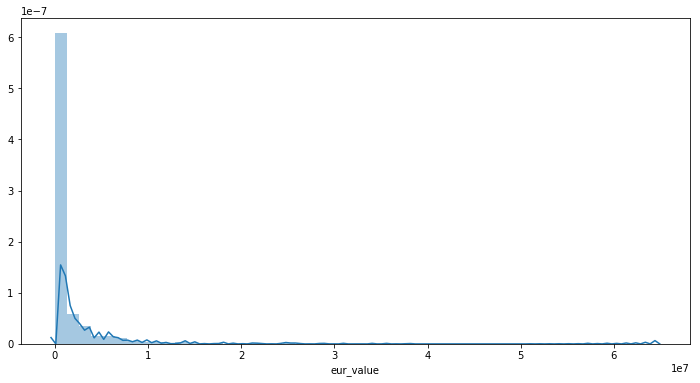

In [224]:
#let's look at distribution of eur_value.
plt.figure(figsize=(12, 6))
sns.distplot(df_gk['eur_value'])

Like above, the majority of GK's are not very valuable, whilst there are a few exceptionally valuable goalkeepers (right skew).

In [225]:
#drop zero & null values
df_gk = df_gk[df_gk['eur_value'].notnull() & (df_gk['eur_value'] != 0)]

#Log transform Y output values
df_gk['eur_value_log'] = np.log(df_gk['eur_value'])
df_gk.head()

,eur_value,overall,height_cm,weight_kg,age,pac,sho,pas,dri,def,...,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,prefer_foot,eur_value_log
4,61000000,92,193,92,31,91,90,95,89,60,...,10,10,11,91,90,95,91,89,1,17.926384
6,64500000,90,193,76,26,90,85,87,90,58,...,13,21,13,90,85,87,86,90,1,17.982176
12,59000000,89,199,94,25,85,91,69,88,49,...,11,18,16,85,91,69,86,88,0,17.893048
18,4500000,89,191,94,39,89,88,74,84,46,...,10,11,11,89,88,74,90,84,1,15.319588
20,57000000,88,189,82,24,84,90,77,84,52,...,14,12,18,84,90,77,87,84,1,17.858562


/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


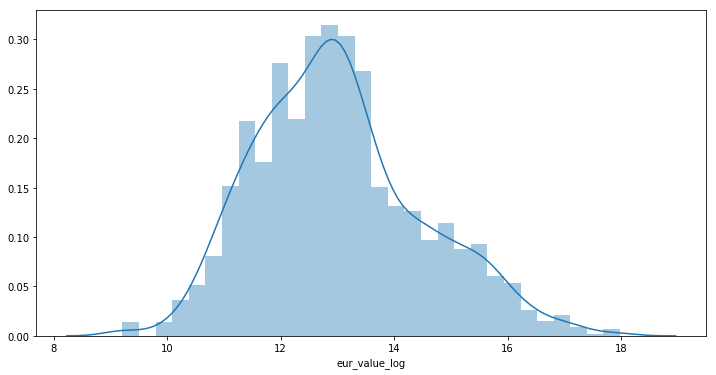

In [226]:
#Plot market value after taking the log of market value
plt.figure(figsize=(12, 6))
sns.distplot(df_gk['eur_value_log'])

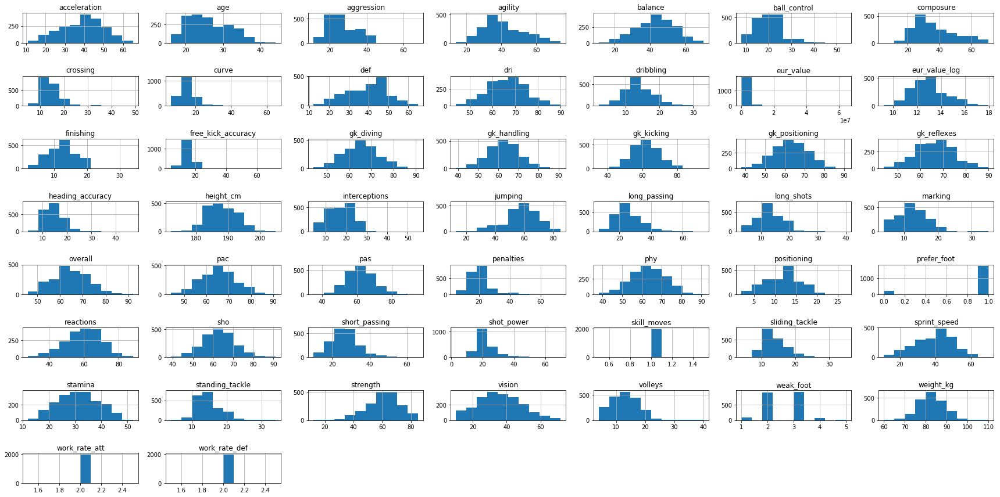

In [227]:
#Plot out distribution of stats
hist = df_gk.hist(figsize = (24,12))
plt.tight_layout()

GKs are poor at most non-goalkeeper specific stats. Their attributes are still mostly normally distributed. 

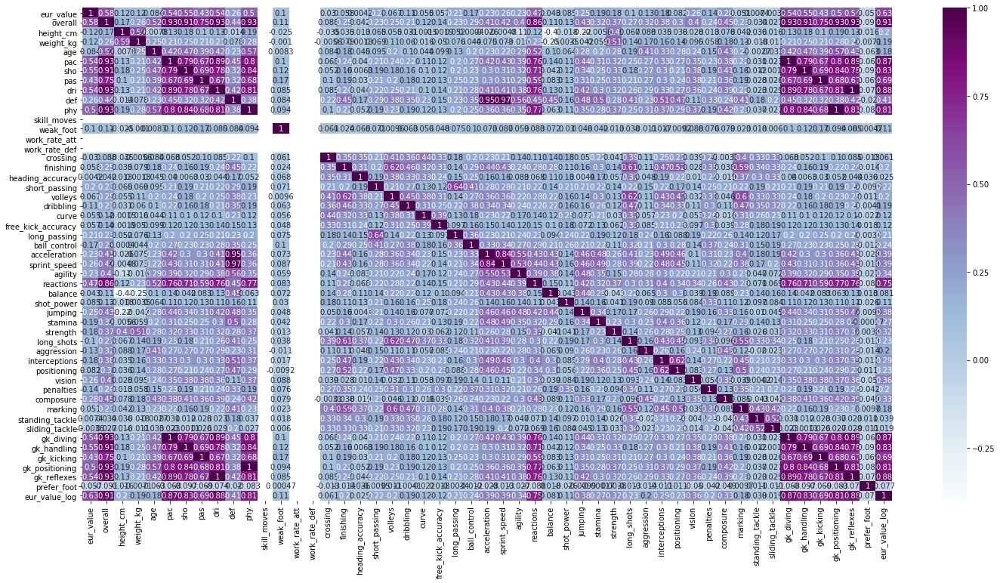

In [228]:
#Look at heatmap of correlations
df_gk_heat = df_gk.corr()
plt.figure(figsize=(24, 12))
sns.heatmap(df_gk_heat, annot= True, cmap = 'BuPu')

There are a few attributes that have no correlation with any other stats here.

There are also pockets of very high collinearity - all the GK stats. These need to be kept as they are key for goalkeepers (and separate them from all other players). 

Also for Goalkeepers, acceleration will be kept over sprint speed, as:
1. Most goalkeepers are slow
2. Getting off the line quickly is actually very important 
3. Top sprint speed doesn't matter as much as GK's don't have to sprint that far

In [229]:
#Investigate why there's no correlation between some predictor variables.
print('Unique Skill Move Values: ', list(df_gk.skill_moves.unique()))
print('Unique Attacking Work Rate Values: ', list(df_gk.work_rate_att.unique()))
print('Unique Defensive Work Rate Values: ', list(df_gk.work_rate_def.unique()))

Unique Skill Move Values:  [1]
Unique Attacking Work Rate Values:  [2]
Unique Defensive Work Rate Values:  [2]


All goalkeepers have the same value for these stats.  

In [230]:
#drop the parent stats & columns that are all the same
df_gk1 = df_gk.drop(columns = ['weight_kg', 'eur_value', 'overall', 'skill_moves', 'sprint_speed', 'work_rate_att', 'work_rate_def', 'pac', 'sho', 'pas', 'dri', 'def', 'phy'])

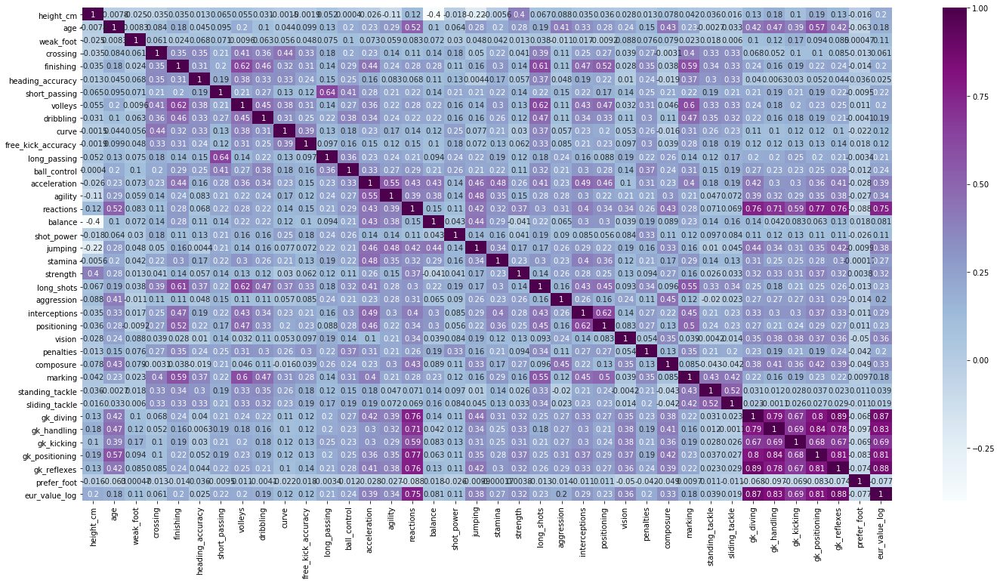

In [231]:
#Heatmap again. 
df_gk_heat = df_gk1.corr()
plt.figure(figsize=(24, 12))
sns.heatmap(df_gk_heat, annot = True, cmap = 'BuPu')

As discussed previously, there still have pocket of collinearity in the GK specific stats, but these will be left in as they're the only GK specific skills.

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<Figure size 864x432 with 0 Axes>

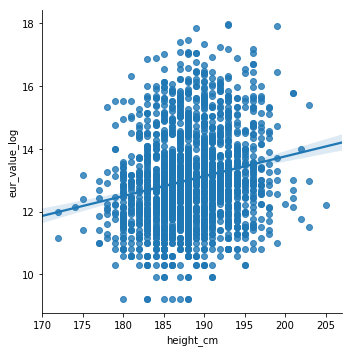

<Figure size 864x432 with 0 Axes>

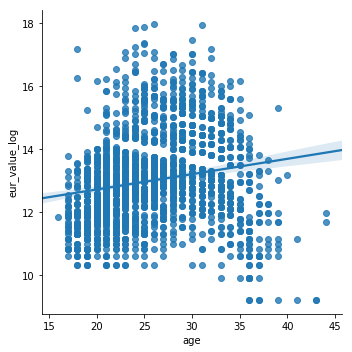

<Figure size 864x432 with 0 Axes>

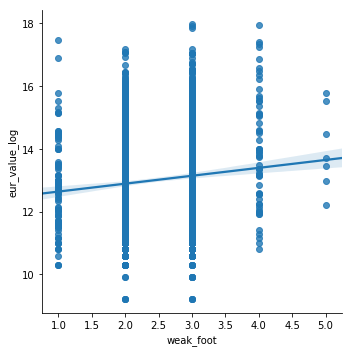

<Figure size 864x432 with 0 Axes>

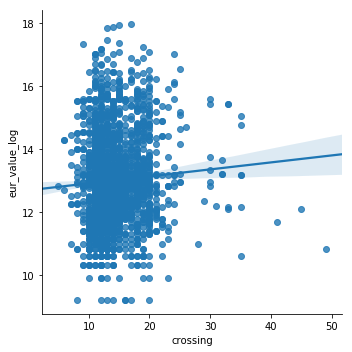

<Figure size 864x432 with 0 Axes>

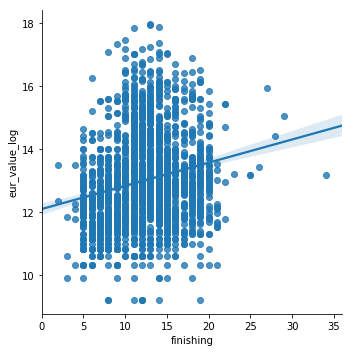

<Figure size 864x432 with 0 Axes>

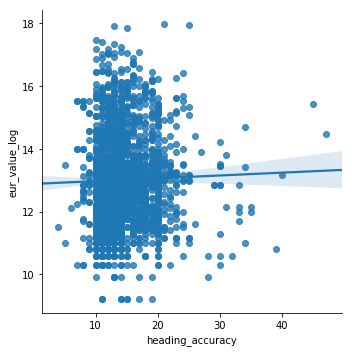

<Figure size 864x432 with 0 Axes>

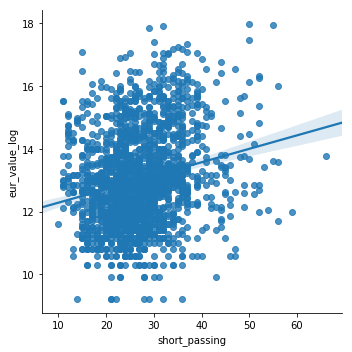

<Figure size 864x432 with 0 Axes>

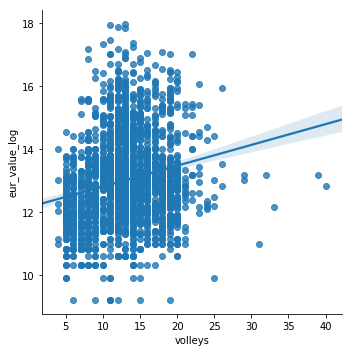

<Figure size 864x432 with 0 Axes>

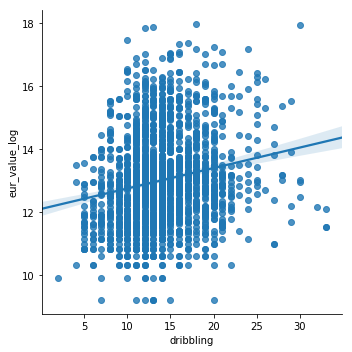

<Figure size 864x432 with 0 Axes>

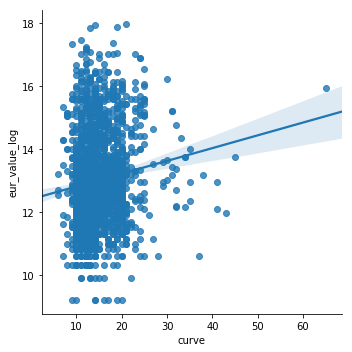

<Figure size 864x432 with 0 Axes>

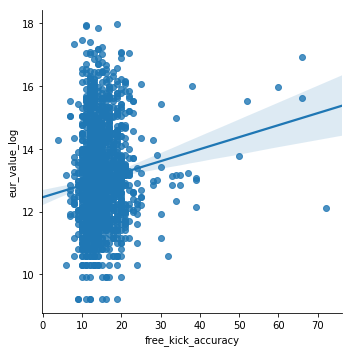

<Figure size 864x432 with 0 Axes>

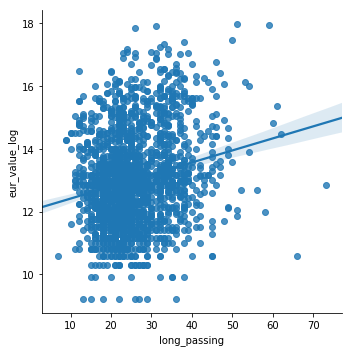

<Figure size 864x432 with 0 Axes>

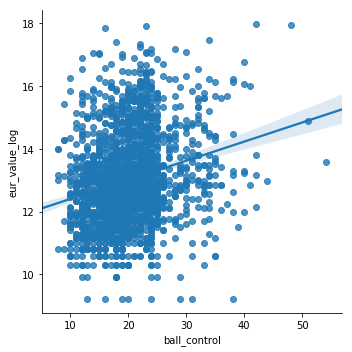

<Figure size 864x432 with 0 Axes>

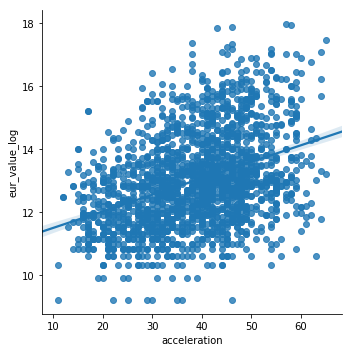

<Figure size 864x432 with 0 Axes>

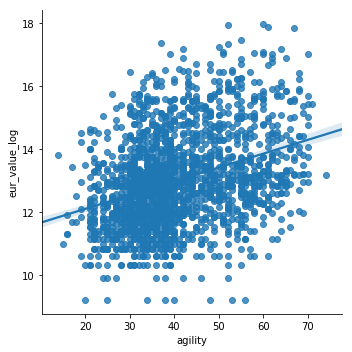

<Figure size 864x432 with 0 Axes>

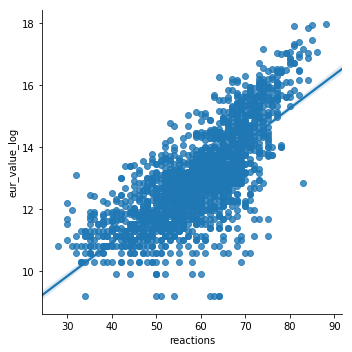

<Figure size 864x432 with 0 Axes>

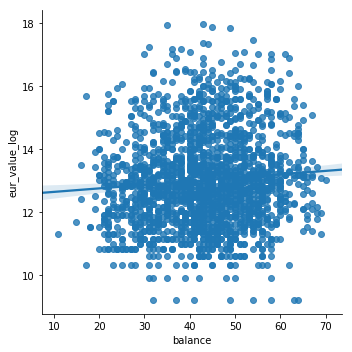

<Figure size 864x432 with 0 Axes>

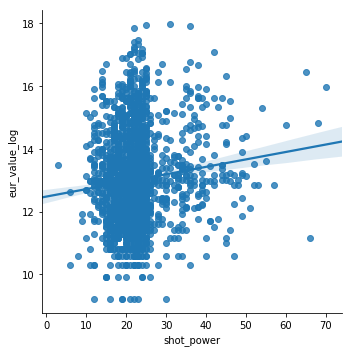

<Figure size 864x432 with 0 Axes>

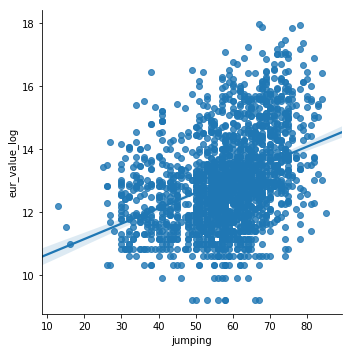

<Figure size 864x432 with 0 Axes>

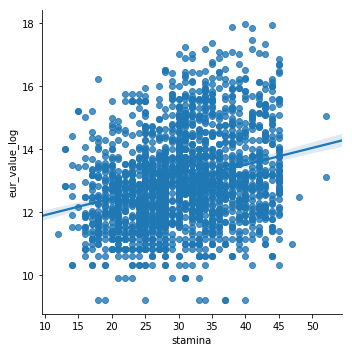

<Figure size 864x432 with 0 Axes>

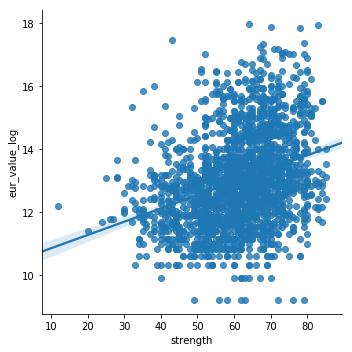

<Figure size 864x432 with 0 Axes>

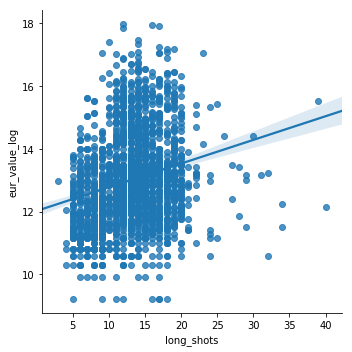

<Figure size 864x432 with 0 Axes>

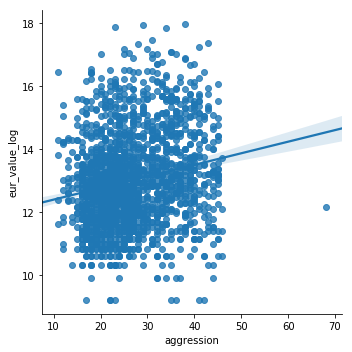

<Figure size 864x432 with 0 Axes>

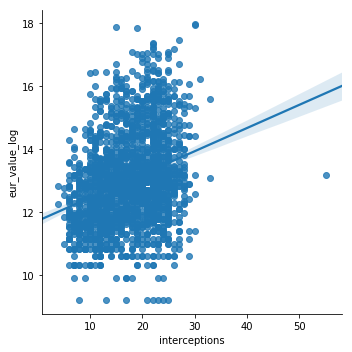

<Figure size 864x432 with 0 Axes>

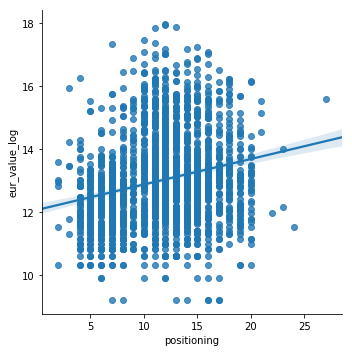

<Figure size 864x432 with 0 Axes>

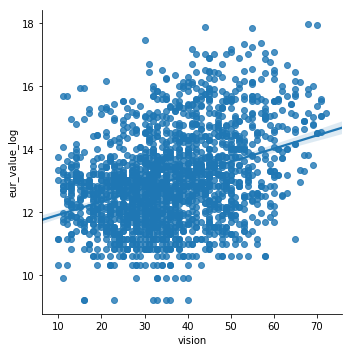

<Figure size 864x432 with 0 Axes>

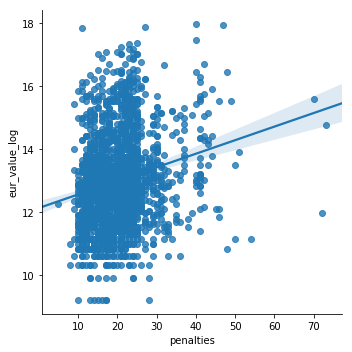

<Figure size 864x432 with 0 Axes>

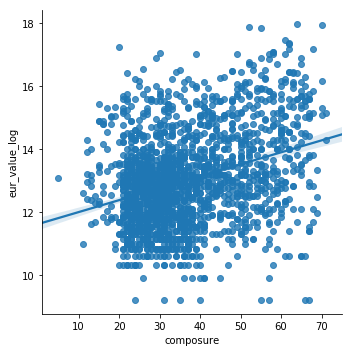

<Figure size 864x432 with 0 Axes>

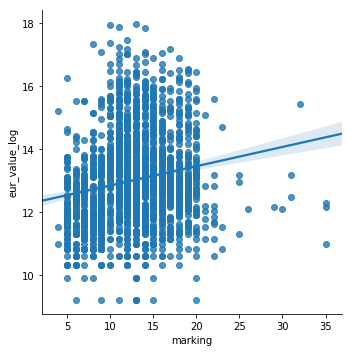

<Figure size 864x432 with 0 Axes>

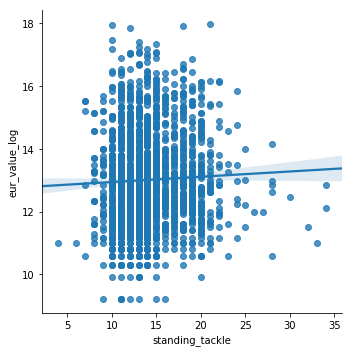

<Figure size 864x432 with 0 Axes>

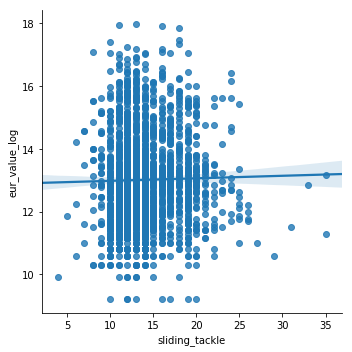

<Figure size 864x432 with 0 Axes>

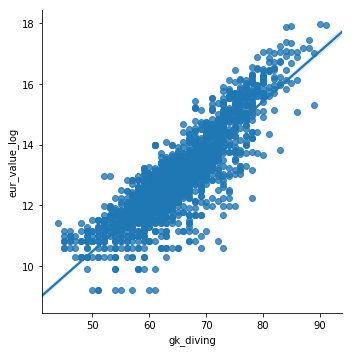

<Figure size 864x432 with 0 Axes>

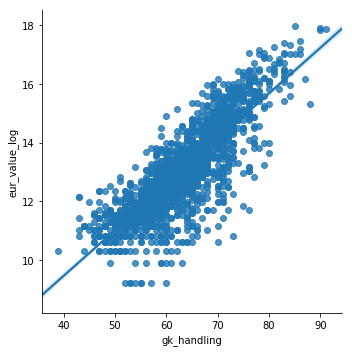

<Figure size 864x432 with 0 Axes>

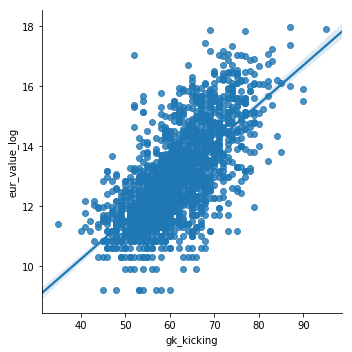

<Figure size 864x432 with 0 Axes>

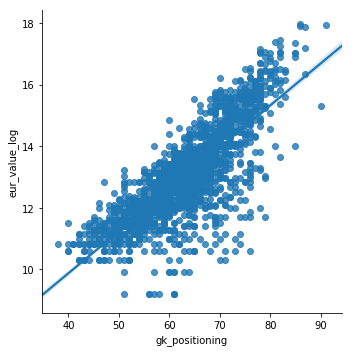

<Figure size 864x432 with 0 Axes>

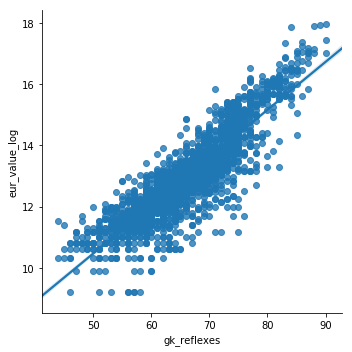

<Figure size 864x432 with 0 Axes>

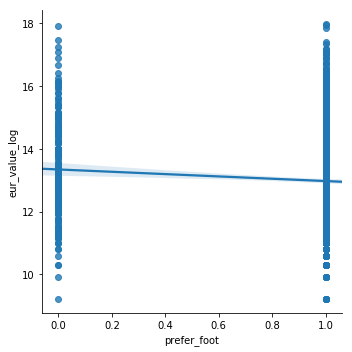

<Figure size 864x432 with 0 Axes>

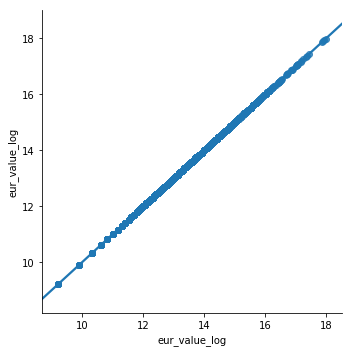

In [232]:
#Plot each variable against log of Eur value.
for col in df_gk1:
    plt.figure(figsize=(12, 6))
    sns.lmplot(x = col, y='eur_value_log', data=df_gk1)

Since the relatively poor skill level of most goalkeepers at non-GK related skills, a linear line of best fit through is difficult to achieve. There is also the presence of some high influence points, which affects the fit.

## Model Fit - Goalkeepers

### Linear Regression

In [233]:
#set up our variables
X = df_gk1[['height_cm', 'age', 'weak_foot', 'crossing', 'finishing', 'heading_accuracy', 'short_passing'
            , 'volleys', 'dribbling', 'curve', 'free_kick_accuracy', 'long_passing', 'ball_control', 'acceleration'
            , 'agility', 'reactions', 'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots'
            , 'aggression', 'interceptions', 'positioning', 'vision', 'penalties', 'composure', 'marking'
            , 'standing_tackle', 'sliding_tackle', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_positioning'
            , 'gk_reflexes', 'prefer_foot']]
y = df_gk1['eur_value_log']

In [234]:
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [235]:
#create model
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [236]:
#See the Outputs
coefficients = pd.DataFrame(lm.coef_, X.columns, columns = ['Base OLS Coefficients'])
#insert intercept
coefficients.loc[len(coefficients)] = lm.intercept_
coefficients

,Base OLS Coefficients
height_cm,0.002103
age,-0.115202
weak_foot,-0.028168
crossing,-0.008840
finishing,-0.003899
heading_accuracy,-0.000005
short_passing,-0.000539
volleys,0.002614
dribbling,-0.009379
curve,0.000577


Text(0.5,1,'Actual v Predicted Value of Eur_Value_Log')

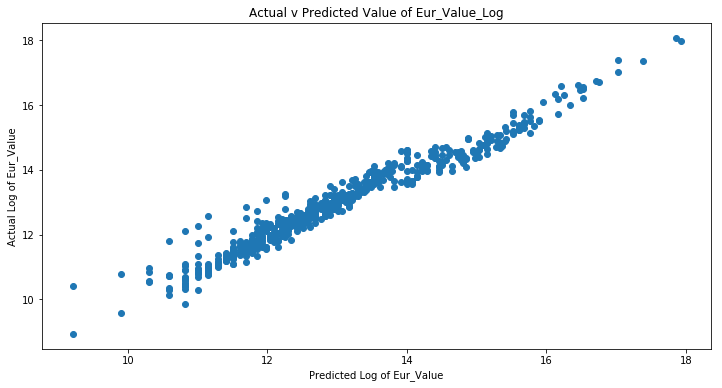

In [237]:
predictions = lm.predict(X_test)
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predictions)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('Actual v Predicted Value of Eur_Value_Log')

Linear model looks like a good fit for the data. Errors seem to be distributed randomly.

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


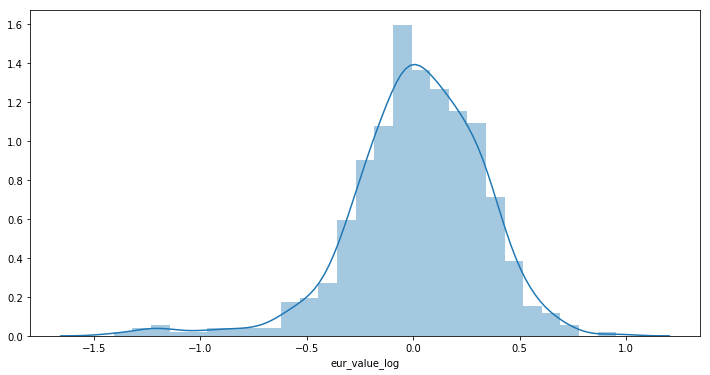

In [238]:
#Plot Errors
plt.figure(figsize=(12, 6))
sns.distplot(y_test-predictions)

Errors are normally distributed around zero.

In [239]:
#Evaluate error
mae = metrics.mean_absolute_error(y_test, predictions)
mse = metrics.mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))

MAE is: 0.2327577503063213
MSE is: 0.09595368708411216
RMSE is: 0.3097639215339839


K-Fold cross-validation to verify our MSE. 

In [240]:
#Implement the KFold Validation
cv_list = []
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = LinearRegression(), X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')
cv_ols = {'OLS MSE' : results.mean()*-1}
cv_list.append(cv_ols)
print('Average OLS MSE after 10-Fold Cross-Validation is', results.mean()*-1)

Average OLS MSE after 10-Fold Cross-Validation is 0.11042644136646555


In [241]:
#What's our R2 value?
print ('R2 Score:', lm.score(X_test, y_test))

R2 Score: 0.9550869318901218


In [242]:
#Calculate an AIC value for comparison
predict_val = lm.predict(X_test)
residuals = (y_test-predict_val)
sse = sum(residuals**2)
k = 38
AIC_ols = (2*k) - (2*np.log(sse))
print('AIC value is: ', AIC_ols)

AIC value is:  67.91065644916159


The OLS Linear Regression model for Goalkeeps performs exceptionally well, with an average MSE of 0.11 (10-Fold CV). However, this should be caveated with the fact that it consumes more variables than the OLS models for forwards, midfielders and defenders. Ridge and Lasso Regression should definitely be used to penalise the model for having more features. 

### Ridge Regression

The hyperparameter, α lets us control how much we penalize the coefficients, with higher values of α creating simpler models. It effectively shrinks the coefficients if there is a high degree of multicollinearity?

In [243]:
#set up an array with range of alphas to iterate through
alphas = 10**np.linspace(10,-2,100)*0.5

In [244]:
#set up our variables
X = df_gk1[['height_cm', 'age', 'weak_foot', 'crossing', 'finishing', 'heading_accuracy', 'short_passing'
            , 'volleys', 'dribbling', 'curve', 'free_kick_accuracy', 'long_passing', 'ball_control', 'acceleration'
            , 'agility', 'reactions', 'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots'
            , 'aggression', 'interceptions', 'positioning', 'vision', 'penalties', 'composure', 'marking'
            , 'standing_tackle', 'sliding_tackle', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_positioning'
            , 'gk_reflexes', 'prefer_foot']]
y = df_gk1['eur_value_log']

In [245]:
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [246]:
#Use cross-validation to determine optimum level of alpha versus MSE. Normalise Data!
ridgecv = RidgeCV(alphas = alphas, scoring = 'neg_mean_squared_error', normalize = True)
ridgecv.fit(X_train, y_train)
alpha_opt = ridgecv.alpha_
print('Optimum Alpha to minimise MSE is: ', alpha_opt)

Optimum Alpha to minimise MSE is:  0.005


In [247]:
#Model Fit & Evaluation Using Optimum Alpha
ridge = Ridge(alpha = alpha_opt, normalize = True)
ridge.fit(X_train, y_train)
mse_opt = mean_squared_error(y_test, ridge.predict(X_test))
print('MSE at Alpha {} is {}'.format(alpha_opt, mse_opt))

MSE at Alpha 0.005 is 0.09224097547729693


In [248]:
#Run 10-Fold Cross-Validation
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = ridge, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')
#save errors to variables, append to list of CV MSE errors
cv_ridge = {'Ridge MSE': results.mean()*-1}
cv_list.append(cv_ridge)
print('Average Ridge Regression MSE after 10-Fold Cross-Validation is', results.mean()*-1)

Average Ridge Regression MSE after 10-Fold Cross-Validation is 0.11163602847202037


In [249]:
#Calculate an AIC value for comparison
predict_val = ridge.predict(X_test)
residuals = (y_test-predict_val)
sse = sum(residuals**2)
k = 38
AIC_ridge = (2*k) - (2*np.log(sse))
print('AIC value for Ridge Regression is: ', AIC_ridge)

AIC value for Ridge Regression is:  67.9895788442112


In [250]:
#let's compare shrinkage of coefficients with OLS
coefficients_ridge = pd.DataFrame(ridge.coef_, X.columns, columns = ['Ridge Coefficients'])
#insert intercept
coefficients_ridge.loc[len(coefficients_ridge)] = ridge.intercept_
coefficient_table = coefficients.join(coefficients_ridge)
coefficient_table

,Base OLS Coefficients,Ridge Coefficients
height_cm,0.002103,0.003721
age,-0.115202,-0.111641
weak_foot,-0.028168,-0.031498
crossing,-0.008840,-0.001262
finishing,-0.003899,-0.002115
heading_accuracy,-0.000005,-0.001402
short_passing,-0.000539,0.000986
volleys,0.002614,0.001537
dribbling,-0.009379,-0.008075
curve,0.000577,-0.001080


In [251]:
#show the difference in MSE between OLS and Ridge
cv_list

[{'OLS MSE': 0.11042644136646555}, {'Ridge MSE': 0.11163602847202037}]

For Midfielders, Ridge Regression provided no meaningful improvement in the 10-Fold Cross-Validated MSE compared with the base 10-Fold Cross-Validated OLS regression.

### Lasso Regression

In [252]:
#set up the lasso cross validation process
lasso = Lasso(max_iter = 10000, normalize = True)
lassocv = LassoCV(alphas = None, cv = 10, max_iter = 100000, normalize = True)
lassocv.fit(X_train, y_train)
alpha_opt = lassocv.alpha_
print('Optimum Alpha to minimise Lasso MSE is: ', alpha_opt)

Optimum Alpha to minimise Lasso MSE is:  0.00023056540388660028


In [253]:
#Model Fit & Evaluation
lasso.set_params(alpha=lassocv.alpha_)
lasso.fit(X_train, y_train)
mean_squared_error(y_test, lasso.predict(X_test))
mse_opt = mean_squared_error(y_test, lasso.predict(X_test))
print('MSE at Alpha {} is {}'.format(alpha_opt, mse_opt))

MSE at Alpha 0.00023056540388660028 is 0.09020415254049784


In [254]:
#Run 10-Fold Cross-Validation
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = lasso, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

#save errors to variables, append to list of CV MSE errors
cv_lasso = {'Lasso MSE': results.mean()*-1}
cv_list.append(cv_lasso)
print('Average Lasso MSE after 10-Fold Cross-Validation is', results.mean()*-1)

Average Lasso MSE after 10-Fold Cross-Validation is 0.10966150333608589


<b> AIC: </b> Can AIC for Lasso be calculated given reduction of coefficients to zero? Literature is unclear.

In [255]:
#let's compare oefficients with other models
coefficients_lasso = pd.DataFrame(lasso.coef_, X.columns, columns = ['Lasso Coefficients'])
#insert intercept
coefficients_lasso.loc[len(coefficients_lasso)] = lasso.intercept_
coefficient_table.join(coefficients_lasso)

,Base OLS Coefficients,Ridge Coefficients,Lasso Coefficients
height_cm,0.002103,0.003721,0.002006
age,-0.115202,-0.111641,-0.109609
weak_foot,-0.028168,-0.031498,-0.016213
crossing,-0.008840,-0.001262,-0.000000
finishing,-0.003899,-0.002115,-0.000000
heading_accuracy,-0.000005,-0.001402,-0.000000
short_passing,-0.000539,0.000986,0.000000
volleys,0.002614,0.001537,0.000000
dribbling,-0.009379,-0.008075,-0.004312
curve,0.000577,-0.001080,-0.000000


In [256]:
#show the difference in MSE between OLS and Ridge
cv_list

[{'OLS MSE': 0.11042644136646555},
 {'Ridge MSE': 0.11163602847202037},
 {'Lasso MSE': 0.10966150333608589}]

Lasso Regression performed better on 10-Fold Cross Validated MSE when compared with Ridge Regression and the OLS Regression. A significant number of features were reduced to zero with the Lasso (not unexpected), leaving the model with 16 predictor variables.

### Recursive Feature Elimination (RFE)

As an alternative, RFE and Cross-Validation can be used as an automated way to to cut down features.

In [257]:
#set up our variables
X = df_gk1[['height_cm', 'age', 'weak_foot', 'crossing', 'finishing', 'heading_accuracy', 'short_passing'
            , 'volleys', 'dribbling', 'curve', 'free_kick_accuracy', 'long_passing', 'ball_control', 'acceleration'
            , 'agility', 'reactions', 'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots'
            , 'aggression', 'interceptions', 'positioning', 'vision', 'penalties', 'composure', 'marking'
            , 'standing_tackle', 'sliding_tackle', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_positioning'
            , 'gk_reflexes', 'prefer_foot']]
y = df_gk1['eur_value_log']

RFE CV can suggest which variables are most important using cross-validation processes.

In [258]:
#Set Up Dataframe of All Features
df_new = pd.DataFrame(data = df_gk1.columns, columns = ['attributes'])

#define model to use
linreg = LinearRegression()

#Set UP RFECV, using MSE as primary measurement metric and 5 folds
rfecv = RFECV(estimator=linreg, step=1, cv=KFold(5), scoring='neg_mean_squared_error')

#Fit RFECV to Model
rfecv.fit(X, y)

RFECV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
   estimator=LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False),
   n_jobs=1, scoring='neg_mean_squared_error', step=1, verbose=0)

In [259]:
#Where MSE is minimised, how many features are in the model?
rfecv.n_features_

9

In [260]:
#Create df of RFE Booleans
support = pd.DataFrame(data = rfecv.support_, columns = ['importance_flg'])

#Concat the columngs together
classifier = pd.concat([support, df_new], axis=1)

#Drop the last row, as this is our target variable
a = classifier.drop(len(classifier)-1)
b = a.loc[a['importance_flg'] == True]

#Convert to list, show us which attributes are important
c = list(b['attributes'])
c

['age',
 'weak_foot',
 'reactions',
 'gk_diving',
 'gk_handling',
 'gk_kicking',
 'gk_positioning',
 'gk_reflexes',
 'prefer_foot']

According to RFECV, almost all of the input variables were dropped:, aside from the goalkeeping specific stats. This bodes well for the model, as many of these variables should logically have been irrelevant to goalkeeping value. 

In [261]:
#Set Up model to read target and predictor variables
X = df_gk1[c]
y = df_gk1['eur_value_log']

#Train Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#Set Up & Fit Model
lm = LinearRegression()
lm.fit(X_train, y_train)

#pull predictions
predictions = lm.predict(X_test)


#Run 10-Fold Cross-Validation
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = LinearRegression(), X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

#save errors to variables, append to list of CV MSE errors
cv_rfe= {'RFE OLS MSE': results.mean()*-1}
cv_list.append(cv_rfe)

In [262]:
cv_list

[{'OLS MSE': 0.11042644136646555},
 {'Ridge MSE': 0.11163602847202037},
 {'Lasso MSE': 0.10966150333608589},
 {'RFE OLS MSE': 0.10518308921643778}]

In [263]:
#What's our R2 value?
print ('R2 Score:', lm.score(X_test, y_test))

R2 Score: 0.9516860245867641


In [264]:
#Calculate an AIC value for comparison
predict_val = lm.predict(X_test)
residuals = (y_test-predict_val)
sse = sum(residuals**2)
k = 9
AIC = (2*k) - (2*np.log(sse))
print('AIC value is: ', AIC)

AIC value is:  9.739664683979392


Using RFE CV, there is a decrease in 10-Fold CV MSE when compared with the base OLS. Note that the AIC value is also significantly less than the base OLS models after stripping away so many variables. The RFE OLS is the clear winner here, with the lowest error rate as well as the fewest features. 

### Random Forest Regression

While normally used as a tool for classification problems, we can also use Random Forests for Regression.

In [265]:
#set up our variables
X = df_gk1[['height_cm', 'age', 'weak_foot', 'crossing', 'finishing', 'heading_accuracy', 'short_passing'
            , 'volleys', 'dribbling', 'curve', 'free_kick_accuracy', 'long_passing', 'ball_control', 'acceleration'
            , 'agility', 'reactions', 'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots'
            , 'aggression', 'interceptions', 'positioning', 'vision', 'penalties', 'composure', 'marking'
            , 'standing_tackle', 'sliding_tackle', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_positioning'
            , 'gk_reflexes', 'prefer_foot']]
y = df_gk1['eur_value_log']

In [266]:
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [267]:
#Set up Model & Fit model to test data
RGR = RandomForestRegressor(n_jobs=-1)
RGR.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

Text(0.5,1,'Actual v Predicted Value of Eur_Value_Log')

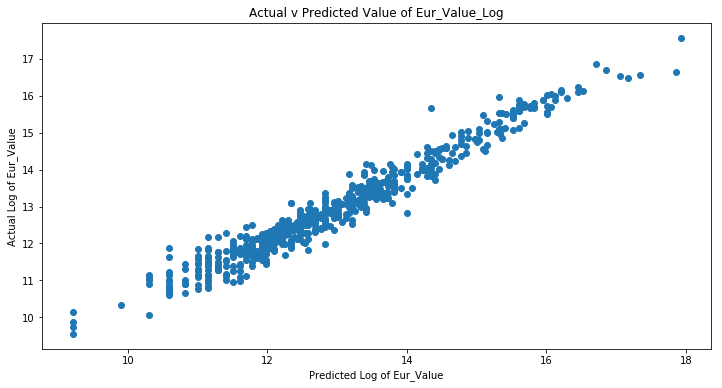

In [268]:
#plot graph
predictions = RGR.predict(X_test)
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predictions)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('Actual v Predicted Value of Eur_Value_Log')

/Users/dean/anaconda/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


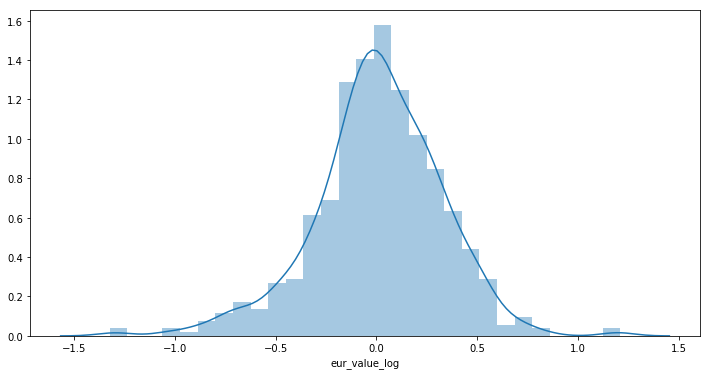

In [269]:
#Plot Errors
plt.figure(figsize=(12, 6))
sns.distplot(y_test-predictions)

In [270]:
#Run 10-Fold Cross-Validation on New Model - Evaluate Error
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = RGR, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predictions)
mse = metrics.mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('R2 Score is: ' + str(RGR.score(X_test, y_test)))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.2396930322908219
MSE is: 0.10210332959533044
RMSE is: 0.31953611626126155
R2 Score is: 0.9534201839773476
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.10528392546282435


In respect of MSE, Random Forest Regression appears to have a small improvement on the RFE OLS Regression model. We can continue to improve the MSE via optimising the hyperparameters.

### Random Forest Regression Optimisation

The key parameters we can optimise are:
1. n_estimators - the number of trees in the forest. This will generally be more accurate the higher you go.
2. max_features - The number of features to consider when looking for the best split. Documentation indicates that the default value is the total number of features in the data. This seems too high. <i> The Elements of Statistical Learning: 2nd Edition </i> (Hastie et. al. 2009, p. 592) indicates that it should be around <b>n/3</b> features, where n is the total number of features in the data. 
3. min_samples_leaf - The minimum number of samples required to be at a leaf node (default = 1)

In [271]:
#Set up Parameters
#Execute Grid Search - Warning - will take approx. 9 mins. 
param_grid = {'n_estimators': np.arange(7,21), 'max_features': np.arange(7,16),'min_samples_leaf':[1,2,3,4]}
Grid = GridSearchCV(RGR, param_grid, verbose = 2)
Grid.fit(X_train, y_train)

Fitting 3 folds for each of 504 candidates, totalling 1512 fits
[CV] max_features=7, min_samples_leaf=1, n_estimators=7 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=7 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=7 ..............


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=7 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=7 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=7 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=8 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=8 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=8 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=8 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=8 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=8 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=9 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=9 ..............
[CV] ..... max_features=7, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=7, min_samples_leaf=1, n_estimators=9 ..............
[CV] .

[CV] .... max_features=7, min_samples_leaf=2, n_estimators=12 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=13 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=13 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=13 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=13 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=13 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=13 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=14 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=14 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=14 .............
[CV] .... max_features=7, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=7, min_samples_leaf=2, n_estimators=15 .............
[CV] .

[CV] .... max_features=7, min_samples_leaf=3, n_estimators=18 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=18 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=18 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=18 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=18 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=19 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=19 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=19 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=19 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=19 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=19 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=20 .............
[CV] .... max_features=7, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=7, min_samples_leaf=3, n_estimators=20 .............
[CV] .

[CV] ..... max_features=8, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=9 ..............
[CV] ..... max_features=8, min_samples_leaf=1, n_estimators=9 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=10 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=10 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=10 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=10 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=10 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=10 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=11 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=11 .............
[CV] .... max_features=8, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=8, min_samples_leaf=1, n_estimators=11 .............
[CV] .

[CV] .... max_features=8, min_samples_leaf=2, n_estimators=14 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=15 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=15 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=15 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=15 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=15 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=15 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=16 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=16 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=16 .............
[CV] .... max_features=8, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=8, min_samples_leaf=2, n_estimators=17 .............
[CV] .

[CV] .... max_features=8, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=8, min_samples_leaf=3, n_estimators=20 .............
[CV] .... max_features=8, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=8, min_samples_leaf=3, n_estimators=20 .............
[CV] .... max_features=8, min_samples_leaf=3, n_estimators=20 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=7 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=7 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=7 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=7 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=7 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=7 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=8 ..............
[CV] ..... max_features=8, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=8, min_samples_leaf=4, n_estimators=8 ..............
[CV] .

[CV] .... max_features=9, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=11 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=11 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=12 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=12 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=12 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=12 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=12 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=12 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=13 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=13 .............
[CV] .... max_features=9, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=9, min_samples_leaf=1, n_estimators=13 .............
[CV] .

[CV] .... max_features=9, min_samples_leaf=2, n_estimators=16 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=17 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=17 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=17 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=17 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=17 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=17 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=18 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=18 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=18 .............
[CV] .... max_features=9, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=9, min_samples_leaf=2, n_estimators=19 .............
[CV] .

[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=8 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=8 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=8 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=9 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=9 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=9 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=9 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=9 ..............
[CV] ..... max_features=9, min_samples_leaf=4, n_estimators=9 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=10 .............
[CV] .... max_features=9, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=9, min_samples_leaf=4, n_estimators=10 .............
[CV] .

[CV] ... max_features=10, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=13 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=13 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=14 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=14 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=14 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=14 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=14 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=14 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=15 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=15 ............
[CV] ... max_features=10, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=10, min_samples_leaf=1, n_estimators=15 ............
[CV] .

[CV] ... max_features=10, min_samples_leaf=2, n_estimators=18 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=19 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=19 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=19 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=19 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=19 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=19 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=20 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=20 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=10, min_samples_leaf=2, n_estimators=20 ............
[CV] ... max_features=10, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=10, min_samples_leaf=3, n_estimators=7 .............
[CV] .

[CV] ... max_features=10, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=10 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=10 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=10 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=11 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=11 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=11 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=11 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=11 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=11 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=12 ............
[CV] ... max_features=10, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=10, min_samples_leaf=4, n_estimators=12 ............
[CV] .

[CV] ... max_features=11, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=15 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=15 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=16 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=16 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=16 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=16 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=16 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=16 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=17 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=17 ............
[CV] ... max_features=11, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=11, min_samples_leaf=1, n_estimators=17 ............
[CV] .

[CV] ... max_features=11, min_samples_leaf=2, n_estimators=20 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=7 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=7 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=7 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=7 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=7 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=7 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=8 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=8 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=8 .............
[CV] .... max_features=11, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=11, min_samples_leaf=3, n_estimators=9 .............
[CV] .

[CV] ... max_features=11, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=12 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=12 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=12 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=13 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=13 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=13 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=13 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=13 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=13 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=14 ............
[CV] ... max_features=11, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=11, min_samples_leaf=4, n_estimators=14 ............
[CV] .

[CV] ... max_features=12, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=17 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=17 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=18 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=18 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=18 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=18 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=18 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=18 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=19 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=19 ............
[CV] ... max_features=12, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=12, min_samples_leaf=1, n_estimators=19 ............
[CV] .

[CV] .... max_features=12, min_samples_leaf=3, n_estimators=8 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=9 .............
[CV] .... max_features=12, min_samples_leaf=3, n_estimators=9 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=9 .............
[CV] .... max_features=12, min_samples_leaf=3, n_estimators=9 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=9 .............
[CV] .... max_features=12, min_samples_leaf=3, n_estimators=9 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=10 ............
[CV] ... max_features=12, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=10 ............
[CV] ... max_features=12, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=10 ............
[CV] ... max_features=12, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=12, min_samples_leaf=3, n_estimators=11 ............
[CV] .

[CV] ... max_features=12, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=14 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=14 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=14 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=15 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=15 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=15 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=15 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=15 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=15 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=16 ............
[CV] ... max_features=12, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=12, min_samples_leaf=4, n_estimators=16 ............
[CV] .

[CV] ... max_features=13, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=19 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=19 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=20 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=20 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=20 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=20 -   0.2s
[CV] max_features=13, min_samples_leaf=1, n_estimators=20 ............
[CV] ... max_features=13, min_samples_leaf=1, n_estimators=20 -   0.2s
[CV] max_features=13, min_samples_leaf=2, n_estimators=7 .............
[CV] .... max_features=13, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=13, min_samples_leaf=2, n_estimators=7 .............
[CV] .... max_features=13, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=13, min_samples_leaf=2, n_estimators=7 .............
[CV] .

[CV] ... max_features=13, min_samples_leaf=3, n_estimators=10 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=11 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=11 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=11 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=11 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=11 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=11 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=12 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=12 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=12 ............
[CV] ... max_features=13, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=13, min_samples_leaf=3, n_estimators=13 ............
[CV] .

[CV] ... max_features=13, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=16 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=16 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=16 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=17 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=17 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=17 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=17 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=17 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=17 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=18 ............
[CV] ... max_features=13, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=13, min_samples_leaf=4, n_estimators=18 ............
[CV] .

[CV] .... max_features=14, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=7 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=7 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=8 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=8 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=8 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=8 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=8 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=8 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=9 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=9 .............
[CV] .... max_features=14, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=14, min_samples_leaf=2, n_estimators=9 .............
[CV] .

[CV] ... max_features=14, min_samples_leaf=3, n_estimators=12 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=13 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=13 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=13 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=13 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=13 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=13 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=14 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=14 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=14 ............
[CV] ... max_features=14, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=14, min_samples_leaf=3, n_estimators=15 ............
[CV] .

[CV] ... max_features=14, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=18 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=18 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=18 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=19 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=19 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=19 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=19 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=19 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=19 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=20 ............
[CV] ... max_features=14, min_samples_leaf=4, n_estimators=20 -   0.2s
[CV] max_features=14, min_samples_leaf=4, n_estimators=20 ............
[CV] .

[CV] .... max_features=15, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=9 .............
[CV] .... max_features=15, min_samples_leaf=2, n_estimators=9 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=10 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=10 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=10 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=10 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=10 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=10 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=11 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=11 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=11 ............
[CV] ... max_features=15, min_samples_leaf=2, n_estimators=11 -   0.2s
[CV] max_features=15, min_samples_leaf=2, n_estimators=11 ............
[CV] .

[CV] ... max_features=15, min_samples_leaf=3, n_estimators=14 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=15 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=15 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=15 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=15 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=15 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=15 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=16 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=16 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=16 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=16 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=16 ............
[CV] ... max_features=15, min_samples_leaf=3, n_estimators=16 -   0.2s
[CV] max_features=15, min_samples_leaf=3, n_estimators=17 ............
[CV] .

[CV] ... max_features=15, min_samples_leaf=4, n_estimators=20 -   0.2s
[CV] max_features=15, min_samples_leaf=4, n_estimators=20 ............
[CV] ... max_features=15, min_samples_leaf=4, n_estimators=20 -   0.2s
[CV] max_features=15, min_samples_leaf=4, n_estimators=20 ............
[CV] ... max_features=15, min_samples_leaf=4, n_estimators=20 -   0.2s


[Parallel(n_jobs=1)]: Done 1512 out of 1512 | elapsed:  5.6min finished


GridSearchCV(cv=None, error_score='raise',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'n_estimators': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]), 'max_features': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15]), 'min_samples_leaf': [1, 2, 3, 4]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=2)

In [272]:
#Pull out optimum parameters
Grid.best_params_

{'max_features': 15, 'min_samples_leaf': 1, 'n_estimators': 17}

The Grid Search has identified the above values to be the optimum values. These values will be used in a new Random Forest Regression to see the impact on MSE. 

In [273]:
#Rebuild Model using Optimum Parameters
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#Fit Model
RGR_new = RandomForestRegressor(n_estimators = 17, max_features = 15, min_samples_leaf = 1)
RGR_new.fit(X_train, y_train)
prediction = RGR_new.predict(X_test)

In [274]:
#Run 10-Fold Cross-Validation on New Model
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = RGR_new, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, prediction)
mse = metrics.mean_squared_error(y_test, prediction)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('R2 Score is: ' + str(RGR_new.score(X_test, y_test)))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.2549381931531444
MSE is: 0.11079706173257958
RMSE is: 0.3328619259281235
R2 Score is: 0.9483827465214579
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.12039798556528895


The tuning of hyperparameters did not appear to have an impact on MSE. 

In [275]:
#Key Features
importances = RGR.feature_importances_
indices = np.argsort(importances)
features = X.columns

Text(0.5,0,'Relative Importance')

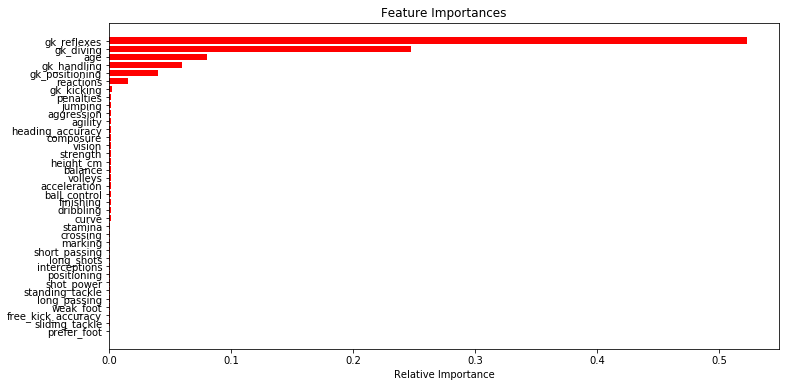

In [276]:
plt.figure(figsize = (12,6))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='r', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')

Goalkeeping reflexes have an outsized importance in the Random Forest Regression Model, followed by diving. It makes sense from an intuitive point of view, as these are the key stats that classify whether a goalkeeper can stop a shot. Other goalkeeping stats relate to distribution of the ball to outfield players. 

### Support Vector Regression

Another predictive technique that could be used is support vector regression. This another regression technique that can pull the data into higher dimensions to create a closer line of fit, at the cost of explanation (i.e. I would not be able to explain exactly what 'features' the model is using).

In [277]:
#Set up Data
#set up our variables
X = df_gk1[['height_cm', 'age', 'weak_foot', 'crossing', 'finishing', 'heading_accuracy', 'short_passing'
            , 'volleys', 'dribbling', 'curve', 'free_kick_accuracy', 'long_passing', 'ball_control', 'acceleration'
            , 'agility', 'reactions', 'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots'
            , 'aggression', 'interceptions', 'positioning', 'vision', 'penalties', 'composure', 'marking'
            , 'standing_tackle', 'sliding_tackle', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_positioning'
            , 'gk_reflexes', 'prefer_foot']]
y = df_gk1['eur_value_log']

In [278]:
#Requires Scaling of Data
scalar = StandardScaler()
scalar.fit(X)
scaled_features = scalar.transform(X)
df_scaled = pd.DataFrame(data = scaled_features, columns = X.columns)

In [279]:
#Set up Scaled Data
X = df_scaled
y = df_gk1['eur_value_log']

#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [280]:
#Instantiate a few models, evaluate best fit - start with the radial basis function
svr_rbf = SVR(kernel = 'rbf')
svr_rbf.fit(X_train, y_train)
predict_val_rbf = svr_rbf.predict(X_test)

#Try the linear model
svr_lin = SVR(kernel = 'linear')
svr_lin.fit(X_train, y_train)
predict_val_lin = svr_lin.predict(X_test)

#Try the polynomial model
svr_poly = SVR(kernel = 'poly')
svr_poly.fit(X_train, y_train)
predict_val_poly = svr_poly.predict(X_test)

In [281]:
#Run 10-Fold Cross-Validation on RBF
svr_list = []
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_rbf, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_rbf)
mse = metrics.mean_squared_error(y_test, predict_val_rbf)
rmse = np.sqrt(mse)

rbf = {'RBF SVR MSE' : results.mean()*-1}
svr_list.append(rbf)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('Average MSE for RBF SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.2691089596067401
MSE is: 0.19022936203040738
RMSE is: 0.43615291129420125
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.19766663442704324


Text(0.5,1,'SVR RBF Function - Actual v Predicted Value of Eur_Value_Log')

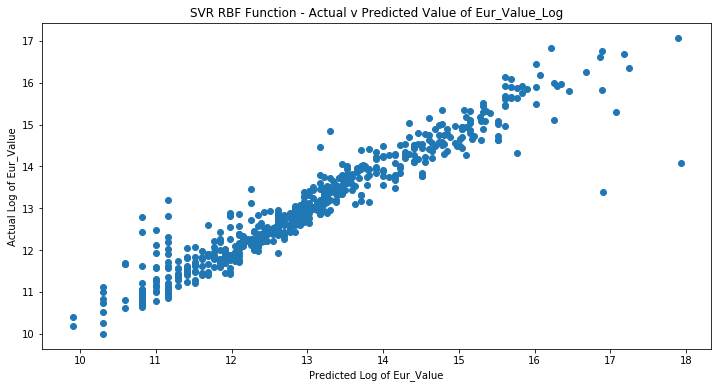

In [282]:
#Plot the functions as a comparison
#Plot the RBF function
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predict_val_rbf)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('SVR RBF Function - Actual v Predicted Value of Eur_Value_Log')

In [283]:
#linear SVR
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_lin, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_lin)
mse = metrics.mean_squared_error(y_test, predict_val_lin)
rmse = np.sqrt(mse)

lin = {'Linear SVR MSE' : results.mean()*-1}
svr_list.append(lin)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('Average MSE for Linear SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.22624116423165128
MSE is: 0.1203102391925675
RMSE is: 0.3468576641687012
Average MSE for Linear SVR after 10-Fold Cross-Validation is 0.11258161100333042


Text(0.5,1,'SVR Linear Function - Actual v Predicted Value of Eur_Value_Log')

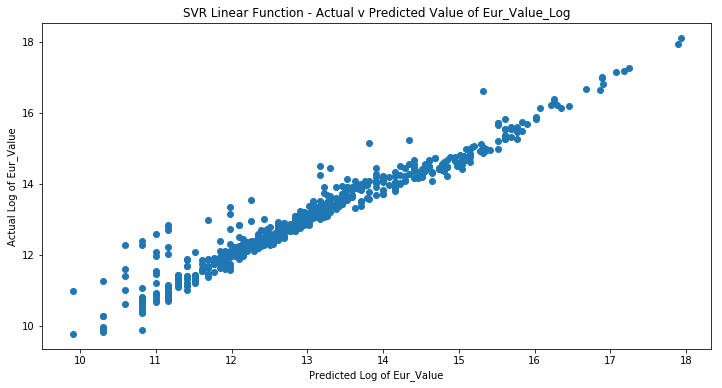

In [284]:
#linear
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predict_val_lin)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('SVR Linear Function - Actual v Predicted Value of Eur_Value_Log')

In [285]:
#Poly SVR
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_poly, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_poly)
mse = metrics.mean_squared_error(y_test, predict_val_poly)
rmse = np.sqrt(mse)

poly = {'Poly SVR MSE' : results.mean()*-1}
svr_list.append(poly)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('Average MSE for Poly SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.48297192073724504
MSE is: 0.886544158127371
RMSE is: 0.941564739212005
Average MSE for Poly SVR after 10-Fold Cross-Validation is 0.6826184479412383


Text(0.5,1,'SVR Polynomial Function - Actual v Predicted Value of Eur_Value_Log')

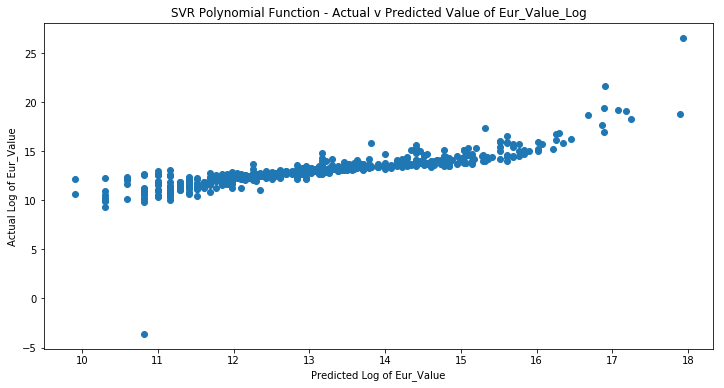

In [286]:
#Plot the Poly function
plt.figure(figsize=(12, 6))
plt.scatter(y_test, predict_val_poly)
plt.xlabel('Predicted Log of Eur_Value')
plt.ylabel('Actual Log of Eur_Value')
plt.title('SVR Polynomial Function - Actual v Predicted Value of Eur_Value_Log')

In [287]:
#Output list of MSE values
svr_list

[{'RBF SVR MSE': 0.19766663442704324},
 {'Linear SVR MSE': 0.11258161100333042},
 {'Poly SVR MSE': 0.6826184479412383}]

### SVR Optimisation

It appears the linear function appears to have the closest set of predictions to actual target variables based on MSE. This kernel will be used going forward for optimisation. 

The parameters to be optimised are:
1. C (the error term) - Cost of misclassification on the training data. A higher C gives us lower bias(higher variance).  
2. ϵ (epsilon) - how lenient the model is in classifying an error. 

We will do this via brute force optimisation (Grid Search CV).

In [288]:
#Set up Parameters

#Built in range doesn't support floats for epsilon values, set up custom function
def frange(start, stop, step):
    i = start
    while i < stop:
        yield i
        i += step

#generate lists
epsilon_params = []
c_params = []

for i in frange(0.0, 1.0, 0.1):
    epsilon_params.append(i)

for i in frange(0.1, 2.0, 0.2):
    c_params.append(i)

In [289]:
#Execute Grid Search - Warning - will take approx. 4 mins. 
param_grid = {'C': c_params, 'epsilon': epsilon_params}
Grid = GridSearchCV(svr_lin, param_grid, verbose = 2)
Grid.fit(X_train, y_train)

Fitting 3 folds for each of 110 candidates, totalling 330 fits
[CV] C=0.1, epsilon=0.0 ..............................................
[CV] ..................................... C=0.1, epsilon=0.0 -   0.1s
[CV] C=0.1, epsilon=0.0 ..............................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] ..................................... C=0.1, epsilon=0.0 -   0.1s
[CV] C=0.1, epsilon=0.0 ..............................................
[CV] ..................................... C=0.1, epsilon=0.0 -   0.2s
[CV] C=0.1, epsilon=0.1 ..............................................
[CV] ..................................... C=0.1, epsilon=0.1 -   0.1s
[CV] C=0.1, epsilon=0.1 ..............................................
[CV] ..................................... C=0.1, epsilon=0.1 -   0.1s
[CV] C=0.1, epsilon=0.1 ..............................................
[CV] ..................................... C=0.1, epsilon=0.1 -   0.1s
[CV] C=0.1, epsilon=0.2 ..............................................
[CV] ..................................... C=0.1, epsilon=0.2 -   0.1s
[CV] C=0.1, epsilon=0.2 ..............................................
[CV] ..................................... C=0.1, epsilon=0.2 -   0.1s
[CV] C=0.1, epsilon=0.2 ..............................................
[CV] .

[CV] ...... C=0.30000000000000004, epsilon=0.8999999999999999 -   0.0s
[CV] C=0.30000000000000004, epsilon=0.8999999999999999 ...............
[CV] ...... C=0.30000000000000004, epsilon=0.8999999999999999 -   0.0s
[CV] C=0.30000000000000004, epsilon=0.8999999999999999 ...............
[CV] ...... C=0.30000000000000004, epsilon=0.8999999999999999 -   0.0s
[CV] C=0.30000000000000004, epsilon=0.9999999999999999 ...............
[CV] ...... C=0.30000000000000004, epsilon=0.9999999999999999 -   0.0s
[CV] C=0.30000000000000004, epsilon=0.9999999999999999 ...............
[CV] ...... C=0.30000000000000004, epsilon=0.9999999999999999 -   0.0s
[CV] C=0.30000000000000004, epsilon=0.9999999999999999 ...............
[CV] ...... C=0.30000000000000004, epsilon=0.9999999999999999 -   0.0s
[CV] C=0.5, epsilon=0.0 ..............................................
[CV] ..................................... C=0.5, epsilon=0.0 -   0.4s
[CV] C=0.5, epsilon=0.0 ..............................................
[CV] .

[CV] ..................................... C=0.7, epsilon=0.7 -   0.1s
[CV] C=0.7, epsilon=0.7 ..............................................
[CV] ..................................... C=0.7, epsilon=0.7 -   0.0s
[CV] C=0.7, epsilon=0.7999999999999999 ...............................
[CV] ...................... C=0.7, epsilon=0.7999999999999999 -   0.0s
[CV] C=0.7, epsilon=0.7999999999999999 ...............................
[CV] ...................... C=0.7, epsilon=0.7999999999999999 -   0.0s
[CV] C=0.7, epsilon=0.7999999999999999 ...............................
[CV] ...................... C=0.7, epsilon=0.7999999999999999 -   0.0s
[CV] C=0.7, epsilon=0.8999999999999999 ...............................
[CV] ...................... C=0.7, epsilon=0.8999999999999999 -   0.0s
[CV] C=0.7, epsilon=0.8999999999999999 ...............................
[CV] ...................... C=0.7, epsilon=0.8999999999999999 -   0.0s
[CV] C=0.7, epsilon=0.8999999999999999 ...............................
[CV] .

[CV] ...................... C=1.0999999999999999, epsilon=0.5 -   0.1s
[CV] C=1.0999999999999999, epsilon=0.5 ...............................
[CV] ...................... C=1.0999999999999999, epsilon=0.5 -   0.1s
[CV] C=1.0999999999999999, epsilon=0.6 ...............................
[CV] ...................... C=1.0999999999999999, epsilon=0.6 -   0.1s
[CV] C=1.0999999999999999, epsilon=0.6 ...............................
[CV] ...................... C=1.0999999999999999, epsilon=0.6 -   0.1s
[CV] C=1.0999999999999999, epsilon=0.6 ...............................
[CV] ...................... C=1.0999999999999999, epsilon=0.6 -   0.1s
[CV] C=1.0999999999999999, epsilon=0.7 ...............................
[CV] ...................... C=1.0999999999999999, epsilon=0.7 -   0.0s
[CV] C=1.0999999999999999, epsilon=0.7 ...............................
[CV] ...................... C=1.0999999999999999, epsilon=0.7 -   0.0s
[CV] C=1.0999999999999999, epsilon=0.7 ...............................
[CV] .

[CV] ...................... C=1.4999999999999998, epsilon=0.2 -   0.4s
[CV] C=1.4999999999999998, epsilon=0.30000000000000004 ...............
[CV] ...... C=1.4999999999999998, epsilon=0.30000000000000004 -   0.3s
[CV] C=1.4999999999999998, epsilon=0.30000000000000004 ...............
[CV] ...... C=1.4999999999999998, epsilon=0.30000000000000004 -   0.3s
[CV] C=1.4999999999999998, epsilon=0.30000000000000004 ...............
[CV] ...... C=1.4999999999999998, epsilon=0.30000000000000004 -   0.2s
[CV] C=1.4999999999999998, epsilon=0.4 ...............................
[CV] ...................... C=1.4999999999999998, epsilon=0.4 -   0.2s
[CV] C=1.4999999999999998, epsilon=0.4 ...............................
[CV] ...................... C=1.4999999999999998, epsilon=0.4 -   0.1s
[CV] C=1.4999999999999998, epsilon=0.4 ...............................
[CV] ...................... C=1.4999999999999998, epsilon=0.4 -   0.1s
[CV] C=1.4999999999999998, epsilon=0.5 ...............................
[CV] .

[CV] ...................... C=1.8999999999999997, epsilon=0.0 -   1.1s
[CV] C=1.8999999999999997, epsilon=0.0 ...............................
[CV] ...................... C=1.8999999999999997, epsilon=0.0 -   1.1s
[CV] C=1.8999999999999997, epsilon=0.0 ...............................
[CV] ...................... C=1.8999999999999997, epsilon=0.0 -   1.1s
[CV] C=1.8999999999999997, epsilon=0.1 ...............................
[CV] ...................... C=1.8999999999999997, epsilon=0.1 -   0.7s
[CV] C=1.8999999999999997, epsilon=0.1 ...............................
[CV] ...................... C=1.8999999999999997, epsilon=0.1 -   0.8s
[CV] C=1.8999999999999997, epsilon=0.1 ...............................
[CV] ...................... C=1.8999999999999997, epsilon=0.1 -   0.8s
[CV] C=1.8999999999999997, epsilon=0.2 ...............................
[CV] ...................... C=1.8999999999999997, epsilon=0.2 -   0.5s
[CV] C=1.8999999999999997, epsilon=0.2 ...............................
[CV] .

[Parallel(n_jobs=1)]: Done 330 out of 330 | elapsed:  1.0min finished


GridSearchCV(cv=None, error_score='raise',
       estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='auto',
  kernel='linear', max_iter=-1, shrinking=True, tol=0.001, verbose=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'C': [0.1, 0.30000000000000004, 0.5, 0.7, 0.8999999999999999, 1.0999999999999999, 1.2999999999999998, 1.4999999999999998, 1.6999999999999997, 1.8999999999999997], 'epsilon': [0.0, 0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6, 0.7, 0.7999999999999999, 0.8999999999999999, 0.9999999999999999]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=2)

In [290]:
#Pull out optimum parameters
Grid.best_params_

{'C': 0.5, 'epsilon': 0.30000000000000004}

In [291]:
#Rebuild Model using Optimum Parameters
#Train test split set-up
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#Fit Model
svr_lin = SVR(kernel = 'linear', C=0.5, epsilon = 0.3)
svr_lin.fit(X_train, y_train)
predict_val_lin = svr_lin.predict(X_test)

In [292]:
#Run 10-Fold Cross-Validation on New RBF
kfold = KFold(n_splits = 10)
results = cross_val_score(estimator = svr_lin, X = X_train, y = y_train, cv = kfold, scoring = 'neg_mean_squared_error')

mae = metrics.mean_absolute_error(y_test, predict_val_lin)
mse = metrics.mean_squared_error(y_test, predict_val_lin)
rmse = np.sqrt(mse)

print('MAE is: ' + str(mae))
print('MSE is: ' + str(mse))
print('RMSE is: ' + str(rmse))
print('R2 Score is: ' + str(svr_lin.score(X_test, y_test)))
print('Average MSE for Linear SVR after 10-Fold Cross-Validation is', results.mean()*-1)

MAE is: 0.23836459523821718
MSE is: 0.11005151843983935
RMSE is: 0.3317401369141807
R2 Score is: 0.950786624666494
Average MSE for RBF SVR after 10-Fold Cross-Validation is 0.10565875867507446


The Grid Search process achieved an 10-Fold Cross Validated MSE of 0.106, a small improvement over the unoptimised Linear Kernel SVR (MSE: 0.113).

<b>Conclusion:</b> Like for the other positions, the Support Vector Regression model proved to be the most effective at predicting a goalkeeper's market value. 